## Import the relevant libraries

In [94]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from scipy import stats
from IPython.display import display, HTML
import statsmodels.api as sm
import pylab
# figures inline in notebook
%matplotlib inline
np.set_printoptions(suppress=True)
pd.set_option('display.max_rows',20)

In [145]:
plt.rcParams['figure.figsize'] = [15,5]

## Load the dataset

In [3]:
data = pd.read_excel('SALESDATA.xls',index_col='Order Number')
sales_data = data.copy()
sales_data.head()

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,...,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M,Unnamed: 20,Unnamed: 21
Order Number,,,,,,,,,,,,,,,,,,,,,
200015,10000481,2017-04-30,-237.91,2017-04-30,100012,NaN,NaN,Urban Large Eggs,2000,0.00,...,237.91,0.00,0.0,237.91,237.910000,1,184,EA,NaN,U/M = unit of measure
200245,10002220,2017-07-14,368.79,2017-07-14,100233,P01,20910,Moms Sliced Turkey,1000,824.96,...,456.17,824.96,0.0,456.17,456.170000,1,127,EA,NaN,NaN
213157,10002220,2017-10-17,109.73,2017-10-17,116165,P01,38076,Cutting Edge Foot-Long Hot Dogs,1000,548.66,...,438.93,548.66,0.0,438.93,438.930000,1,127,EA,NaN,EA = each
200107,10002489,2017-06-03,-211.75,2017-06-03,100096,NaN,NaN,Kiwi Lox,1000,0.00,...,211.75,0.00,0.0,211.75,211.750000,1,160,EA,NaN,NaN
203785,10004516,2017-05-27,96627.94,2017-05-27,103341,P01,60776,High Top Sweet Onion,1000,408.52,...,89248.66,185876.60,0.0,89248.66,196.150901,455,124,SE,NaN,SE = some SI unit like kgs or gallons


In [4]:
sales_data.shape

(65282, 21)

In [5]:
sales_data.axes

[Int64Index([200015, 200245, 213157, 200107, 203785, 203785, 200436, 205213,
             205213, 205213,
             ...
             320895, 320907, 320895, 320895, 320895, 320895, 320895, 320895,
             320907, 320907],
            dtype='int64', name='Order Number', length=65282),
 Index(['CustKey', 'DateKey', 'Discount Amount', 'Invoice Date',
        'Invoice Number', 'Item Class', 'Item Number', 'Item', 'Line Number',
        'List Price', 'Promised Delivery Date', 'Sales Amount',
        'Sales Amount Based on List Price', 'Sales Cost Amount',
        'Sales Margin Amount', 'Sales Price', 'Sales Quantity', 'Sales Rep',
        'U/M', 'Unnamed: 20', 'Unnamed: 21'],
       dtype='object')]

In [6]:
sales_data.axes[0]

Int64Index([200015, 200245, 213157, 200107, 203785, 203785, 200436, 205213,
            205213, 205213,
            ...
            320895, 320907, 320895, 320895, 320895, 320895, 320895, 320895,
            320907, 320907],
           dtype='int64', name='Order Number', length=65282)

In [7]:
sales_data.axes[1]

Index(['CustKey', 'DateKey', 'Discount Amount', 'Invoice Date',
       'Invoice Number', 'Item Class', 'Item Number', 'Item', 'Line Number',
       'List Price', 'Promised Delivery Date', 'Sales Amount',
       'Sales Amount Based on List Price', 'Sales Cost Amount',
       'Sales Margin Amount', 'Sales Price', 'Sales Quantity', 'Sales Rep',
       'U/M', 'Unnamed: 20', 'Unnamed: 21'],
      dtype='object')

In [8]:
sales_data.dtypes

CustKey                     int64
DateKey            datetime64[ns]
Discount Amount           float64
Invoice Date       datetime64[ns]
Invoice Number              int64
                        ...      
Sales Quantity              int64
Sales Rep                   int64
U/M                        object
Unnamed: 20               float64
Unnamed: 21                object
Length: 21, dtype: object

In [9]:
sales_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65282 entries, 200015 to 320907
Data columns (total 21 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  int64         
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65280 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  int64         
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  int64         
 9   List Price                        65282 non-null  float64       
 10  Promised Delivery Date            65282 

In [10]:
sales_data.describe()

,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,Unnamed: 20
count,6.528200e+04,65280.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65281.000000,65282.000000,65282.000000,0.0
mean,1.001770e+07,1855.574835,216223.662020,23713.849790,514.693380,2852.038373,4707.473613,1660.979228,1191.059145,283.615913,45.084311,137.422398,NaN
std,7.176148e+03,9037.140888,94992.281866,32664.024053,449.189182,15164.342107,20696.443785,9556.485250,5860.787502,252.876719,429.661793,26.643936,NaN
min,1.000045e+07,-255820.800000,100012.000000,1000.000000,0.000000,200.010000,0.000000,0.000000,-3932.930000,-5000.000000,-1.000000,103.000000,NaN
25%,1.001272e+07,246.037500,117931.000000,3000.000000,181.560000,308.387500,561.040000,167.790000,129.950000,100.070000,2.000000,113.000000,NaN
50%,1.001966e+07,441.760000,222869.500000,12000.000000,325.190000,553.940000,998.160000,304.500000,246.490000,183.757500,3.000000,134.000000,NaN
75%,1.002351e+07,999.760000,314318.750000,32000.000000,803.860000,1280.042500,2315.040000,687.320000,579.530000,448.220000,8.000000,160.000000,NaN
max,1.002758e+07,343532.660000,332842.000000,344000.000000,2760.700000,555376.000000,632610.160000,366576.000000,188800.000000,6035.000000,16000.000000,185.000000,NaN


In [11]:
sales_data.index

Int64Index([200015, 200245, 213157, 200107, 203785, 203785, 200436, 205213,
            205213, 205213,
            ...
            320895, 320907, 320895, 320895, 320895, 320895, 320895, 320895,
            320907, 320907],
           dtype='int64', name='Order Number', length=65282)

In [12]:
sales_data.values

array([[10000481, Timestamp('2017-04-30 00:00:00'), -237.91, ..., 'EA',
        nan, 'U/M = unit of measure'],
       [10002220, Timestamp('2017-07-14 00:00:00'), 368.79, ..., 'EA',
        nan, nan],
       [10002220, Timestamp('2017-10-17 00:00:00'), 109.73, ..., 'EA',
        nan, 'EA = each'],
       ...,
       [10017638, Timestamp('2018-03-21 00:00:00'), 876.16, ..., 'EA',
        nan, nan],
       [10017638, Timestamp('2018-03-21 00:00:00'), 24226.77, ..., 'EA',
        nan, nan],
       [10017638, Timestamp('2018-03-21 00:00:00'), 24479.26, ..., 'EA',
        nan, nan]], dtype=object)

In [13]:
sales_data.to_numpy()

array([[10000481, Timestamp('2017-04-30 00:00:00'), -237.91, ..., 'EA',
        nan, 'U/M = unit of measure'],
       [10002220, Timestamp('2017-07-14 00:00:00'), 368.79, ..., 'EA',
        nan, nan],
       [10002220, Timestamp('2017-10-17 00:00:00'), 109.73, ..., 'EA',
        nan, 'EA = each'],
       ...,
       [10017638, Timestamp('2018-03-21 00:00:00'), 876.16, ..., 'EA',
        nan, nan],
       [10017638, Timestamp('2018-03-21 00:00:00'), 24226.77, ..., 'EA',
        nan, nan],
       [10017638, Timestamp('2018-03-21 00:00:00'), 24479.26, ..., 'EA',
        nan, nan]], dtype=object)

In [14]:
sales_data.isnull().sum()

CustKey                0
DateKey                0
Discount Amount        2
Invoice Date           0
Invoice Number         0
                   ...  
Sales Quantity         0
Sales Rep              0
U/M                    0
Unnamed: 20        65282
Unnamed: 21        65278
Length: 21, dtype: int64

In [15]:
sales_data['Unnamed: 20'].isna()

Order Number
200015    True
200245    True
213157    True
200107    True
203785    True
          ... 
320895    True
320895    True
320895    True
320907    True
320907    True
Name: Unnamed: 20, Length: 65282, dtype: bool

In [16]:
sales_data['Unnamed: 20'].isnull().sum()

65282

In [17]:
sales_data['Unnamed: 21'].isnull().sum()

65278

In [18]:
sales_data.drop(['Unnamed: 20','Unnamed: 21'],axis=1,inplace=True)

In [19]:
sales_data.shape

(65282, 19)

In [20]:
sales_data.isnull().sum()

CustKey                                0
DateKey                                0
Discount Amount                        2
Invoice Date                           0
Invoice Number                         0
Item Class                          8289
Item Number                           41
Item                                   0
Line Number                            0
List Price                             0
Promised Delivery Date                 0
Sales Amount                           0
Sales Amount Based on List Price       0
Sales Cost Amount                      0
Sales Margin Amount                    0
Sales Price                            1
Sales Quantity                         0
Sales Rep                              0
U/M                                    0
dtype: int64

In [21]:
sales_data['Sales Price'].isna()

Order Number
200015    False
200245    False
213157    False
200107    False
203785    False
          ...  
320895    False
320895    False
320895    False
320907    False
320907    False
Name: Sales Price, Length: 65282, dtype: bool

In [22]:
sales_data.dropna(subset=['Sales Price'],inplace=True)

In [23]:
sales_data['Sales Price'].isna().sum()

0

In [24]:
sales_data.isnull().sum()

CustKey                                0
DateKey                                0
Discount Amount                        1
Invoice Date                           0
Invoice Number                         0
Item Class                          8288
Item Number                           40
Item                                   0
Line Number                            0
List Price                             0
Promised Delivery Date                 0
Sales Amount                           0
Sales Amount Based on List Price       0
Sales Cost Amount                      0
Sales Margin Amount                    0
Sales Price                            0
Sales Quantity                         0
Sales Rep                              0
U/M                                    0
dtype: int64

In [25]:
sales_data.dropna(subset=['Discount Amount','Item Class','Item Number'],inplace=True)

In [26]:
sales_data.isnull().sum()

CustKey                             0
DateKey                             0
Discount Amount                     0
Invoice Date                        0
Invoice Number                      0
Item Class                          0
Item Number                         0
Item                                0
Line Number                         0
List Price                          0
Promised Delivery Date              0
Sales Amount                        0
Sales Amount Based on List Price    0
Sales Cost Amount                   0
Sales Margin Amount                 0
Sales Price                         0
Sales Quantity                      0
Sales Rep                           0
U/M                                 0
dtype: int64

In [27]:
sales_data.head()

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M
Order Number,,,,,,,,,,,,,,,,,,,
200245,10002220,2017-07-14,368.790,2017-07-14,100233,P01,20910,Moms Sliced Turkey,1000,824.960,2017-07-14,456.17,824.960,0.0,456.17,456.170000,1,127,EA
213157,10002220,2017-10-17,109.730,2017-10-17,116165,P01,38076,Cutting Edge Foot-Long Hot Dogs,1000,548.660,2017-10-16,438.93,548.660,0.0,438.93,438.930000,1,127,EA
203785,10004516,2017-05-27,96627.940,2017-05-27,103341,P01,60776,High Top Sweet Onion,1000,408.520,2017-05-28,89248.66,185876.600,0.0,89248.66,196.150901,455,124,SE
200436,10007866,2017-09-03,371.014,2017-09-03,100403,P01,20910,Moms Sliced Turkey,2000,795.314,2017-09-03,424.30,795.314,0.0,424.30,424.300000,1,149,EA
205213,10009356,2017-06-18,608.080,2017-06-18,105481,P01,62550,Tell Tale Garlic,29000,575.000,2017-06-18,541.92,1150.000,0.0,541.92,270.960000,2,103,EA


In [28]:
sales_data.corr(method='pearson')

,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
CustKey,1.000000,-0.025386,-0.063057,0.047887,0.005636,-0.022076,-0.023936,-0.024025,-0.017631,0.003973,-0.025469,-0.164737
Discount Amount,-0.025386,1.000000,0.010272,-0.047303,0.132532,0.966219,0.991548,0.949960,0.909932,0.110533,0.632593,-0.003669
Invoice Number,-0.063057,0.010272,1.000000,0.002086,0.008814,-0.002110,0.004127,0.004245,-0.010588,-0.014512,0.003956,0.002818
Line Number,0.047887,-0.047303,0.002086,1.000000,-0.105459,-0.051502,-0.049822,-0.047991,-0.052101,-0.120626,-0.049253,-0.041188
List Price,0.005636,0.132532,0.008814,-0.105459,1.000000,0.152557,0.143747,0.149057,0.144941,0.988916,-0.137627,-0.007838
Sales Amount,-0.022076,0.966219,-0.002110,-0.051502,0.152557,1.000000,0.991490,0.974906,0.952997,0.139921,0.607796,0.001241
Sales Amount Based on List Price,-0.023936,0.991548,0.004127,-0.049822,0.143747,0.991490,1.000000,0.970644,0.939395,0.126273,0.625521,-0.001229
Sales Cost Amount,-0.024025,0.949960,0.004245,-0.047991,0.149057,0.974906,0.970644,1.000000,0.861634,0.135612,0.601518,-0.005692
Sales Margin Amount,-0.017631,0.909932,-0.010588,-0.052101,0.144941,0.952997,0.939395,0.861634,1.000000,0.134431,0.567014,0.010577
Sales Price,0.003973,0.110533,-0.014512,-0.120626,0.988916,0.139921,0.126273,0.135612,0.134431,1.000000,-0.144043,0.007457


<AxesSubplot:>

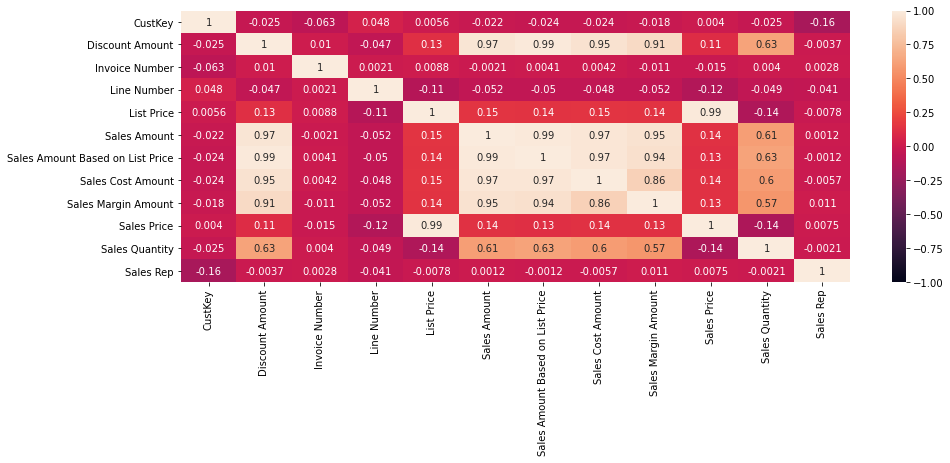

In [29]:
sns.heatmap(sales_data.corr(),annot=True,vmin=-1,vmax=1)

# Univariate Analysis

In [29]:
sales_data.dtypes

CustKey                                      int64
DateKey                             datetime64[ns]
Discount Amount                            float64
Invoice Date                        datetime64[ns]
Invoice Number                               int64
Item Class                                  object
Item Number                                 object
Item                                        object
Line Number                                  int64
List Price                                 float64
Promised Delivery Date              datetime64[ns]
Sales Amount                               float64
Sales Amount Based on List Price           float64
Sales Cost Amount                          float64
Sales Margin Amount                        float64
Sales Price                                float64
Sales Quantity                               int64
Sales Rep                                    int64
U/M                                         object
dtype: object

# List of numerical variables to analyze: Discount Amount, List Price, Sales Amount, Sales Amount Based on List Price, Sales Cost Amount, Sales Margin Amount, Sales Price, Sales Quantity and Sales Rep.

## 1. Discount Amount

In [30]:
round(np.mean(sales_data['Discount Amount']),2)

1526.4

In [31]:
round(np.max(sales_data['Discount Amount']),2)

191196.55

In [32]:
cnt=0
for amount in sales_data['Discount Amount'].values:
    if amount < 0:
        cnt = cnt + 1 
print('No of negative values in discount amount: ' + str(cnt))

No of negative values in discount amount: 158


In [33]:
sales_data.shape

(56993, 19)

In [34]:
sales_data = sales_data[sales_data['Discount Amount']>0]

In [35]:
(sales_data['Discount Amount'] < 0).sum()

0

In [36]:
round(np.min(sales_data['Discount Amount']),2)

0.0

In [37]:
round(np.median(sales_data['Discount Amount']),2)

461.77

In [38]:
round(np.ptp(sales_data['Discount Amount']),2)

191196.55

In [39]:
round(np.percentile(sales_data['Discount Amount'],95),2)

5324.91

In [40]:
round(np.std(sales_data['Discount Amount']),2)

5353.11

In [41]:
round(np.var(sales_data['Discount Amount']),2)

28655792.87

### Discount amount has a high degree of variability within it's distribution within the dataset.

Text(0.5, 1.0, 'Histogram of Discount Amount')

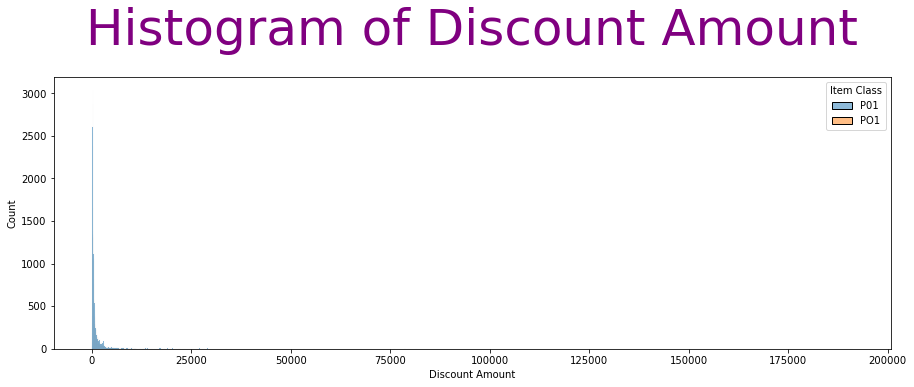

In [42]:
sns.histplot(x='Discount Amount',data=sales_data,hue='Item Class',bins=10,binwidth=20)
plt.title('Histogram of Discount Amount',fontsize=50,color='purple',pad=32)

Text(0.5, 1.0, 'Kernel Density Estimation of Discount Amount')

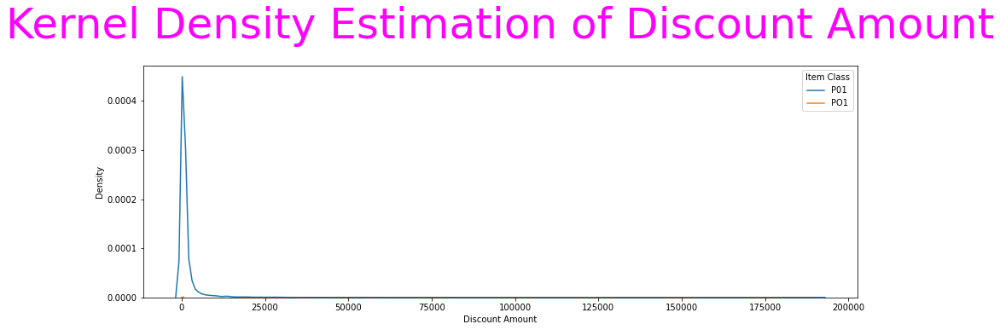

In [43]:
sns.kdeplot(x='Discount Amount',data=sales_data,hue='Item Class')
plt.title('Kernel Density Estimation of Discount Amount',fontsize=50,color='magenta',pad=32)

## 2. List Price

In [53]:
round(np.mean(sales_data['List Price']),2)

539.56

In [56]:
round(np.max(sales_data['List Price']),2)

1975.0

In [57]:
round(np.min(sales_data['List Price']),2)

2.32

In [58]:
round(np.median(sales_data['List Price']),2)

378.29

In [59]:
round(np.std(sales_data['List Price']),2)

446.83

In [60]:
round(np.var(sales_data['List Price']),2)

199660.98

In [61]:
round(np.ptp(sales_data['List Price']),2)

1972.68

In [62]:
round(np.percentile(sales_data['List Price'],90),2)

1254.19

Text(0.5, 1.0, 'Histogram of list price')

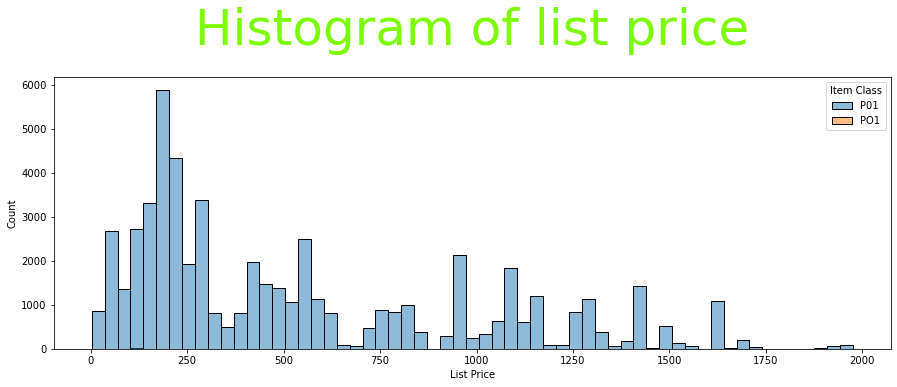

In [63]:
sns.histplot(x='List Price',data=sales_data,hue='Item Class')
plt.title('Histogram of list price',fontsize=50,color='lawngreen',pad=32)

### Maximum values of list price are concentrated in the range of 0-250.

Text(0.5, 1.0, 'KDE plot of list price')

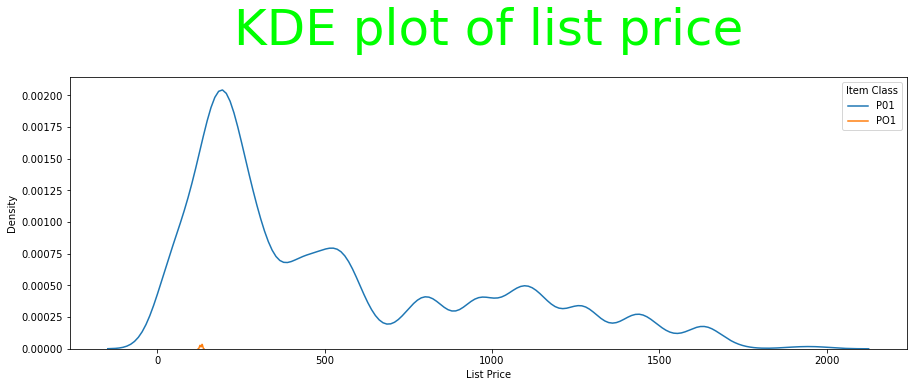

In [64]:
sns.kdeplot(x='List Price',data=sales_data,hue='Item Class')
plt.title('KDE plot of list price',fontsize=50,color='lime',pad=32)

## 3. Sales Price

In [65]:
round(np.mean(sales_data['Sales Price']),2)

290.61

In [66]:
round(np.max(sales_data['Sales Price']),2)

1373.98

In [67]:
round(np.min(sales_data['Sales Price']),2)

1.28

In [68]:
round(np.median(sales_data['Sales Price']),2)

202.98

In [69]:
round(np.std(sales_data['Sales Price']),2)

244.25

In [70]:
round(np.var(sales_data['Sales Price']),2)

59657.43

In [71]:
round(np.ptp(sales_data['Sales Price']),2)

1372.7

In [73]:
round(np.percentile(sales_data['Sales Price'],90),2)

669.82

Text(0.5, 1.0, 'Histogram of sales price')

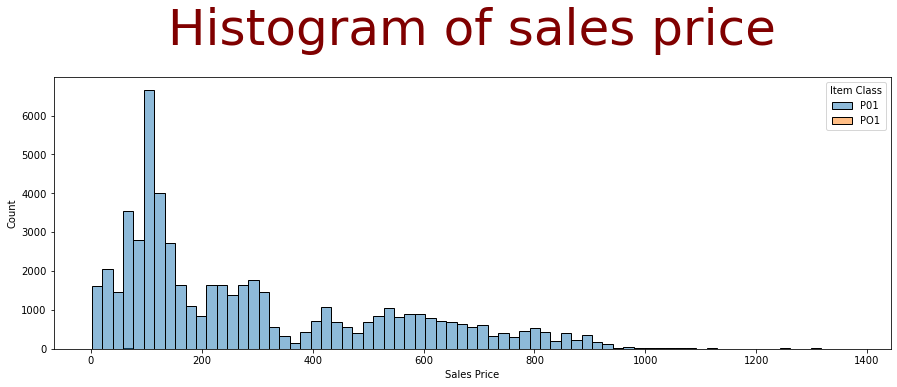

In [74]:
sns.histplot(x='Sales Price',data=sales_data,hue='Item Class')
plt.title('Histogram of sales price',fontsize=50,color='maroon',pad=32)

Text(0.5, 1.0, 'KDE plot of sales price')

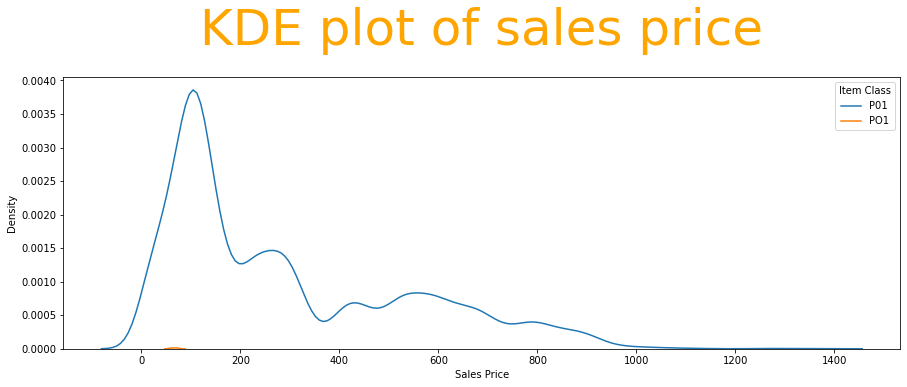

In [75]:
sns.kdeplot(x='Sales Price',data=sales_data,hue='Item Class')
plt.title('KDE plot of sales price',fontsize=50,color='orange',pad=32)

## 4. Sales Amount

In [76]:
round(np.mean(sales_data['Sales Amount']),2)

1648.66

In [77]:
round(np.max(sales_data['Sales Amount']),2)

215364.6

In [78]:
round(np.min(sales_data['Sales Amount']),2)

200.01

In [79]:
round(np.median(sales_data['Sales Amount']),2)

533.45

In [80]:
round(np.std(sales_data['Sales Amount']),2)

5271.52

In [81]:
round(np.var(sales_data['Sales Amount']),2)

27788899.92

In [82]:
round(np.ptp(sales_data['Sales Amount']),2)

215164.59

In [83]:
round(np.percentile(sales_data['Sales Amount'],90),2)

3014.58

Text(0.5, 1.0, 'Histogram of Sales Amount')

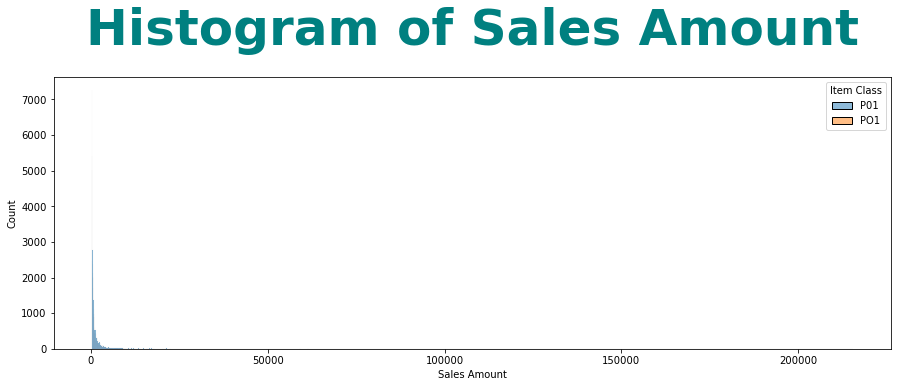

In [84]:
sns.histplot(x='Sales Amount',data=sales_data,hue='Item Class')
plt.title('Histogram of Sales Amount',fontsize=50,color='teal',pad=32,fontweight='bold')

Text(0.5, 1.0, 'KDE plot of Sales amount')

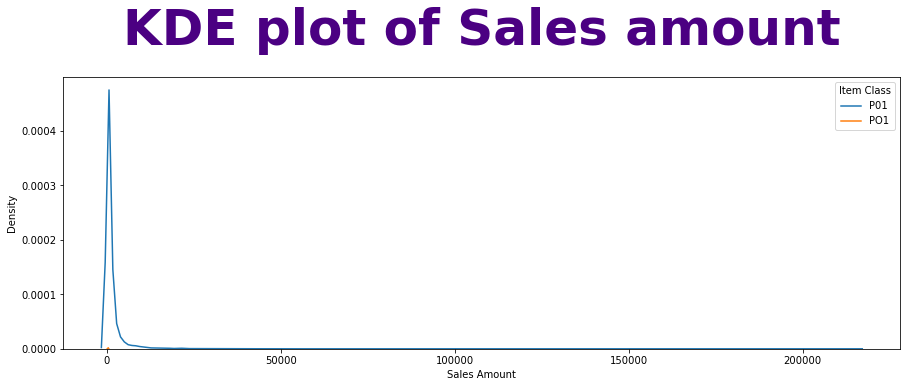

In [86]:
sns.kdeplot(x='Sales Amount',data=sales_data,hue='Item Class')
plt.title('KDE plot of Sales amount',fontsize=50,color='indigo',pad=32,fontweight='bold')

## 5. Sales Amount based on List Price

In [87]:
round(np.mean(sales_data['Sales Amount Based on List Price']),2)

3195.41

In [88]:
round(np.max(sales_data['Sales Amount Based on List Price']),2)

391924.72

In [89]:
round(np.min(sales_data['Sales Amount Based on List Price']),2)

202.14

In [90]:
round(np.median(sales_data['Sales Amount Based on List Price']),2)

988.08

In [91]:
round(np.std(sales_data['Sales Amount Based on List Price']),2)

10574.9

In [92]:
round(np.var(sales_data['Sales Amount Based on List Price']),2)

111828576.35

In [93]:
round(np.ptp(sales_data['Sales Amount Based on List Price']),2)

391722.58

In [94]:
round(np.percentile(sales_data['Sales Amount Based on List Price'],90),2)

5724.92

Text(0.5, 1.0, 'Histogram of Sales Amount based on List Price')

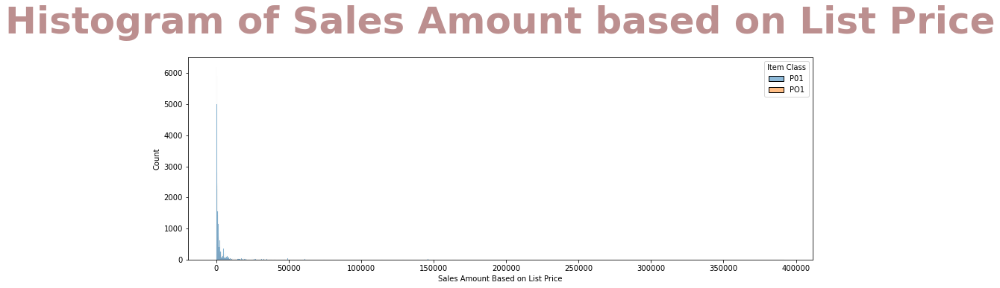

In [95]:
sns.histplot(x='Sales Amount Based on List Price',data=sales_data,hue='Item Class')
plt.title('Histogram of Sales Amount based on List Price',fontsize=50,color='rosybrown',pad=32,fontweight='bold')

Text(0.5, 1.0, 'Histogram of Sales Amount based on List Price')

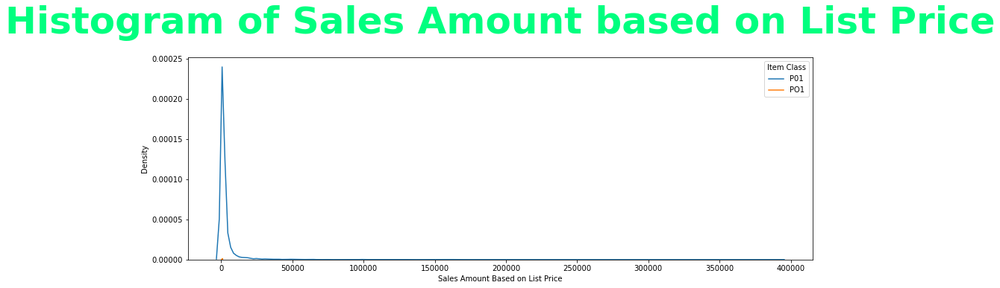

In [97]:
sns.kdeplot(x='Sales Amount Based on List Price',data=sales_data,hue='Item Class')
plt.title('Histogram of Sales Amount based on List Price',fontsize=50,color='springgreen',pad=32,fontweight='bold')

### 6. Sales Cost Amount

In [98]:
round(np.mean(sales_data['Sales Cost Amount']),2)

921.99

In [99]:
round(np.max(sales_data['Sales Cost Amount']),2)

118903.53

In [100]:
round(np.min(sales_data['Sales Cost Amount']),2)

0.0

In [101]:
round(np.median(sales_data['Sales Cost Amount']),2)

295.24

In [102]:
round(np.std(sales_data['Sales Cost Amount']),2)

3150.55

In [103]:
round(np.var(sales_data['Sales Cost Amount']),2)

9925973.25

In [104]:
round(np.ptp(sales_data['Sales Cost Amount']),2)

118903.53

In [105]:
round(np.percentile(sales_data['Sales Cost Amount'],80),2)

842.25

Text(0.5, 1.0, 'Histogram of Sales Cost Amount')

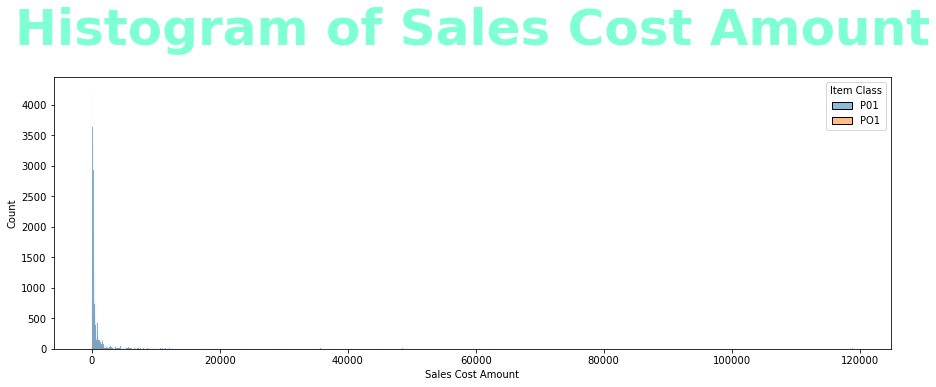

In [106]:
sns.histplot(x='Sales Cost Amount',data=sales_data,hue='Item Class')
plt.title('Histogram of Sales Cost Amount',fontsize=50,color='aquamarine',pad=32,fontweight='bold')

Text(0.5, 1.0, 'KDE plot of sales cost amount')

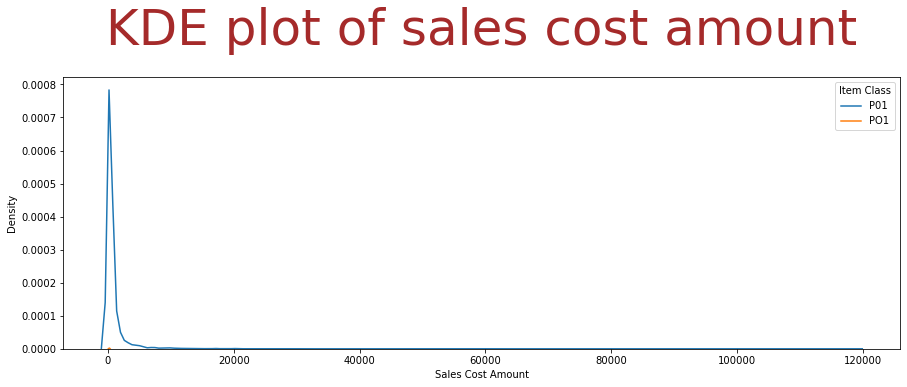

In [107]:
sns.kdeplot(x='Sales Cost Amount',data=sales_data,hue='Item Class')
plt.title('KDE plot of sales cost amount',fontsize=50,color='brown',pad=32)

## 7. Sales Margin Amount

In [108]:
round(np.mean(sales_data['Sales Margin Amount']),2)

726.67

In [109]:
round(np.max(sales_data['Sales Margin Amount']),2)

96461.07

In [110]:
round(np.min(sales_data['Sales Margin Amount']),2)

-717.59

In [111]:
sales_data = sales_data[sales_data['Sales Margin Amount']>0]

In [112]:
sales_data.shape

(56026, 19)

In [113]:
round(np.min(sales_data['Sales Margin Amount']),2)

0.1

In [114]:
round(np.median(sales_data['Sales Margin Amount']),2)

240.04

In [115]:
round(np.std(sales_data['Sales Margin Amount']),2)

2315.67

In [116]:
round(np.var(sales_data['Sales Margin Amount']),2)

5362340.38

In [117]:
round(np.ptp(sales_data['Sales Margin Amount']),2)

96460.97

In [118]:
round(np.percentile(sales_data['Sales Margin Amount'],90),2)

1341.08

Text(0.5, 1.0, 'Histogram of Sales Margin Amount')

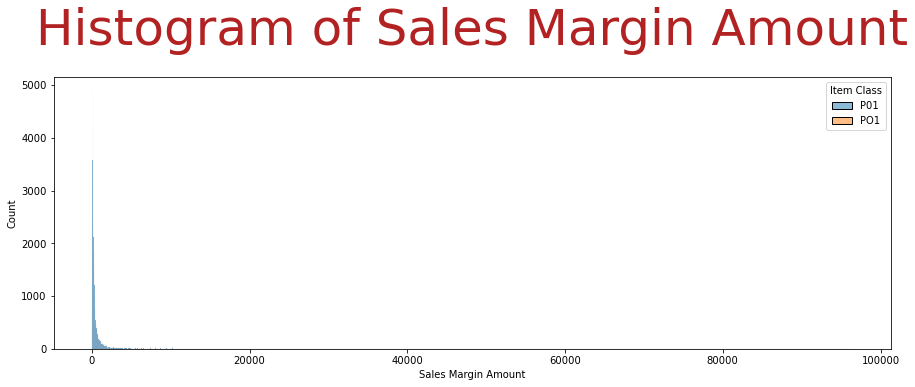

In [119]:
sns.histplot(x='Sales Margin Amount',data=sales_data,hue='Item Class')
plt.title('Histogram of Sales Margin Amount',fontsize=50,color='firebrick',pad=32)

Text(0.5, 1.0, 'KDE plot of sales margin amount')

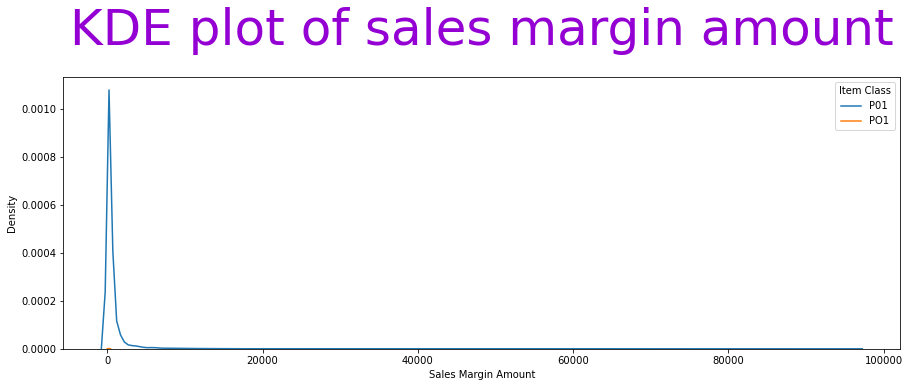

In [120]:
sns.kdeplot(x='Sales Margin Amount',data=sales_data,hue='Item Class')
plt.title('KDE plot of sales margin amount',fontsize=50,color='darkviolet',pad=32)

Text(0.5, 1.0, 'Histogram of sales quantity')

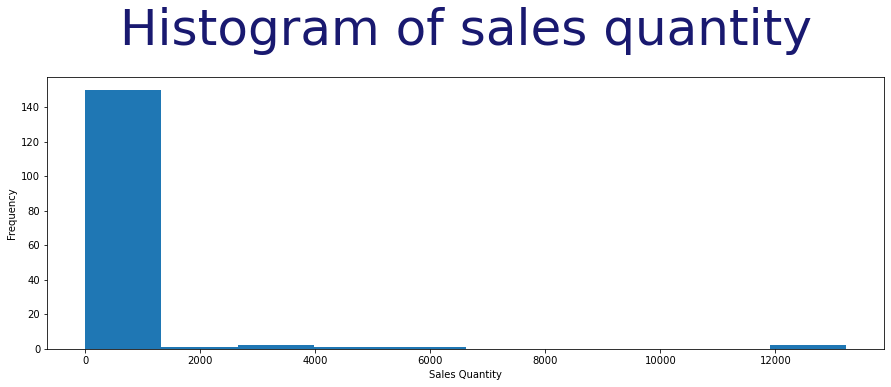

In [128]:
sales_data['Sales Quantity'].value_counts().plot.hist()
plt.xlabel('Sales Quantity')
plt.title('Histogram of sales quantity',fontsize=50,color='midnightblue',pad=32)

Text(0, 0.5, 'Count')

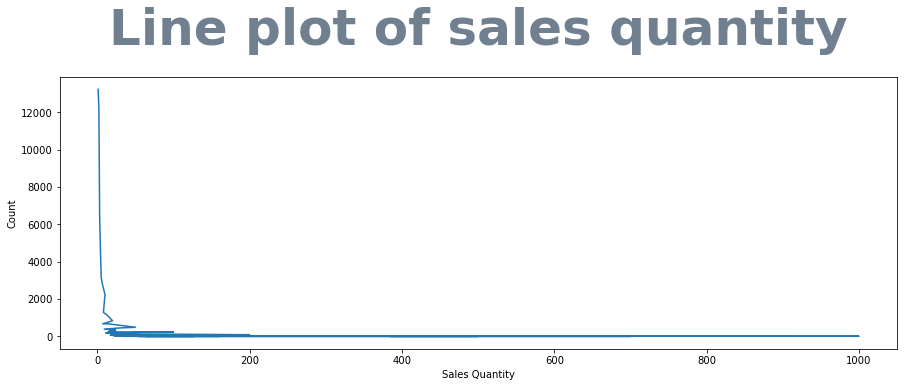

In [127]:
sales_data['Sales Quantity'].value_counts().plot.line()
plt.title('Line plot of sales quantity',fontsize=50,color='slategrey',pad=32,fontweight='bold')
plt.xlabel('Sales Quantity')
plt.ylabel('Count')

Text(0.5, 0, 'Sales Rep')

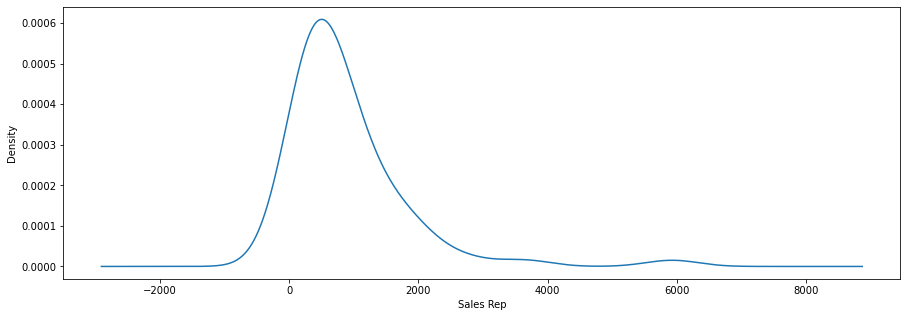

In [154]:
sales_data['Sales Rep'].value_counts().plot.kde()
plt.xlabel('Sales Rep')

Text(0, 0.5, 'Count')

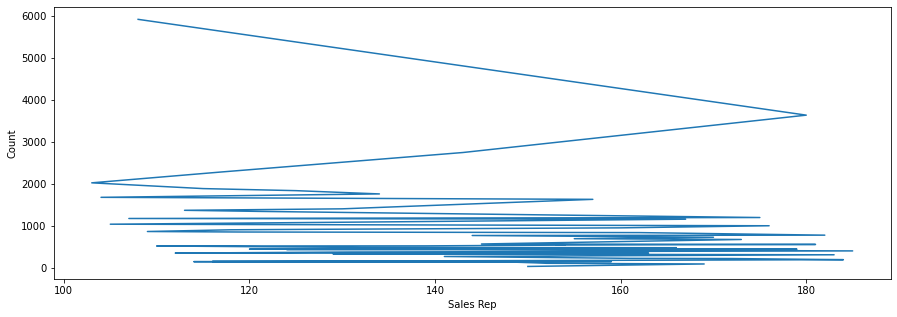

In [152]:
sales_data['Sales Rep'].value_counts().plot.line()
plt.xlabel('Sales Rep')
plt.ylabel('Count')

Text(0, 0.5, 'Count')

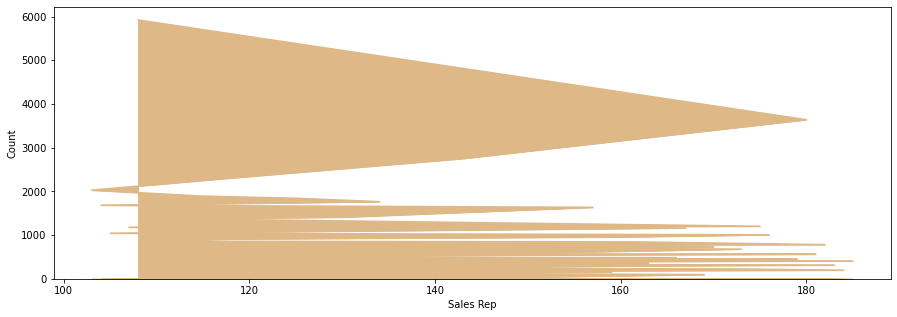

In [151]:
sales_data['Sales Rep'].value_counts().plot.area(color='burlywood')
plt.xlabel('Sales Rep')
plt.ylabel('Count')

Text(0.5, 0, 'Sales Rep')

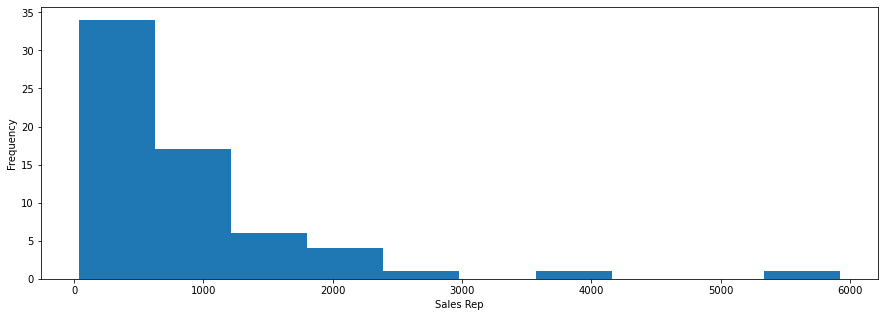

In [149]:
sales_data['Sales Rep'].value_counts().plot.hist()
plt.xlabel('Sales Rep')

Text(0, 0.5, 'Count')

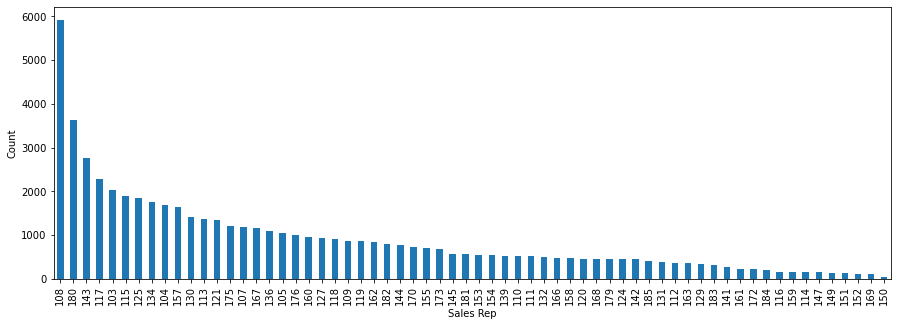

In [148]:
sales_data['Sales Rep'].value_counts().plot.bar()
plt.xlabel('Sales Rep')
plt.ylabel('Count')

### "108" Sales Rep has been used the most while "150" sales rep has been utilized the least.


# Bivariate Analysis


Text(0, 0.5, 'Sales Quantity')

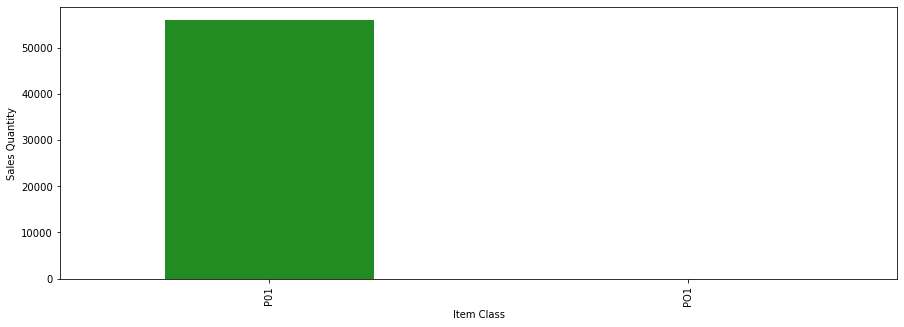

In [161]:
sales_data.groupby('Item Class')['Sales Quantity'].count().plot(kind='bar',color='forestgreen')
plt.ylabel('Sales Quantity')

### All sale quantities have been generated by the item class 'P01'.

Text(0, 0.5, 'Sales Quantity')

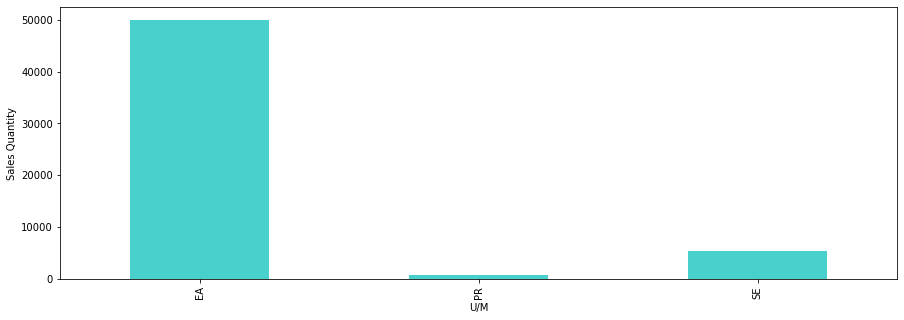

In [160]:
sales_data.groupby('U/M')['Sales Quantity'].count().plot(kind='bar',color='mediumturquoise')
plt.ylabel('Sales Quantity')

### Maximum sales quantities have been generated in the unit of measure "EA".

Text(0, 0.5, 'Sales Quantity')

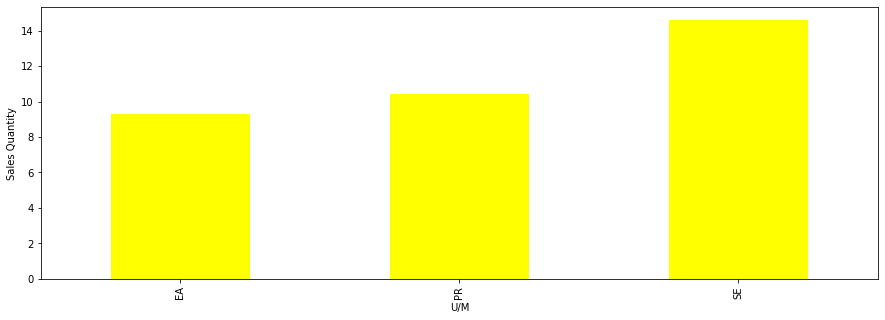

In [159]:
sales_data.groupby('U/M')['Sales Quantity'].mean().plot(kind='bar',color='yellow')
plt.ylabel('Sales Quantity')

### Maximum average level sales quantities have been generated in the "SE" unit of measure.

Text(0, 0.5, 'Sales Quantity')

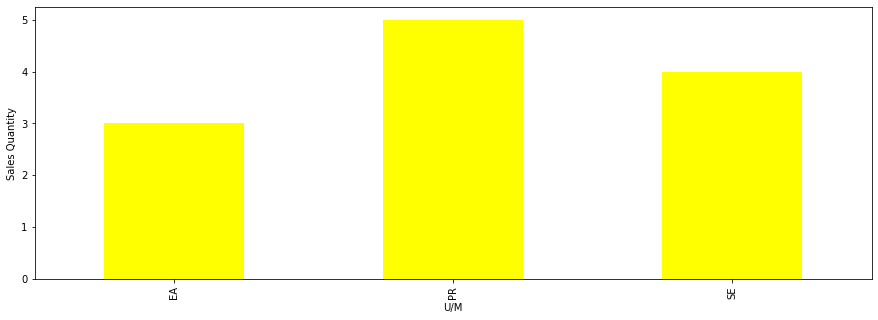

In [158]:
sales_data.groupby('U/M')['Sales Quantity'].median().plot(kind='bar',color='yellow')
plt.ylabel('Sales Quantity')

### Maximum median level sales quantities have been generated in the "PR" unit of measure.

Text(0, 0.5, 'Sales Price')

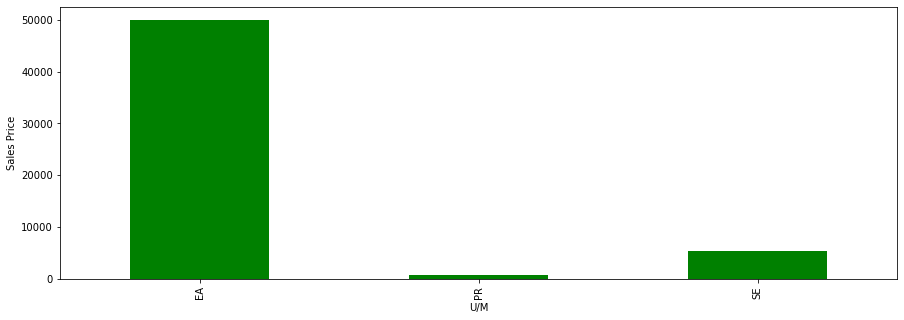

In [157]:
sales_data.groupby('U/M')['Sales Price'].count().plot(kind='bar',color='green')
plt.ylabel('Sales Price')

### Maximum number of sales price have been generated in the "EA" unit of measure.

Text(0, 0.5, 'Sales Price')

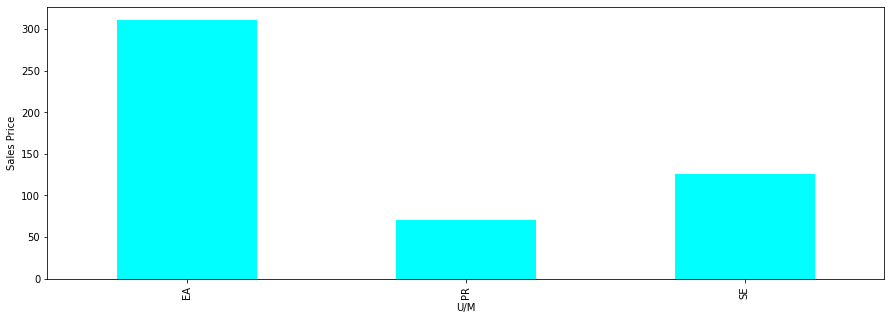

In [156]:
sales_data.groupby('U/M')['Sales Price'].mean().plot(kind='bar',color='cyan')
plt.ylabel('Sales Price')

### "EA" U/M has the maximum number of average sales prices.

Text(0, 0.5, 'Sales Price')

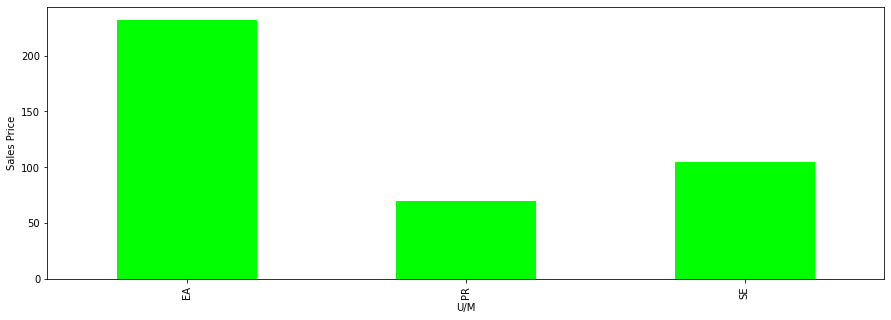

In [155]:
sales_data.groupby('U/M')['Sales Price'].median().plot(kind='bar',color='lime')
plt.ylabel('Sales Price')

### "EA" U/M has the maximum number of median sales prices.

Text(0, 0.5, 'Sales Amount')

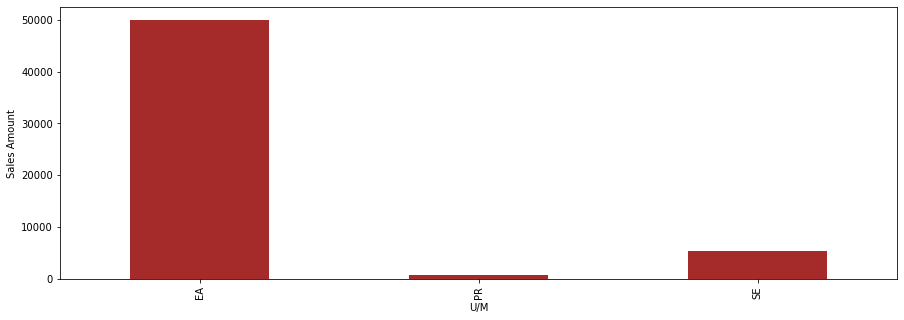

In [153]:
sales_data.groupby('U/M')['Sales Amount'].count().plot(kind='bar',color='brown')
plt.ylabel('Sales Amount')

### Maximum number of sales amounts have been generated in "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'Sales Amount')

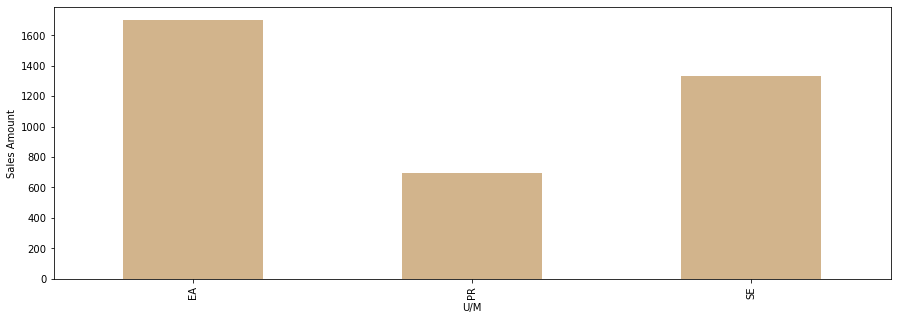

In [173]:
sales_data.groupby('U/M')['Sales Amount'].mean().plot(kind='bar',color='tan')
plt.ylabel('Sales Amount')

### "EA" U/M has highest mean sales amounts while "PR" has lowest of them.

Text(0, 0.5, 'Sales Amount')

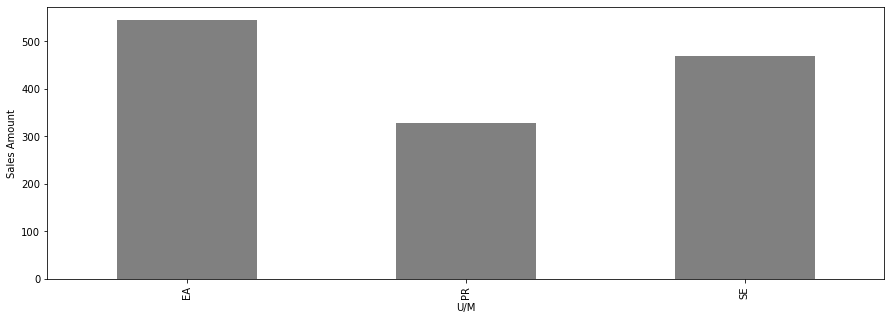

In [175]:
sales_data.groupby('U/M')['Sales Amount'].median().plot(kind='bar',color='grey')
plt.ylabel('Sales Amount')

### "EA" U/M has highest median level sales amounts while "PR" has lowest of them.

Text(0, 0.5, 'Sales Cost Amount')

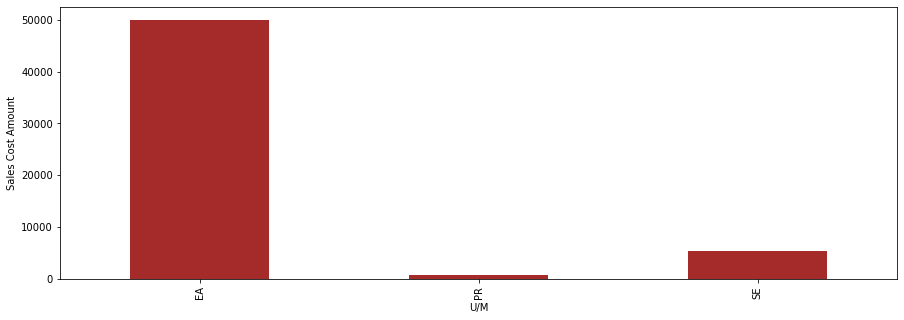

In [163]:
sales_data.groupby('U/M')['Sales Cost Amount'].count().plot(kind='bar',color='brown')
plt.ylabel('Sales Cost Amount')

### Maximum number of sales cost amounts have been generated in "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'Sales Cost Amount')

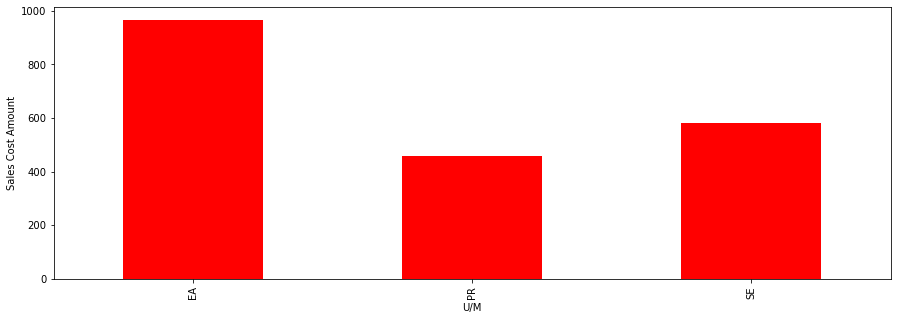

In [167]:
sales_data.groupby('U/M')['Sales Cost Amount'].mean().plot(kind='bar',color='red')
plt.ylabel('Sales Cost Amount')

### Maximum mean level sales cost amounts have been produced by "EA" U/M while minimum mean level by "PR" U/M.

Text(0, 0.5, 'Sales Cost Amount')

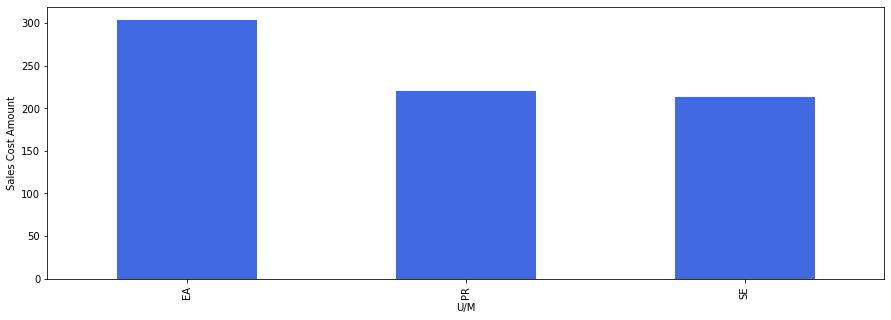

In [166]:
sales_data.groupby('U/M')['Sales Cost Amount'].median().plot(kind='bar',color='royalblue')
plt.ylabel('Sales Cost Amount')

### Maximum median level sales cost amounts have been produced by "EA" U/M while minimum median level by "SE" U/M.

Text(0, 0.5, 'Sales Margin Amount')

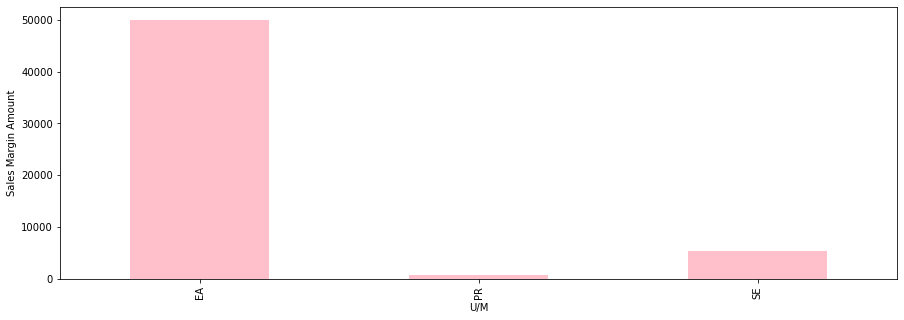

In [170]:
sales_data.groupby('U/M')['Sales Margin Amount'].count().plot(kind='bar',color='pink')
plt.ylabel('Sales Margin Amount')

### Maximum number of sales margin amounts have been generated in the "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'Sales Margin Amount')

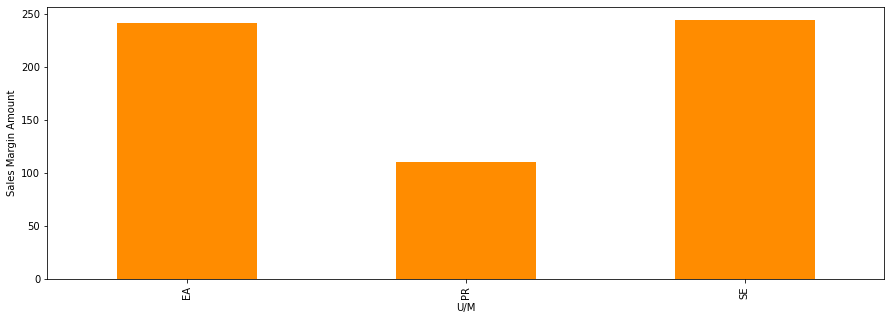

In [172]:
sales_data.groupby('U/M')['Sales Margin Amount'].median().plot(kind='bar',color='darkorange')
plt.ylabel('Sales Margin Amount')

### Maximum median level of sales margin amount has been produced by "SE" while minimum median level of the same has been produced by "PR".

Text(0, 0.5, 'Sales Margin Amount')

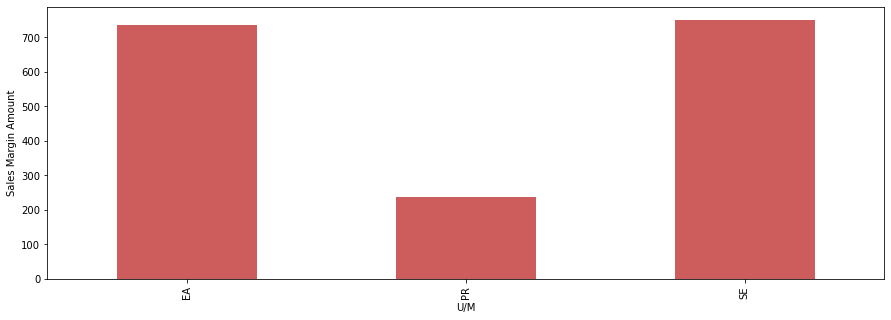

In [176]:
sales_data.groupby('U/M')['Sales Margin Amount'].mean().plot(kind='bar',color='indianred')
plt.ylabel('Sales Margin Amount')

### Maximum mean level sales margin amounts have been generated in "SE" U/M while minimum mean level of them in "PR" U/M.

Text(0, 0.5, 'Sales Amount Based on List Price')

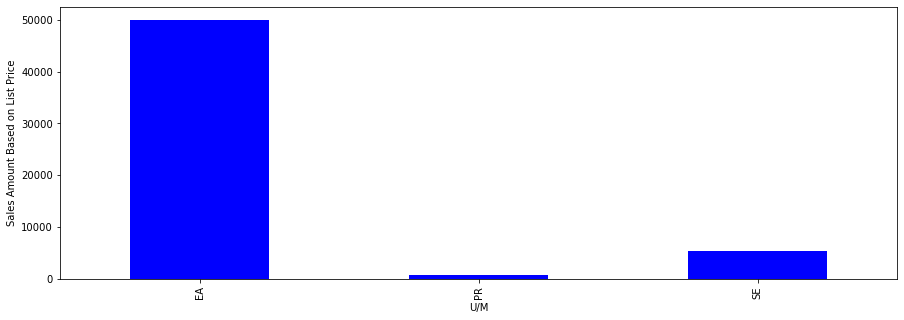

In [178]:
sales_data.groupby('U/M')['Sales Amount Based on List Price'].count().plot(kind='bar',color='blue')
plt.ylabel('Sales Amount Based on List Price')

### Maximum number of sales amounts based on list price have been generated in "EA" U/M while minimum in "PR".

Text(0, 0.5, 'Sales Amount Based on List Price')

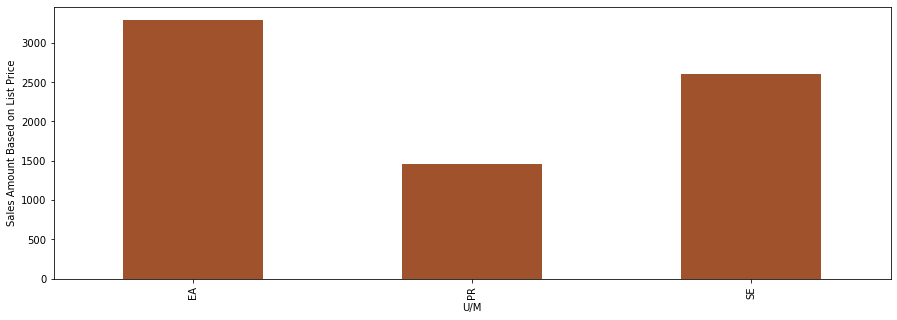

In [182]:
sales_data.groupby('U/M')['Sales Amount Based on List Price'].mean().plot(kind='bar',color='sienna')
plt.ylabel('Sales Amount Based on List Price')

### Maximum mean level sales amounts based on list price have been generated in "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'Sales Amount Based on List Price')

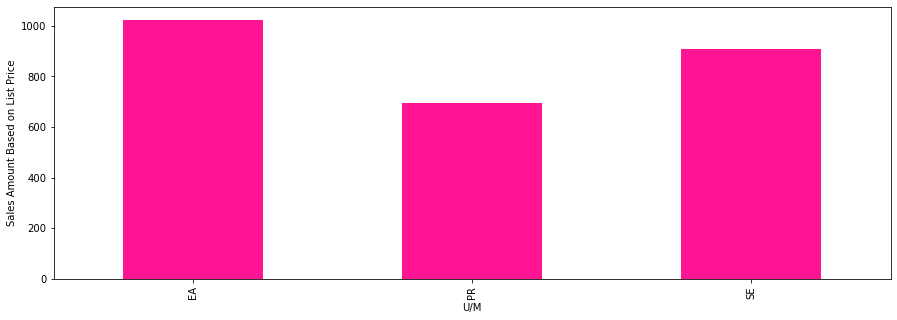

In [184]:
sales_data.groupby('U/M')['Sales Amount Based on List Price'].median().plot(kind='bar',color='deeppink')
plt.ylabel('Sales Amount Based on List Price')

### Maximum median level sales amounts based on list price have been generated in "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'Discount Amount')

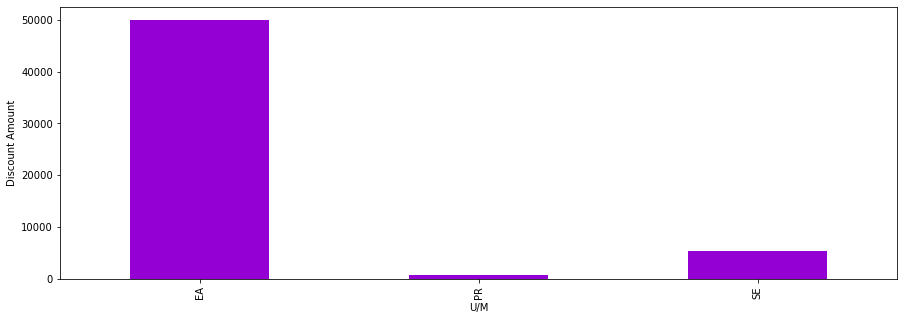

In [186]:
sales_data.groupby('U/M')['Discount Amount'].count().plot(kind='bar',color='darkviolet')
plt.ylabel('Discount Amount')

### Maximum number of discount amounts have been generated in "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'Discount Amount')

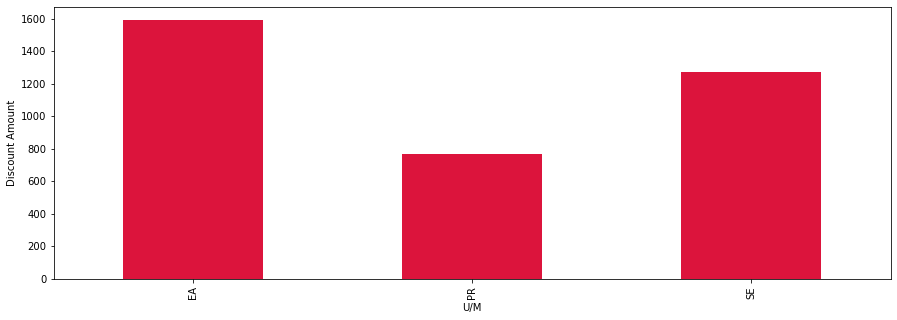

In [187]:
sales_data.groupby('U/M')['Discount Amount'].mean().plot(kind='bar',color='crimson')
plt.ylabel('Discount Amount')

### Maximum average level discount amounts have been generated in "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'Discount Amount')

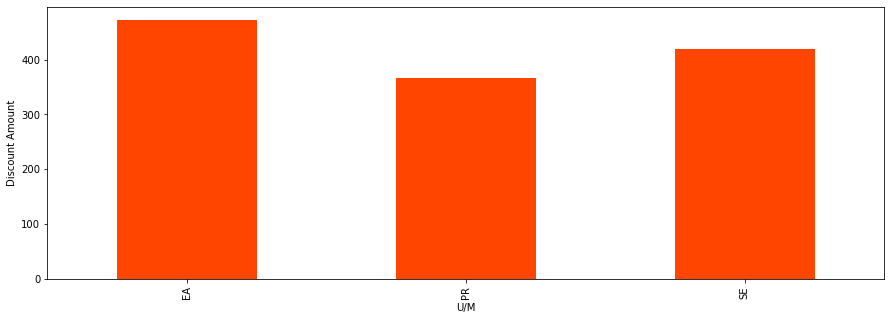

In [188]:
sales_data.groupby('U/M')['Discount Amount'].median().plot(kind='bar',color='orangered')
plt.ylabel('Discount Amount')

### Maximum median level discount amounts have been generated in "EA" U/M while minimum in "PR" U/M.¶

Text(0, 0.5, 'List Price')

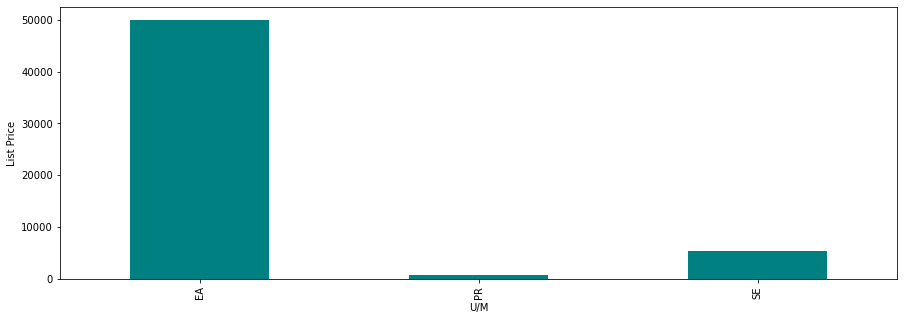

In [189]:
sales_data.groupby('U/M')['List Price'].count().plot(kind='bar',color='teal')
plt.ylabel('List Price')

### Maximum number of list prices have been generated in "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'List Price')

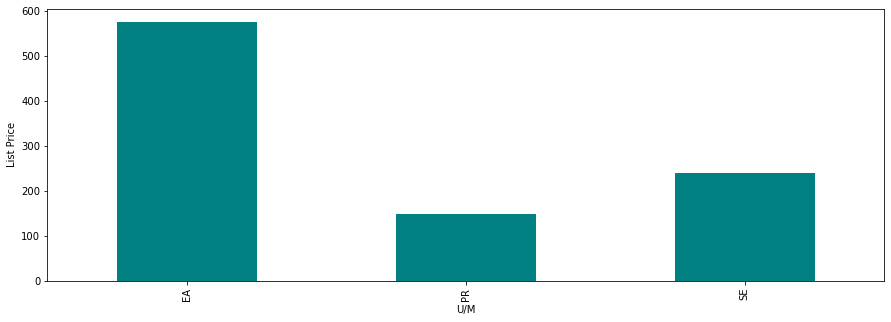

In [190]:
sales_data.groupby('U/M')['List Price'].mean().plot(kind='bar',color='teal')
plt.ylabel('List Price')

### Maximum average level list prices have been generated in "EA" U/M while minimum in "PR" U/M.

Text(0, 0.5, 'List Price')

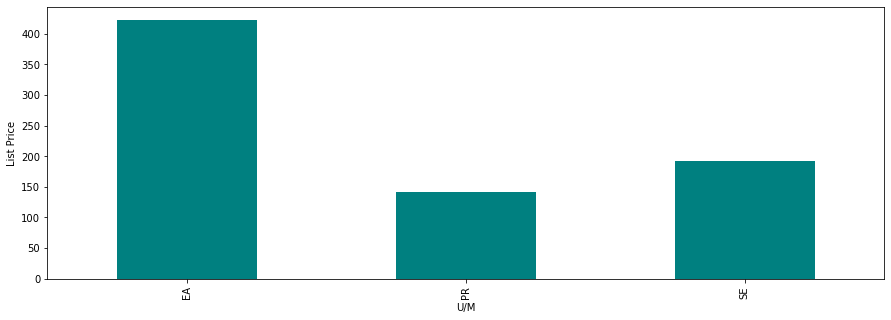

In [191]:
sales_data.groupby('U/M')['List Price'].median().plot(kind='bar',color='teal')
plt.ylabel('List Price')

### Maximum median level list prices have been generated in "EA" U/M while minimum in "PR" U/M.¶

# Exploring relationships 

Text(0.5, 1.0, 'Sales Price vs. Sales Amount')

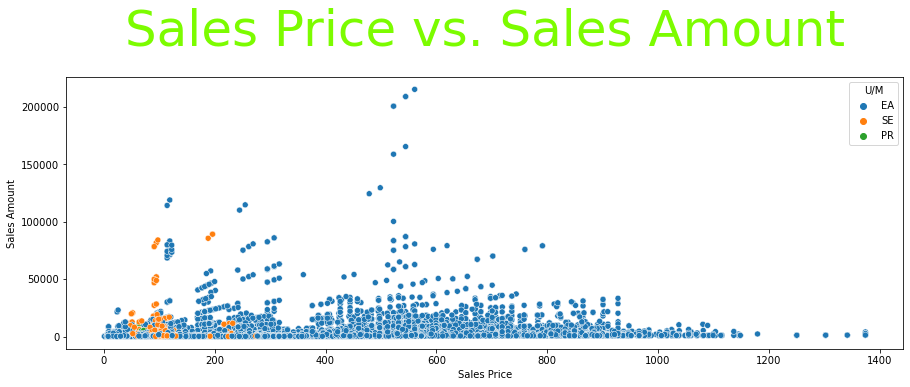

In [192]:
sns.scatterplot(x='Sales Price',y='Sales Amount',data=sales_data,hue='U/M')
plt.title('Sales Price vs. Sales Amount',fontsize=50,color='lawngreen',pad=32)

In [193]:
np.corrcoef(sales_data['Sales Price'],sales_data['Sales Amount'])

array([[1.        , 0.14161616],
       [0.14161616, 1.        ]])

### Sales Price and Sales Amount are almost independent of each other.

Text(0.5, 1.0, 'Sales Price vs. List Price')

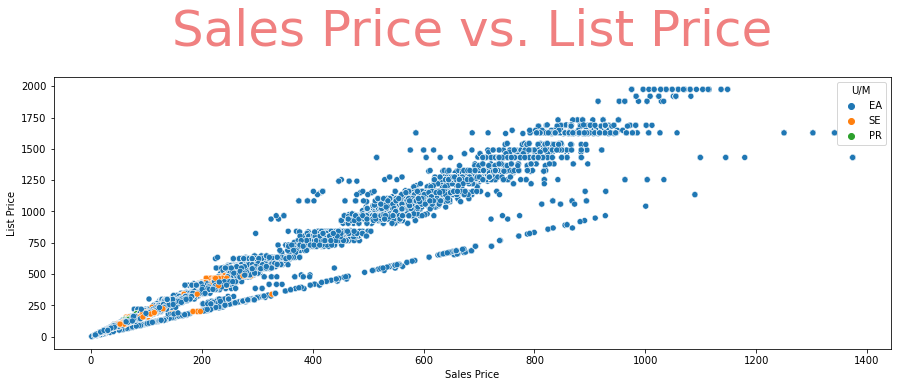

In [194]:
sns.scatterplot(x='Sales Price',y='List Price',data=sales_data,hue='U/M')
plt.title('Sales Price vs. List Price',fontsize=50,color='lightcoral',pad=32)

### The above scatter plot suggests that there is a high degree of correlation between sales price and list price.

Text(0.5, 1.0, 'Sales Price vs. Sales Cost Amount')

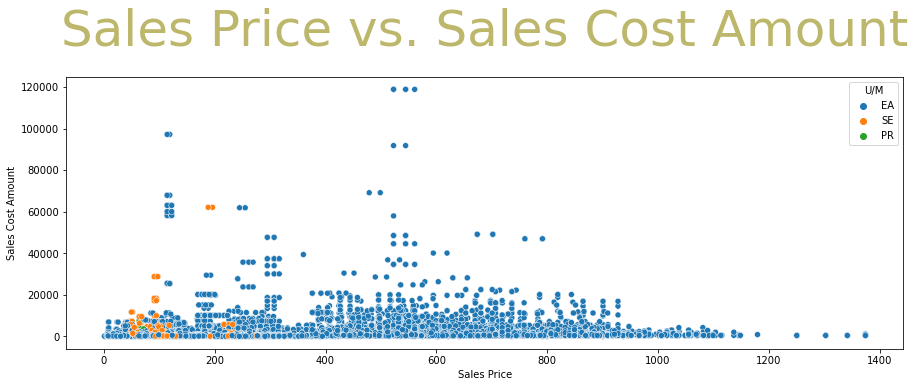

In [195]:
sns.scatterplot(x='Sales Price',y='Sales Cost Amount',data=sales_data,hue='U/M')
plt.title('Sales Price vs. Sales Cost Amount',fontsize=50,color='darkkhaki',pad=32)

In [196]:
np.corrcoef(sales_data['Sales Price'],sales_data['Sales Cost Amount'])

array([[1.        , 0.13733893],
       [0.13733893, 1.        ]])

### Sales price and sales cost amount are almost independent of each other.

Text(0.5, 1.0, 'Sales Price vs. Sales Margin Amount')

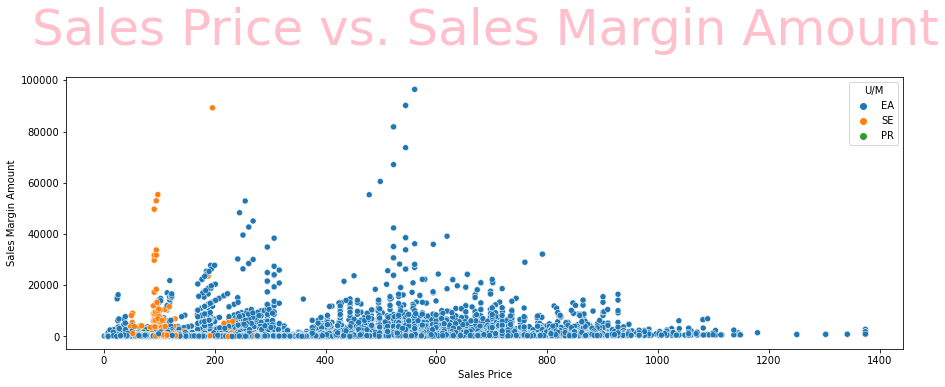

In [197]:
sns.scatterplot(x='Sales Price',y='Sales Margin Amount',data=sales_data,hue='U/M')
plt.title('Sales Price vs. Sales Margin Amount',fontsize=50,color='pink',pad=32)

### Sales price and sales margin amount are almost independent of each other.

Text(0.5, 1.0, 'Sales Price vs. Sales Amount based on list price')

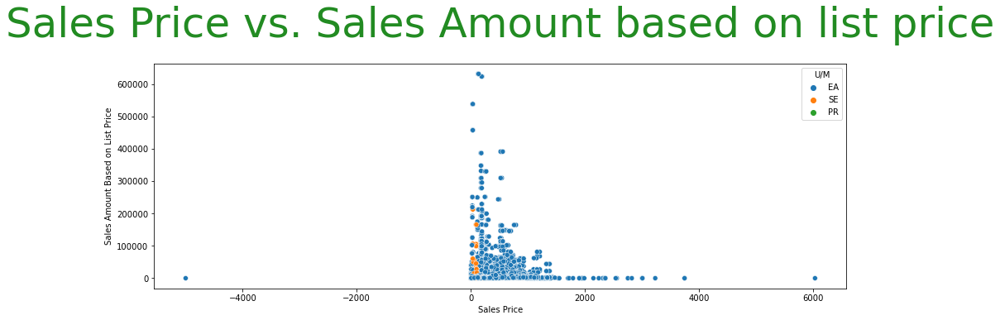

In [5]:
sns.scatterplot(x='Sales Price',y='Sales Amount Based on List Price',data=sales_data,hue='U/M',x_jitter=True,y_jitter=True)
plt.title('Sales Price vs. Sales Amount based on list price',fontsize=50,color='forestgreen',pad=32)

### Sales price and sales amount based on list price are weakly positively correlated with considerable dispersion and scattering of values.¶

Text(0.5, 1.0, 'Sales Price vs. Discount Amount')

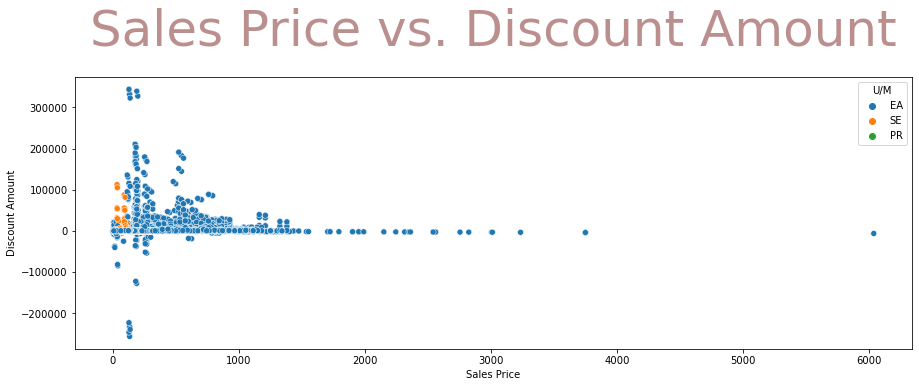

In [6]:
sns.scatterplot(x='Sales Price',y='Discount Amount',data=sales_data,hue='U/M')
plt.title('Sales Price vs. Discount Amount',fontsize=50,color='rosybrown',pad=32)

### Sales price and discount amount are very weakly positively correlated with high dispersion and scattering of values.¶

Text(0.5, 1.0, 'List Price vs. Sales Amount')

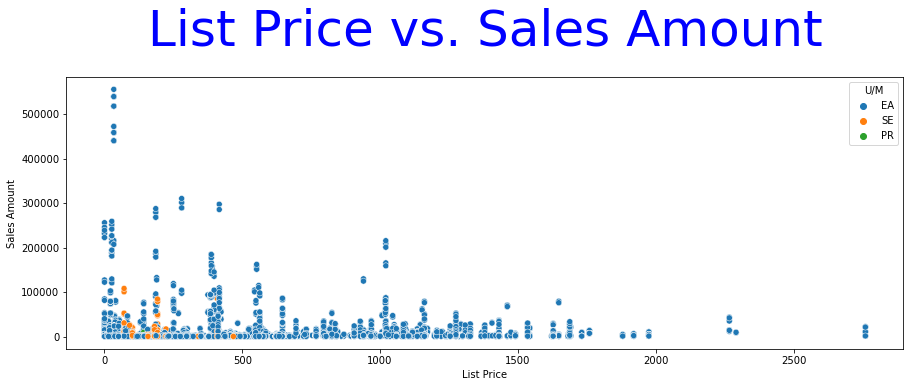

In [7]:
sns.scatterplot(x='List Price',y='Sales Amount',data=sales_data,hue='U/M')
plt.title('List Price vs. Sales Amount',fontsize=50,color='blue',pad=32)

### List price and sales amount are weakly positively correlated with considerable extent of dispersion and scattering of values.¶

Text(0.5, 1.0, 'List Price vs. Sales Cost Amount')

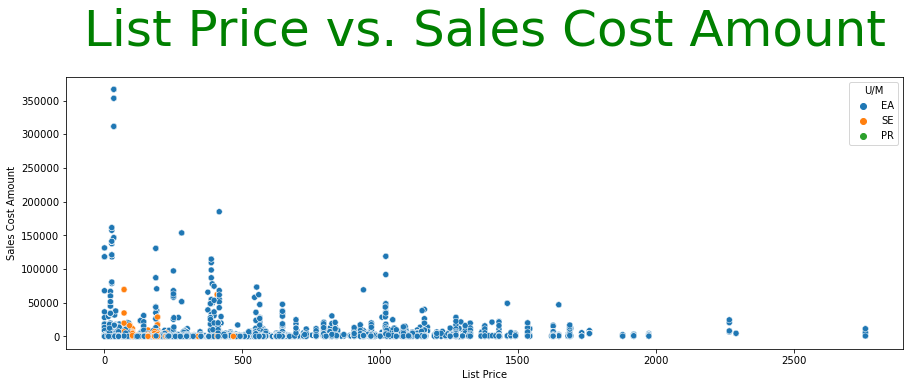

In [8]:
sns.scatterplot(x='List Price',y='Sales Cost Amount',data=sales_data,hue='U/M')
plt.title('List Price vs. Sales Cost Amount',fontsize=50,color='green',pad=32)

### List price and sales cost amount are weakly positively correlated with high dispersion and scattering of values.¶

Text(0.5, 1.0, 'List Price vs. Sales Margin Amount')

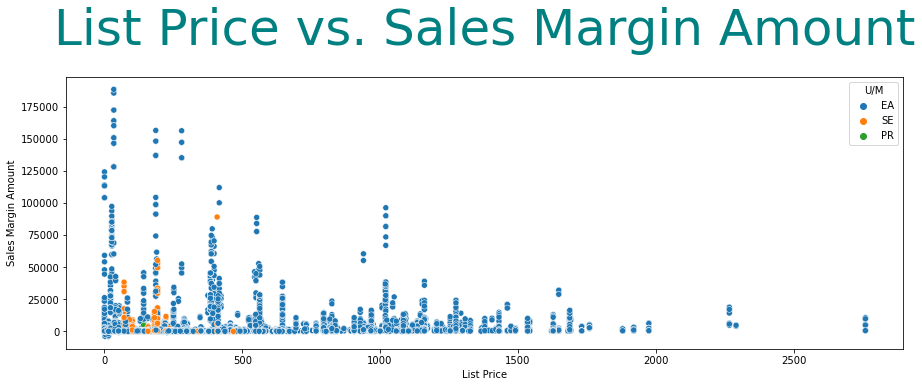

In [9]:
sns.scatterplot(x='List Price',y='Sales Margin Amount',data=sales_data,hue='U/M')
plt.title('List Price vs. Sales Margin Amount',fontsize=50,color='teal',pad=32)

### List price and sales margin amount are weakly negatively correlated with very high dispersion and scattering of values.¶

Text(0.5, 1.0, 'List Price vs. Sales Amount based on list price')

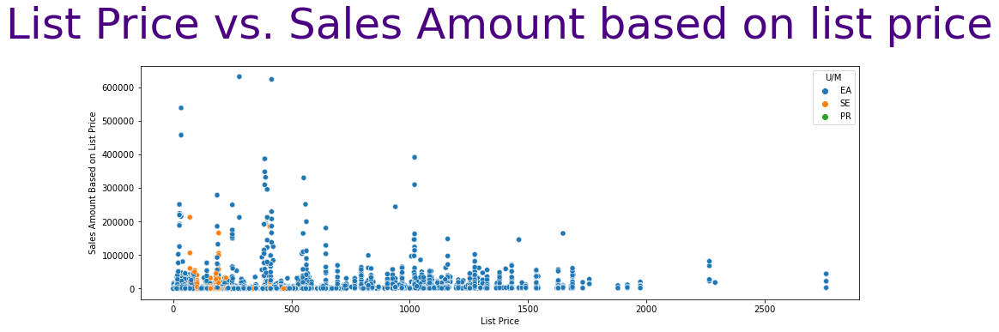

In [11]:
sns.scatterplot(x='List Price',y='Sales Amount Based on List Price',data=sales_data,hue='U/M')
plt.title('List Price vs. Sales Amount based on list price',fontsize=50,color='indigo',pad=32)

### List price and sales amount based on list price are weakly positively correlated with high dispersion and scattering of values.¶

Text(0.5, 1.0, 'List Price vs. Discount Amount')

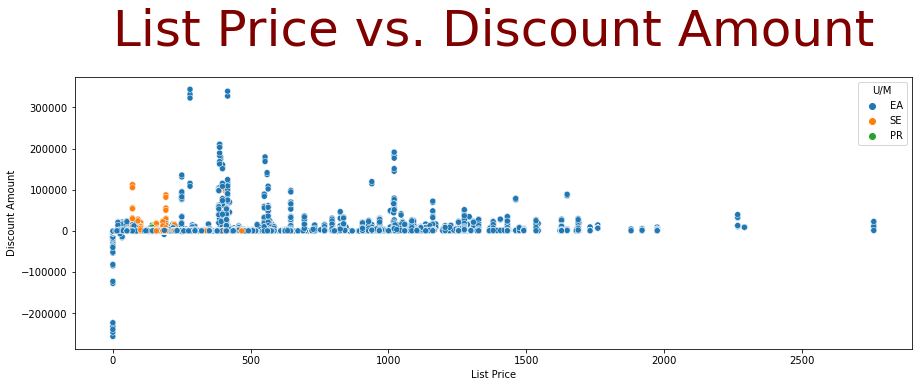

In [12]:
sns.scatterplot(x='List Price',y='Discount Amount',data=sales_data,hue='U/M')
plt.title('List Price vs. Discount Amount',fontsize=50,color='maroon',pad=32)

### List price and discount amount are very weakly positively correlated with very high dispersion and scattering of values.¶

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Amount')

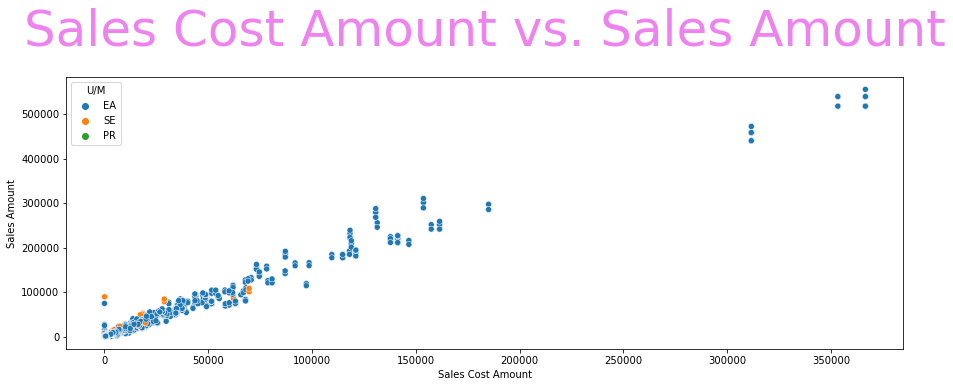

In [15]:
sns.scatterplot(x='Sales Cost Amount',y='Sales Amount',data=sales_data,hue='U/M')
plt.title('Sales Cost Amount vs. Sales Amount',fontsize=50,color='violet',pad=32)

### Sales cost amount and sales amount are strongly positively correlated with very low dispersion and scattering of values.¶

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Margin Amount')

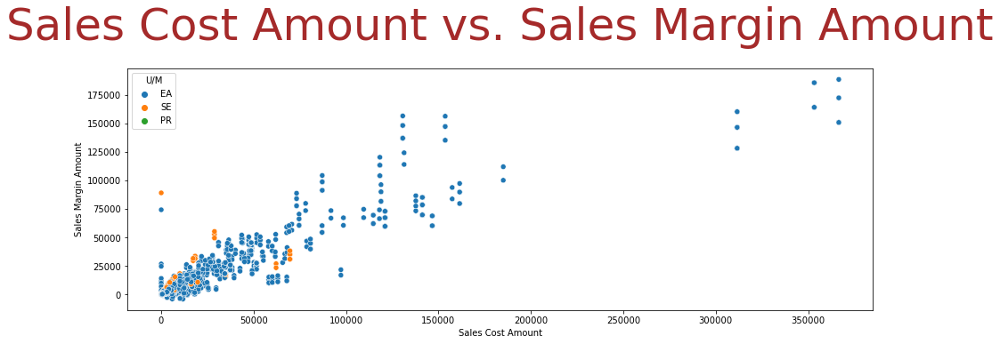

In [16]:
sns.scatterplot(x='Sales Cost Amount',y='Sales Margin Amount',data=sales_data,hue='U/M')
plt.title('Sales Cost Amount vs. Sales Margin Amount',fontsize=50,color='brown',pad=32)

### Sales cost amount and sales margin amount are strongly positively correlated with limited dispersion and scattering of values.¶

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Amount based on list price')

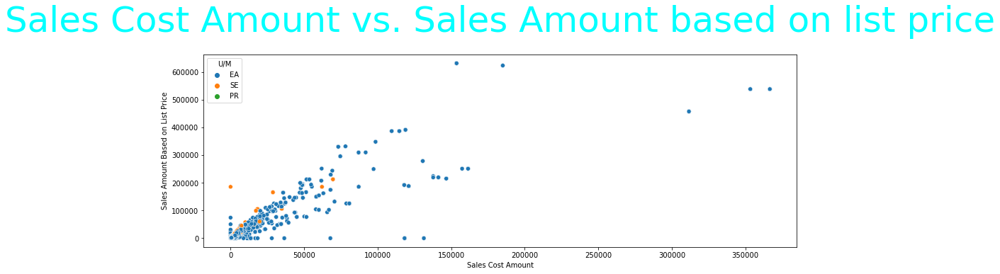

In [18]:
sns.scatterplot(x='Sales Cost Amount',y='Sales Amount Based on List Price',data=sales_data,hue='U/M')
plt.title('Sales Cost Amount vs. Sales Amount based on list price',fontsize=50,color='aqua',pad=32)

### Sales cost amount and sales amount based on list price are strongly positively correlated with limited dispersion and scattering of values.¶

Text(0.5, 1.0, 'Sales Cost Amount vs. Discount Amount')

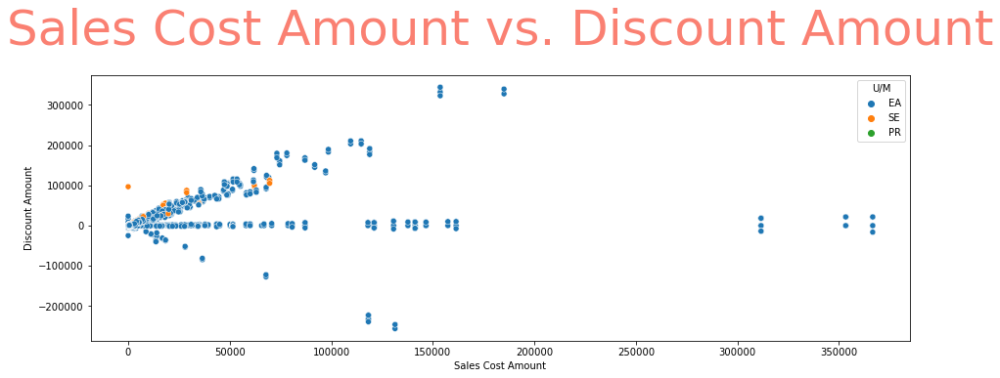

In [20]:
sns.scatterplot(x='Sales Cost Amount',y='Discount Amount',data=sales_data,hue='U/M')
plt.title('Sales Cost Amount vs. Discount Amount',fontsize=50,color='salmon',pad=32)

### Sales cost amount and discount amount are strongly positively correlated with limited dispersion, variation and scattering of values.¶

Text(0.5, 1.0, 'Sales Margin Amount vs. Sales Amount')

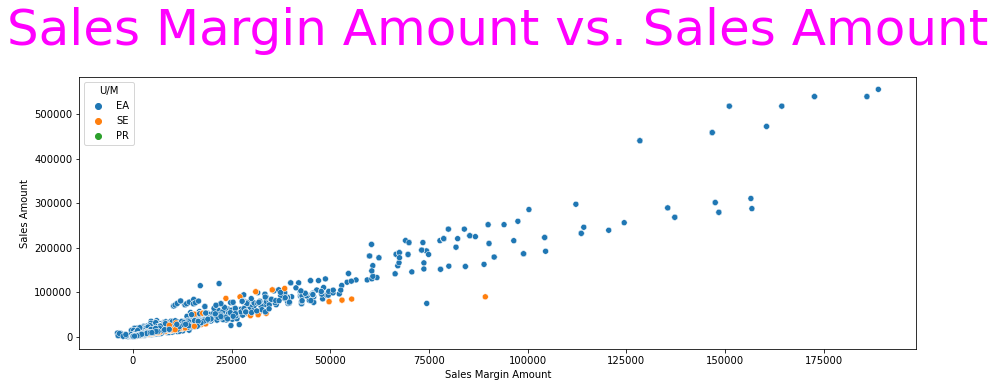

In [23]:
sns.scatterplot(x='Sales Margin Amount',y='Sales Amount',data=sales_data,hue='U/M')
plt.title('Sales Margin Amount vs. Sales Amount',fontsize=50,color='fuchsia',pad=32)

### Sales margin amount and sales amount are strongly positively correlated with very low dispersion and scattering of values.

Text(0.5, 1.0, 'Sales Margin Amount vs. Sales Amount based on list price')

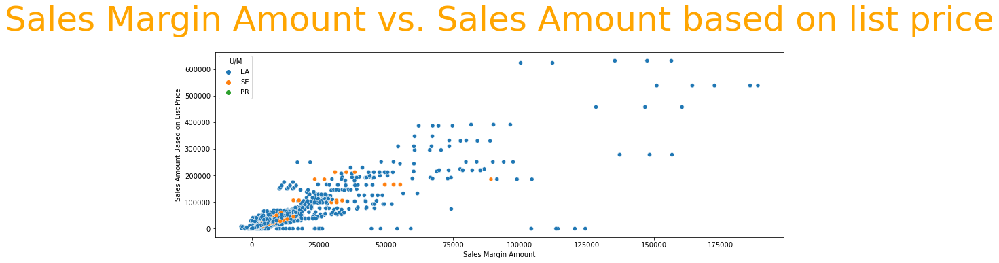

In [24]:
sns.scatterplot(x='Sales Margin Amount',y='Sales Amount Based on List Price',data=sales_data,hue='U/M')
plt.title('Sales Margin Amount vs. Sales Amount based on list price',fontsize=50,color='orange',pad=32)

### Sales margin amount and sales amount based on list price are strongly positively correlated with limited dispersion, variation and scattering of values with a few outliers available in their distribution as well.

Text(0.5, 1.0, 'Sales Margin Amount vs. Discount Amount')

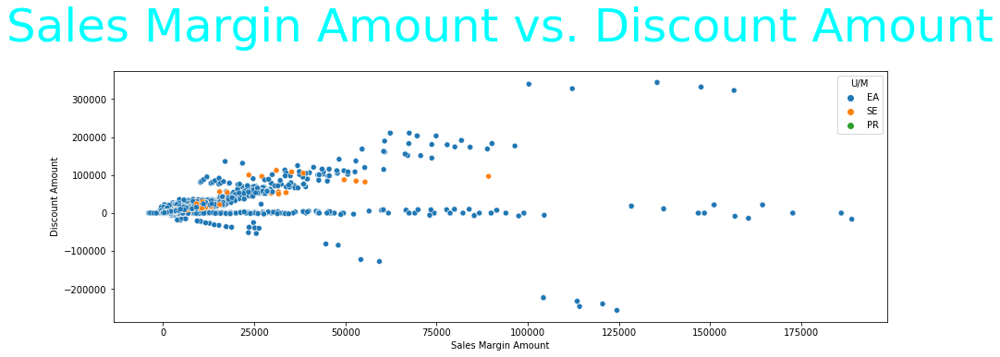

In [25]:
sns.scatterplot(x='Sales Margin Amount',y='Discount Amount',data=sales_data,hue='U/M')
plt.title('Sales Margin Amount vs. Discount Amount',fontsize=50,color='cyan',pad=32)

### Sales margin amount and discount amount are strongly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Discount Amount vs. Sales Amount based on list price')

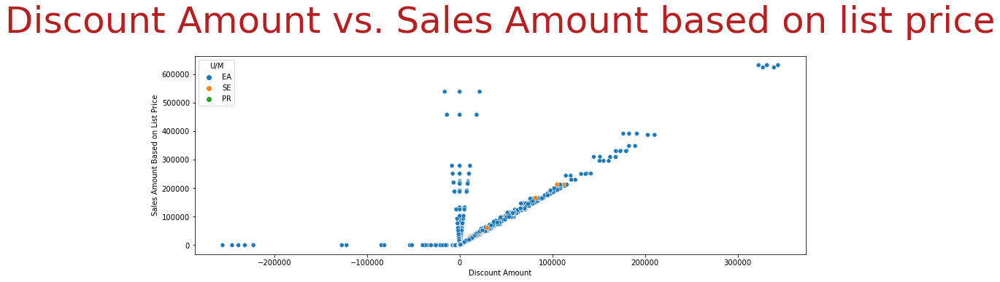

In [27]:
sns.scatterplot(x='Discount Amount',y='Sales Amount Based on List Price',data=sales_data,hue='U/M')
plt.title('Discount Amount vs. Sales Amount based on list price',fontsize=50,color='firebrick',pad=32)

### Discount amount and sales amount based on list price seem to be strongly positively correlated with their values overlapping with each other and from the above plot, it is quite evident that their values move along with each other and are dependent on each other to some extent.

In [4]:
pd.set_option('display.max_columns', 50)

In [32]:
sales_data.shape

(56993, 19)

C:\Users\hp\anaconda3\lib\site-packages\seaborn\distributions.py:1078: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, 'Sales Price vs. List Price')

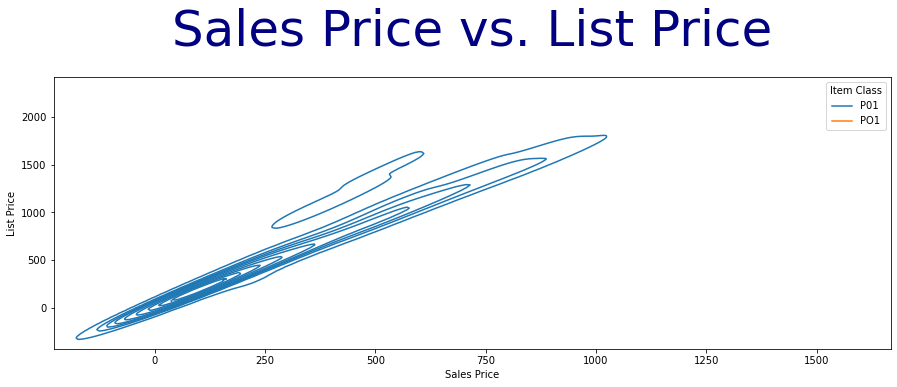

In [34]:
sns.kdeplot(x='Sales Price',y='List Price',data=sales_data[1:1000],hue='Item Class')
plt.title('Sales Price vs. List Price',fontsize=50,color='navy',pad=32)

### The kernel density estimation of the relationship between the two numerical variables Sales Price and List Price suggests that they are quite closely related throughout their random distribution.

In [33]:
sales_data['Sales Price'].nunique()

12674

Text(0.5, 1.0, 'Distribution of Sales Prices based on U/M')

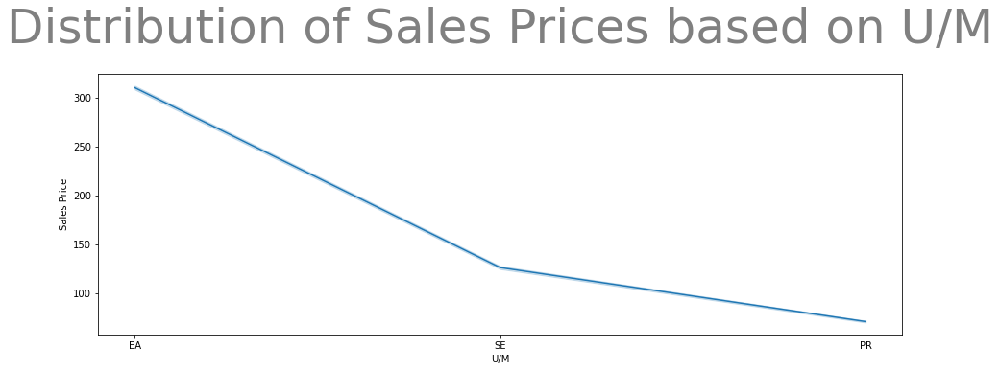

In [37]:
sns.lineplot(x='U/M',y='Sales Price',data=sales_data)
plt.title('Distribution of Sales Prices based on U/M',fontsize=50,color='grey',pad=32)

### Sales price is maximum for "EA" U/M while it's minimum for "PR" U/M.

Text(0.5, 1.0, 'Sales Amount vs. Sales Cost Amount')

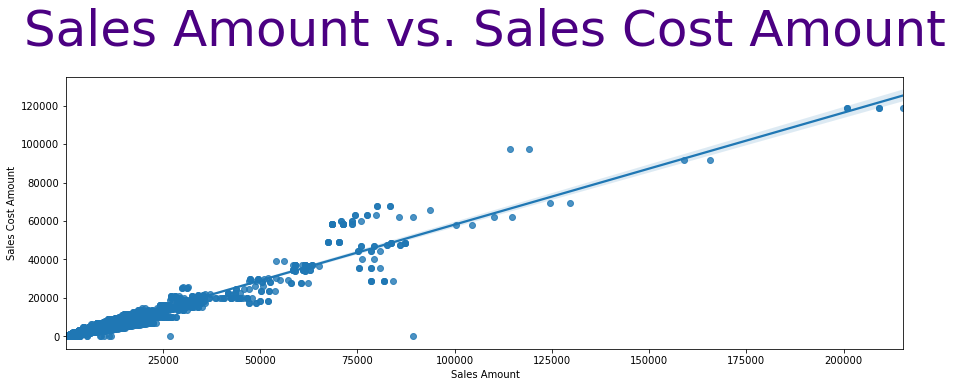

In [43]:
sns.regplot(x='Sales Amount',y='Sales Cost Amount',data=sales_data,x_ci=95)
plt.title('Sales Amount vs. Sales Cost Amount',fontsize=50,color='indigo',pad=32)

### Sales amount and sales cost amount are quite closely related.

Text(0.5, 1.0, 'Sales Amount vs. Sales Margin Amount')

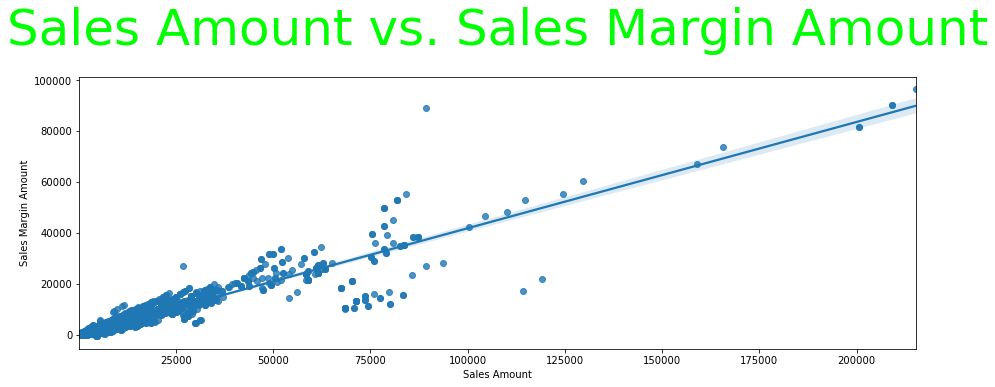

In [44]:
sns.regplot(x='Sales Amount',y='Sales Margin Amount',data=sales_data)
plt.title('Sales Amount vs. Sales Margin Amount',fontsize=50,color='lime',pad=32)

### Sales amount and sales margin amount are quite closely related.

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Margin Amount')

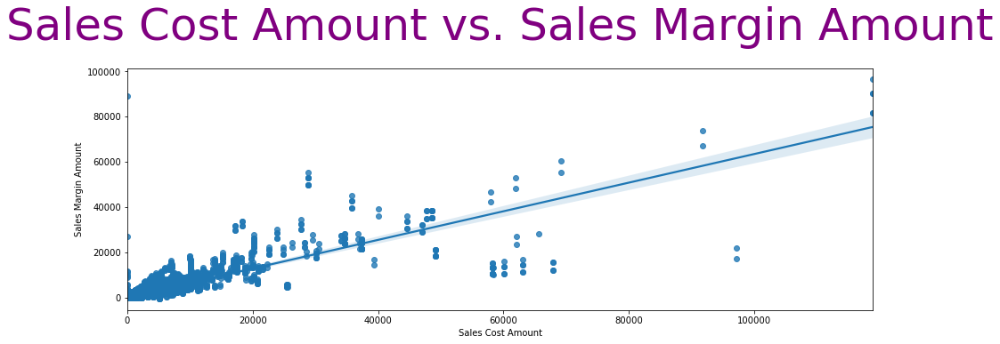

In [45]:
sns.regplot(x='Sales Cost Amount',y='Sales Margin Amount',data=sales_data)
plt.title('Sales Cost Amount vs. Sales Margin Amount',fontsize=50,pad=32,color='purple')

### Sales cost amount and sales margin amount are closely related especially in the lower range of values as is clearly evident by observing the above linear regression plot.

Text(0.5, 1.0, 'Discount Amount vs. Sales Cost Amount')

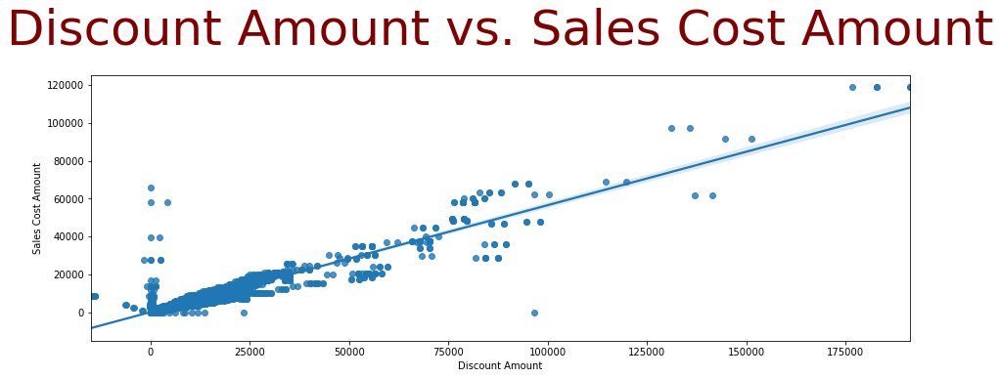

In [46]:
sns.regplot(x='Discount Amount',y='Sales Cost Amount',data=sales_data)
plt.title('Discount Amount vs. Sales Cost Amount',fontsize=50,color='maroon',pad=32)

### Discount amount and sales cost amount are strongly positively correlated with low dispersion, variation and scattering of values.

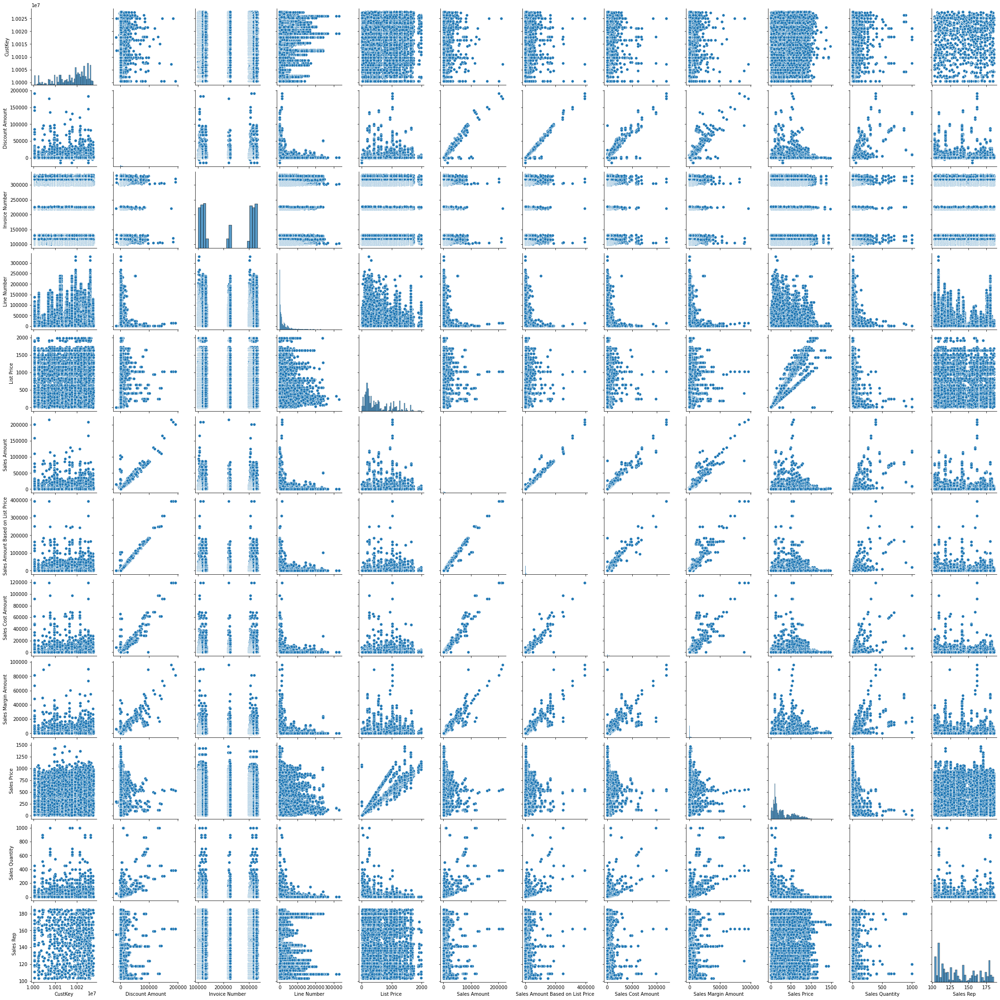

In [47]:
sns.pairplot(sales_data)

### From the above pairplot, it is quite evident that sales price and list price are very strongly positively correlated.
### Sales amount, sales cost amount, sales margin amount and sales amount based on list price are strongly correlated.
### Discount amount is strongly positively correlated to sales amount, sales cost amount, sales margin amount and sales amount based on list price.
### Sales quantity is mildly positively correlated to sales amount, sales cost amount, sales margin amount and sales amount based on list price.
### Sales cost amount and sales margin amount are strongly positively correlated.
### Customer key and sales rep are weakly negatively correlated.
### Sales price and sales quantity are weakly negatively correlated.
### Sales quantity and sales rep are very weakly negatively correlated.
### Sales rep is very weakly negatively correlated to both discount amount and sales cost amount.
### Sales rep is very weakly positively correlated to sales margin amount, in fact we can claim them to be independent of each other as well.
### Sales amount and customer key are almost independent of each other with a very less and negligible negative correlation.

Text(0.5, 1.0, 'Discount Amount vs. Sales Margin Amount')

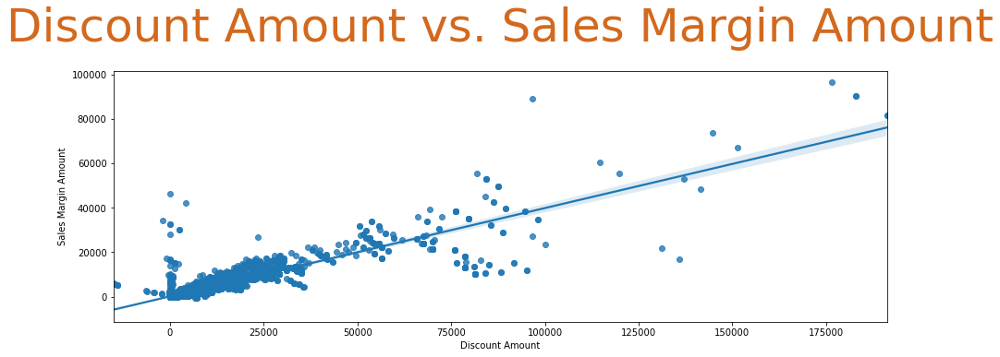

In [48]:
sns.regplot(x='Discount Amount',y='Sales Margin Amount',data=sales_data)
plt.title('Discount Amount vs. Sales Margin Amount',fontsize=50,color='chocolate',pad=32)

### Sales margin amount and discount amount seem to be strongly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Discount amount vs. Sales Amount based on list price')

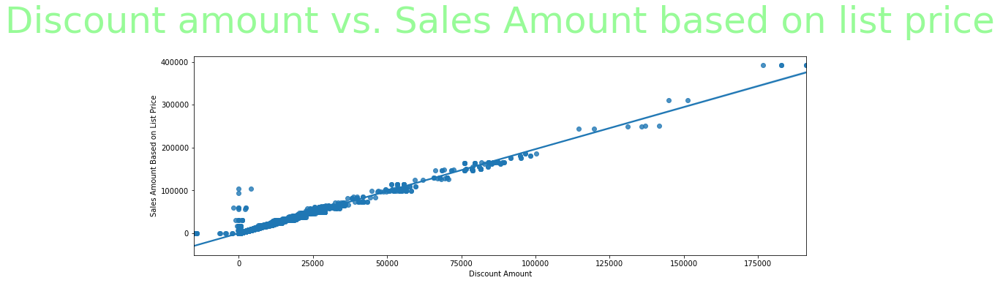

In [49]:
sns.regplot(x='Discount Amount',y='Sales Amount Based on List Price',data=sales_data)
plt.title('Discount amount vs. Sales Amount based on list price',fontsize=50,color='palegreen',pad=32)

### Discount amount and sales amount based on list price seem to be strongly positively correlated with low dispersion and scattering of values.

Text(0.5, 1.0, 'Discount Amount vs. List Price')

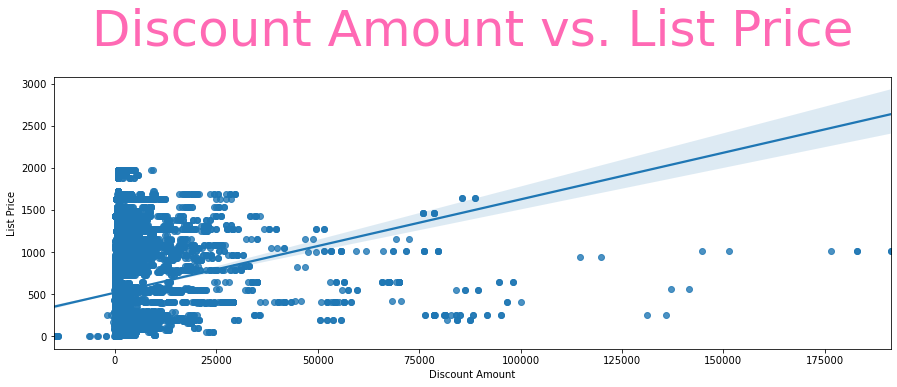

In [50]:
sns.regplot(x='Discount Amount',y='List Price',data=sales_data)
plt.title('Discount Amount vs. List Price',fontsize=50,color='hotpink',pad=32)

### List price and discount amount seem to be mildly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Regression plot of sales margin amount and sales amount based on list price')

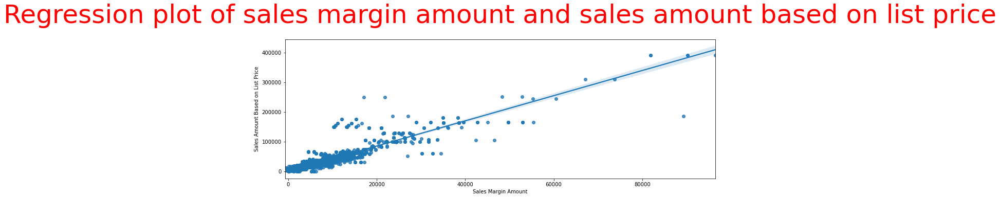

In [51]:
sns.regplot(x='Sales Margin Amount',y='Sales Amount Based on List Price',data=sales_data)
plt.title('Regression plot of sales margin amount and sales amount based on list price',fontsize=50,color='red',pad=32)

### Sales margin amount and sales amount seem to be strongly positively correlated with low dispersion and scattering of values.

Text(0.5, 1.0, 'Sales cost amount vs. sales amount based on list price')

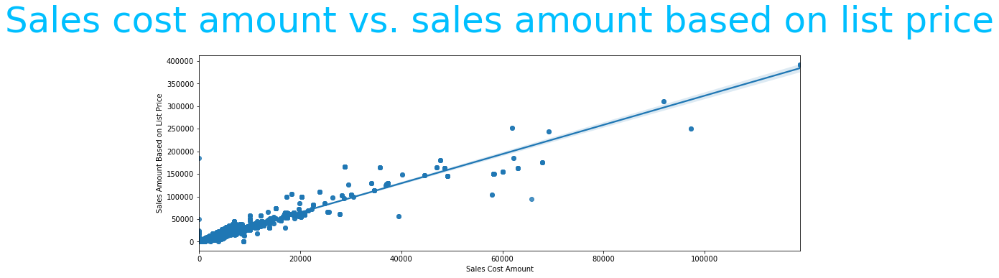

In [53]:
sns.regplot(x='Sales Cost Amount',y='Sales Amount Based on List Price',data=sales_data,x_ci=90)
plt.title('Sales cost amount vs. sales amount based on list price',fontsize=50,color='deepskyblue',pad=32)

### Sales cost amount and sales amount based on list price seem to be strongly positively correlated with low dispersion and scattering of values.

Text(0.5, 1.0, 'Sales quantity vs. sales amount')

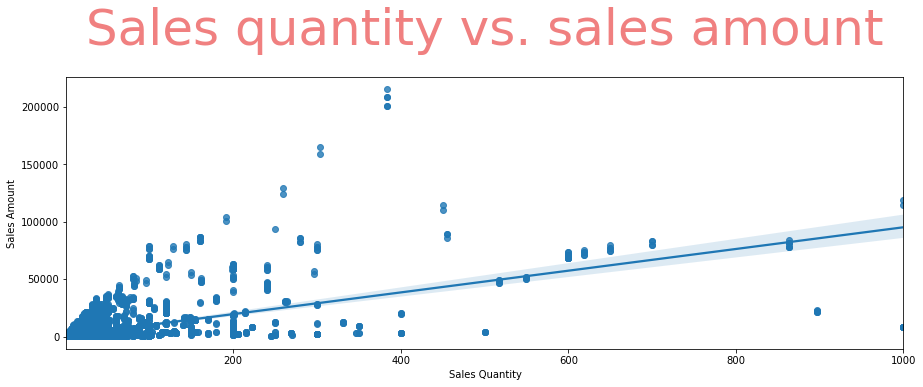

In [54]:
sns.regplot(x='Sales Quantity',y='Sales Amount',data=sales_data)
plt.title('Sales quantity vs. sales amount',fontsize=50,color='lightcoral',pad=32)

### Sales amount and sales quantity seem to be mildly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Sales quantity vs. sales cost amount')

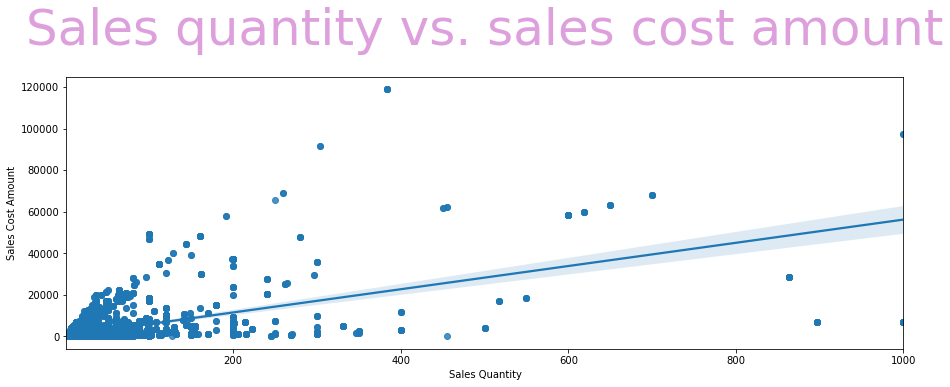

In [55]:
sns.regplot(x='Sales Quantity',y='Sales Cost Amount',data=sales_data)
plt.title('Sales quantity vs. sales cost amount',fontsize=50,color='plum',pad=32)

### Sales cost amount and sales quantity seem to be mildly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Sales quantity vs. sales margin amount')

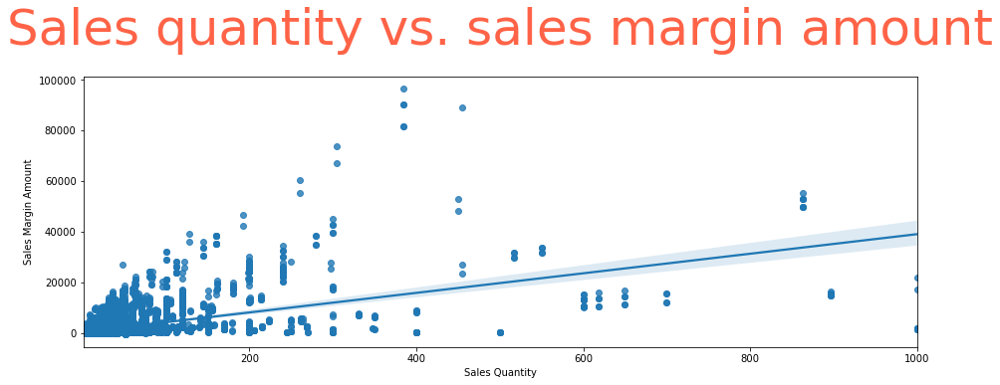

In [56]:
sns.regplot(x='Sales Quantity',y='Sales Margin Amount',data=sales_data)
plt.title('Sales quantity vs. sales margin amount',fontsize=50,color='tomato',pad=32)

### Sales margin amount and sales quantity seem to be mildly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Sales quantity vs. sales amount based on list price')

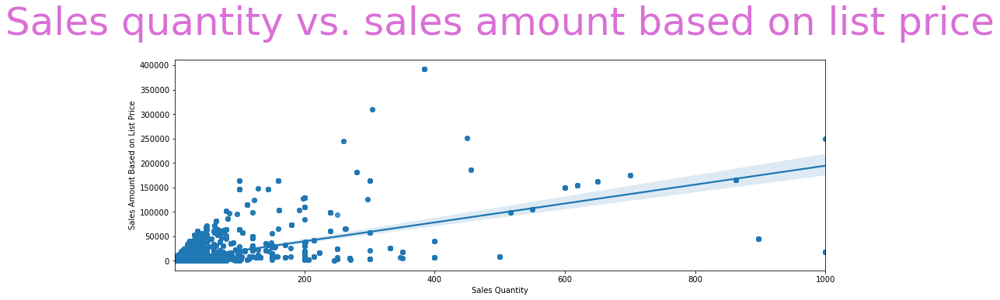

In [57]:
sns.regplot(x='Sales Quantity',y='Sales Amount Based on List Price',data=sales_data)
plt.title('Sales quantity vs. sales amount based on list price',fontsize=50,color='orchid',pad=32)

### Sales amount based on list price and sales quantity seem to be mildly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Sales quantity vs. discount amount')

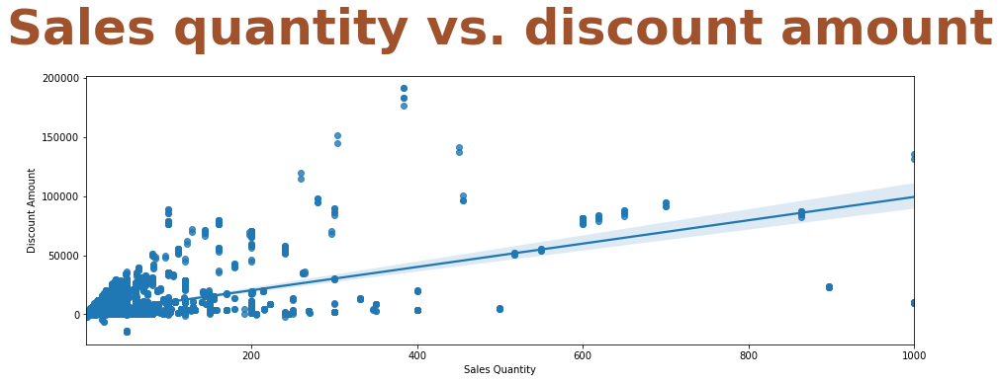

In [60]:
sns.regplot(x='Sales Quantity',y='Discount Amount',data=sales_data,x_ci=95)
plt.title('Sales quantity vs. discount amount',fontsize=50,color='sienna',pad=32,fontweight='bold')

### Discount amount and sales quantity seem to be mildly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Discount amount vs. sales amount')

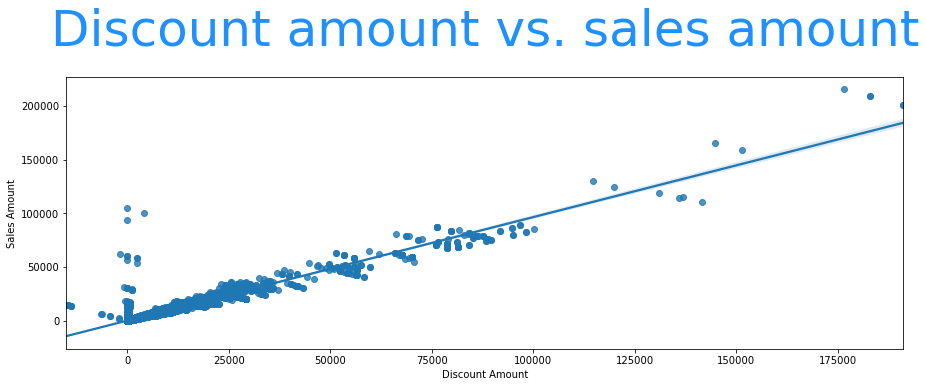

In [61]:
sns.regplot(x='Discount Amount',y='Sales Amount',data=sales_data)
plt.title('Discount amount vs. sales amount',fontsize=50,color='dodgerblue',pad=32)

### Discount amount and sales amount seem to be strongly positively correlated with low dispersion and scattering of values.

Text(0.5, 1.0, 'Distribution of Sales Amount based on unit of measure')

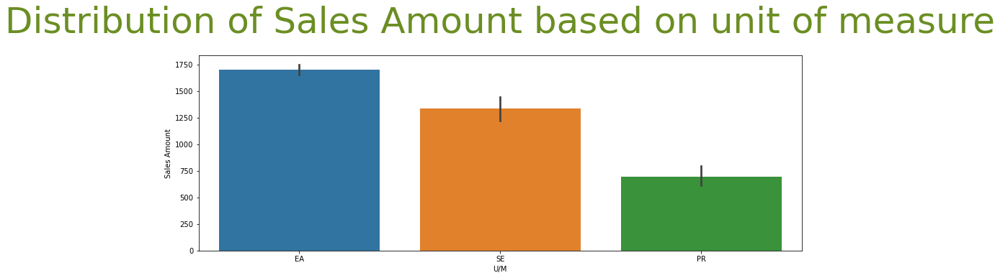

In [62]:
sns.barplot(x='U/M',y='Sales Amount',data=sales_data)
plt.title('Distribution of Sales Amount based on unit of measure',fontsize=50,color='olivedrab',pad=32)

### Maximum sales amount has been produced in "EA" U/M, while minimum in "PR" U/M.

Text(0.5, 1.0, 'Distribution of Sales Cost Amount based on unit of measure')

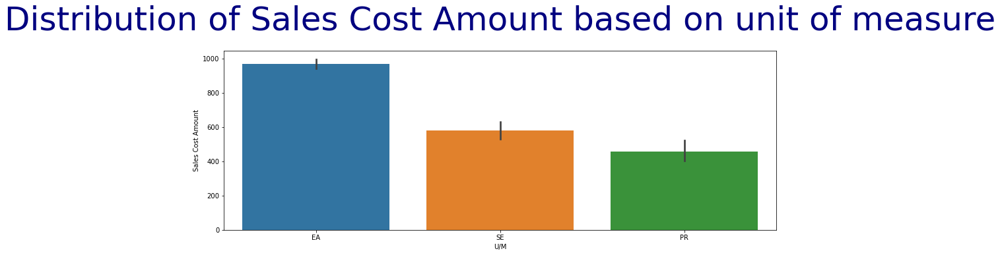

In [63]:
sns.barplot(x='U/M',y='Sales Cost Amount',data=sales_data)
plt.title('Distribution of Sales Cost Amount based on unit of measure',fontsize=50,color='navy',pad=32)

### "EA" U/M has maximum sales cost amount while "PR" U/M has minimum sales cost amount.

Text(0.5, 1.0, 'Distribution of Sales Margin Amount based on unit of measure')

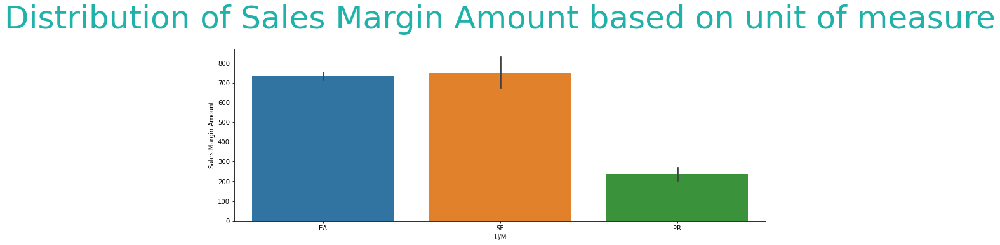

In [64]:
sns.barplot(x='U/M',y='Sales Margin Amount',data=sales_data)
plt.title('Distribution of Sales Margin Amount based on unit of measure',fontsize=50,color='lightseagreen',pad=32)

### "SE" U/M has maximum sales margin amount while "PR" U/M has minimum sales margin amount.

Text(0.5, 1.0, 'Distribution of Sales Amount based on list price depending upon unit of measure')

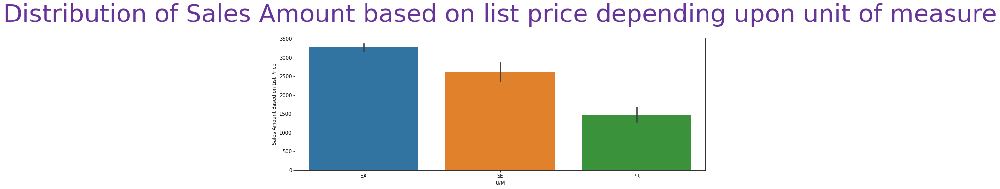

In [67]:
sns.barplot(x='U/M',y='Sales Amount Based on List Price',data=sales_data)
plt.title('Distribution of Sales Amount based on list price depending upon unit of measure',fontsize=50,color='rebeccapurple',pad=32)

### "EA" U/M has maximum sales amount based on list price, while "PR" U/M has minimum of the same.

Text(0.5, 1.0, 'Distribution of sales price based on unit of measure')

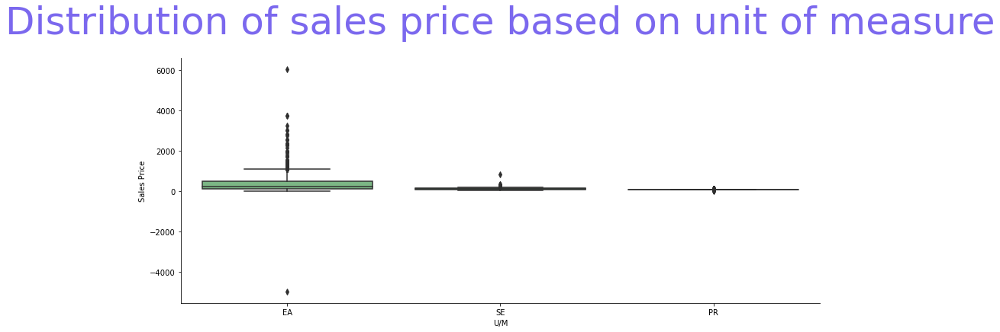

In [9]:
sns.catplot(x='U/M',y='Sales Price',data=sales_data,kind='box',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales price based on unit of measure')

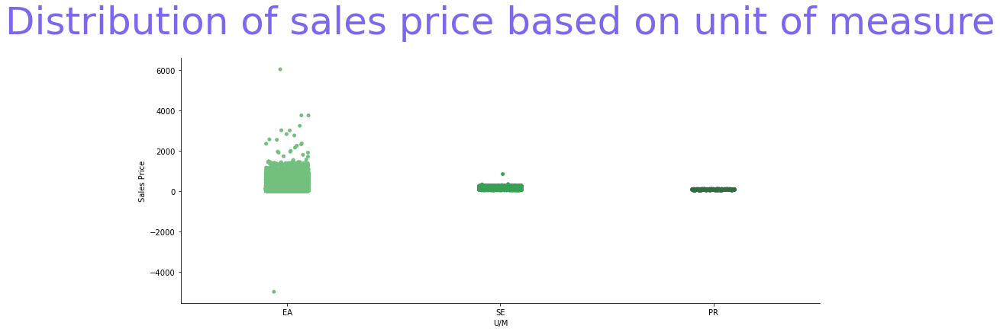

In [10]:
sns.catplot(x='U/M',y='Sales Price',data=sales_data,kind='strip',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales price based on unit of measure')

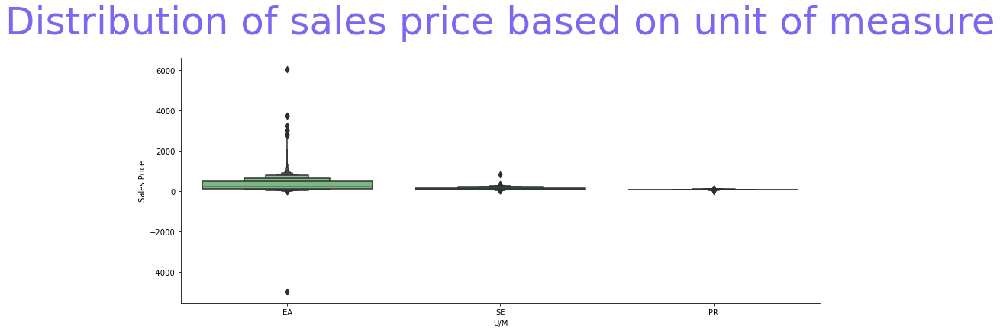

In [5]:
sns.catplot(x='U/M',y='Sales Price',data=sales_data,kind='boxen',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales price based on unit of measure')

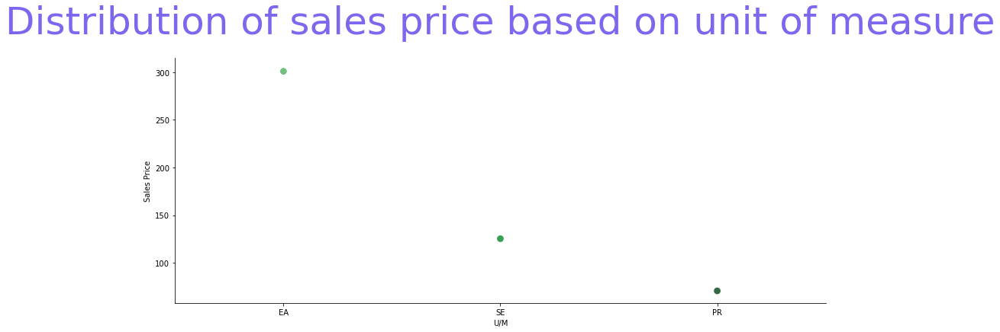

In [6]:
sns.catplot(x='U/M',y='Sales Price',data=sales_data,kind='point',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales price based on unit of measure')

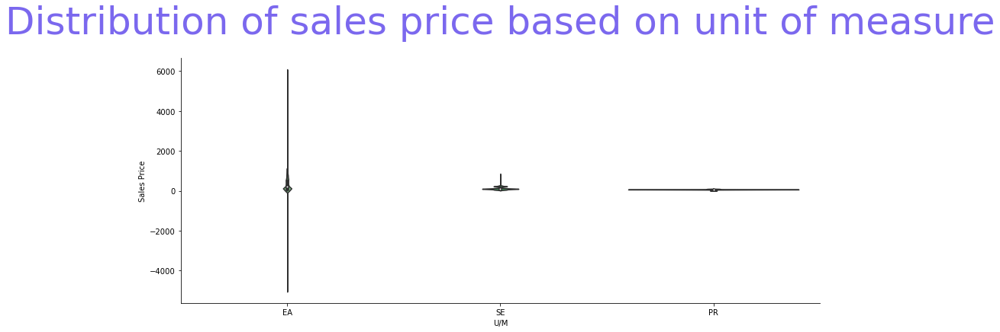

In [8]:
sns.catplot(x='U/M',y='Sales Price',data=sales_data,kind='violin',palette='Greens_d',seed=123,height=5,aspect=2.5,ci=98,n_boot=1200)
plt.title('Distribution of sales price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

### Maximum sales price has been generated in the "EA" unit of measure while minimum of that has been obtained in "PR" U/M.¶

In [ ]:
# sns.catplot(x='U/M',y='Sales Price',data=sales_data,kind='swarm',palette='Greens_d',seed=123,height=5,aspect=2.5,ci=99,n_boot=1200)
# plt.title('Distribution of sales price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales amount based on list price based on unit of measure')

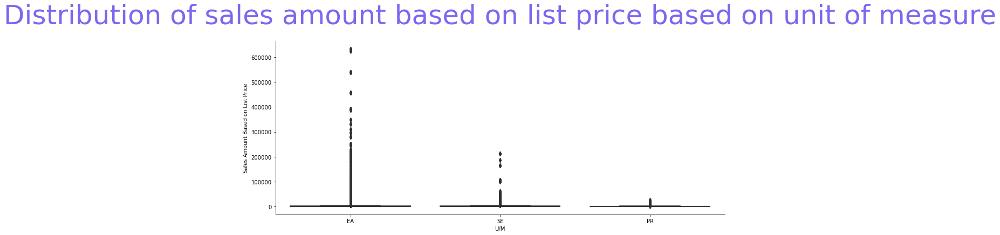

In [4]:
sns.catplot(x='U/M',y='Sales Amount Based on List Price',data=sales_data,kind='box',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales amount based on list price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales amount based on list price based on unit of measure')

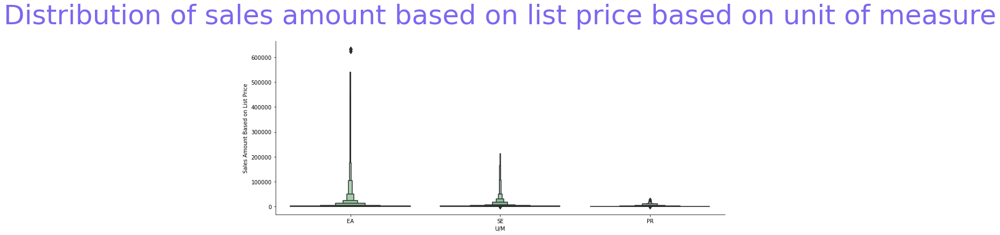

In [5]:
sns.catplot(x='U/M',y='Sales Amount Based on List Price',data=sales_data,kind='boxen',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales amount based on list price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales amount based on list price based on unit of measure')

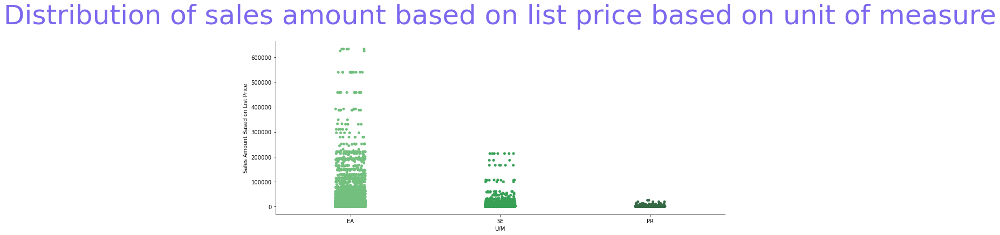

In [6]:
sns.catplot(x='U/M',y='Sales Amount Based on List Price',data=sales_data,kind='strip',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales amount based on list price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales amount based on list price based on unit of measure')

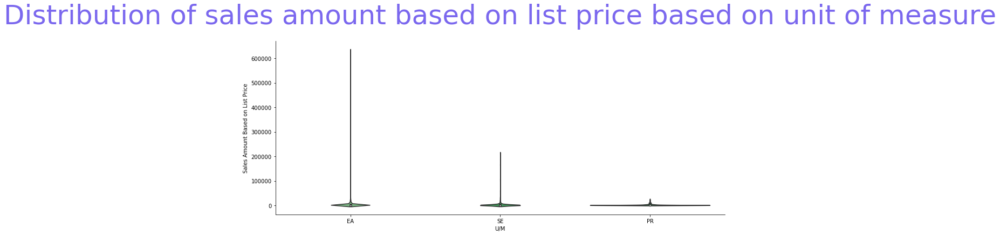

In [8]:
sns.catplot(x='U/M',y='Sales Amount Based on List Price',data=sales_data,kind='violin',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales amount based on list price based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

### Maximum sales amount has been generated in the "EA" unit of measure while minimum of that has been obtained in "PR" U/M.¶

Text(0.5, 1.0, 'Distribution of sales cost amount based on unit of measure')

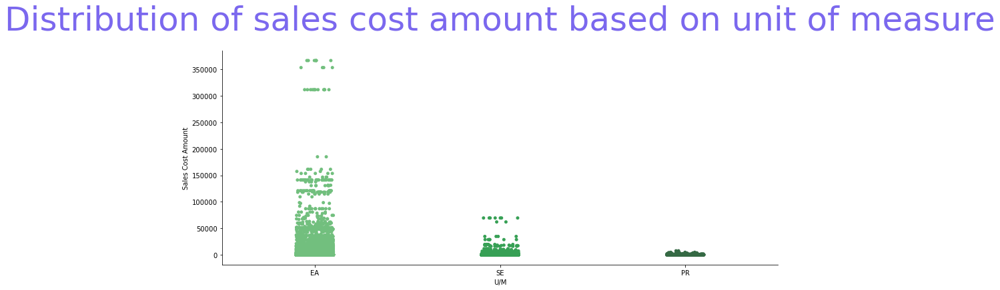

In [9]:
sns.catplot(x='U/M',y='Sales Cost Amount',data=sales_data,kind='strip',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales cost amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales cost amount based on unit of measure')

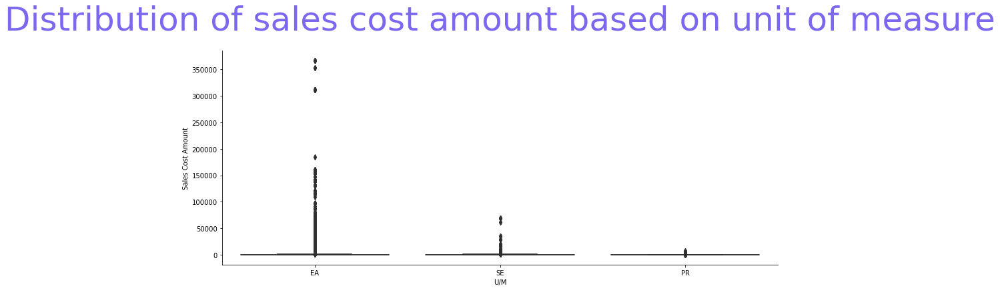

In [10]:
sns.catplot(x='U/M',y='Sales Cost Amount',data=sales_data,kind='box',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales cost amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales cost amount based on unit of measure')

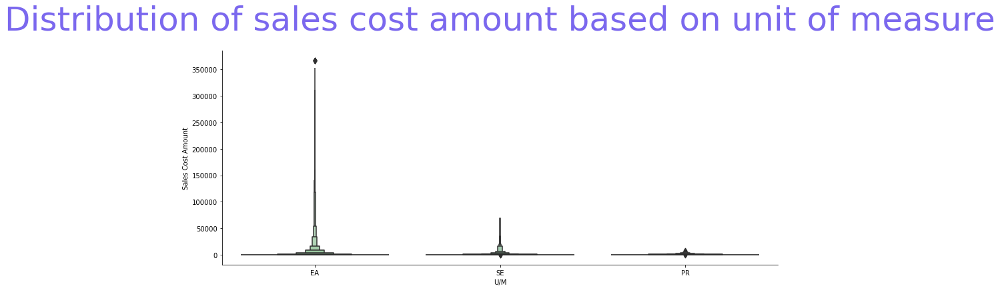

In [11]:
sns.catplot(x='U/M',y='Sales Cost Amount',data=sales_data,kind='boxen',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales cost amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales cost amount based on unit of measure')

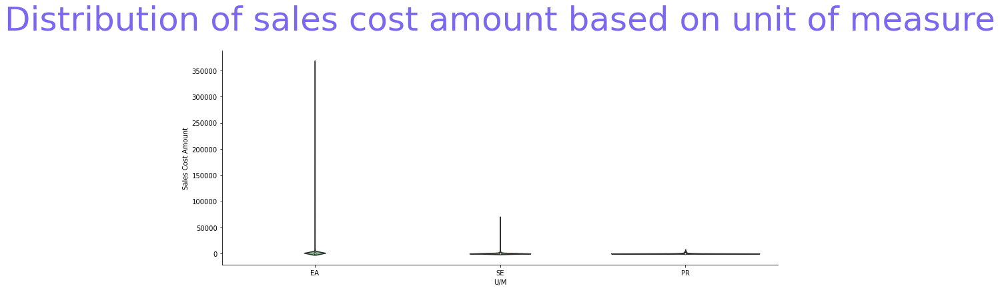

In [12]:
sns.catplot(x='U/M',y='Sales Cost Amount',data=sales_data,kind='violin',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales cost amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales cost amount based on unit of measure')

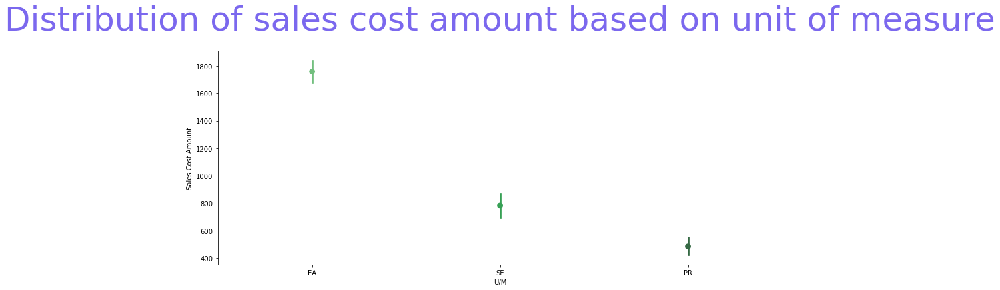

In [13]:
sns.catplot(x='U/M',y='Sales Cost Amount',data=sales_data,kind='point',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales cost amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

### Maximum sales cost amount has been generated in the "EA" unit of measure while minimum of that has been obtained in "PR" U/M.

Text(0.5, 1.0, 'Distribution of sales margin amount based on unit of measure')

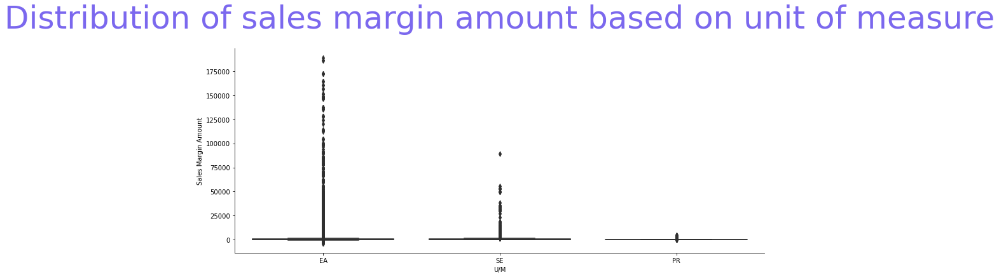

In [14]:
sns.catplot(x='U/M',y='Sales Margin Amount',data=sales_data,kind='box',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales margin amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales margin amount based on unit of measure')

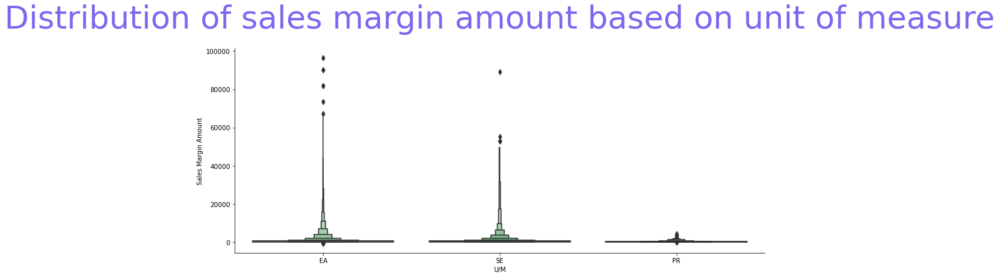

In [39]:
sns.catplot(x='U/M',y='Sales Margin Amount',data=sales_data,kind='boxen',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales margin amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales margin amount based on unit of measure')

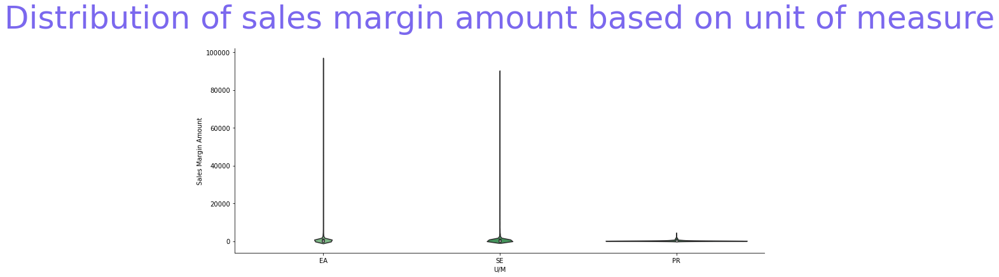

In [38]:
sns.catplot(x='U/M',y='Sales Margin Amount',data=sales_data,kind='violin',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales margin amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales margin amount based on unit of measure')

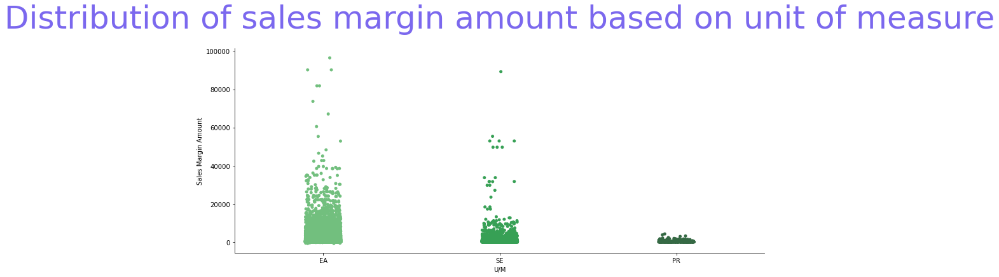

In [37]:
sns.catplot(x='U/M',y='Sales Margin Amount',data=sales_data,kind='strip',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales margin amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales margin amount based on unit of measure')

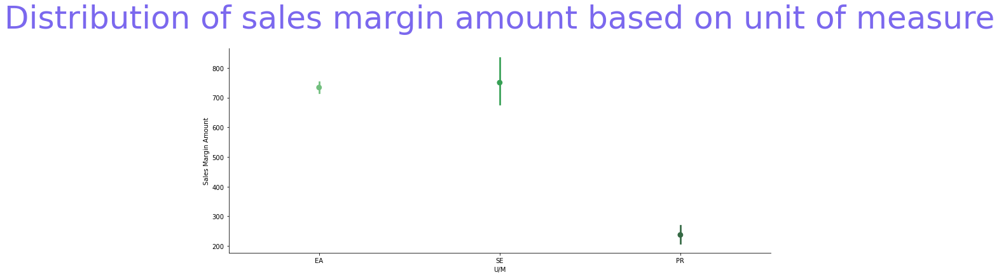

In [36]:
sns.catplot(x='U/M',y='Sales Margin Amount',data=sales_data,kind='point',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales margin amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

### Maximum sales margin amount has been generated in the sales having "SE" unit of measure while minimum of that has been obtained in the ones having "PR" U/M.

Text(0.5, 1.0, 'Distribution of discount amount based on unit of measure')

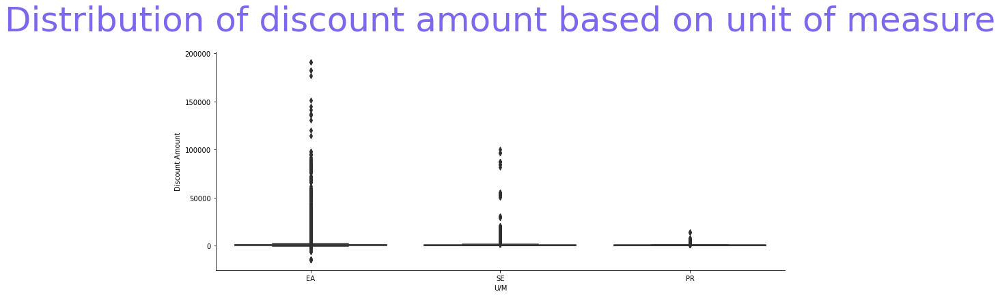

In [35]:
sns.catplot(x='U/M',y='Discount Amount',data=sales_data,kind='box',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of discount amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of discount amount based on unit of measure')

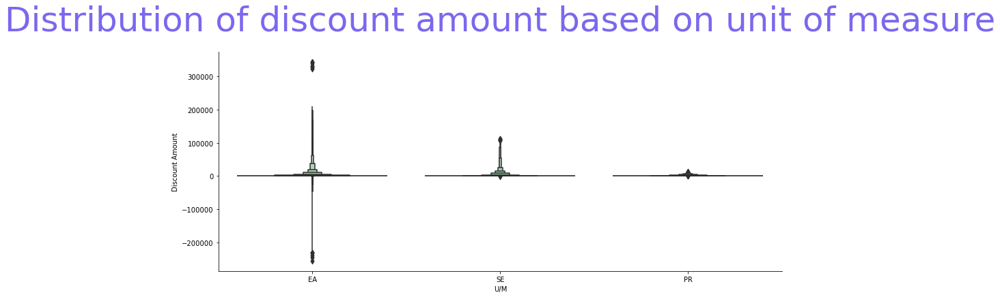

In [20]:
sns.catplot(x='U/M',y='Discount Amount',data=sales_data,kind='boxen',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of discount amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of discount amount based on unit of measure')

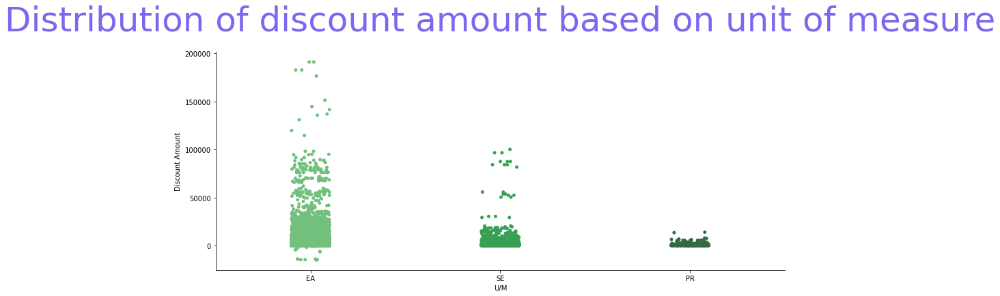

In [34]:
sns.catplot(x='U/M',y='Discount Amount',data=sales_data,kind='strip',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of discount amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of discount amount based on unit of measure')

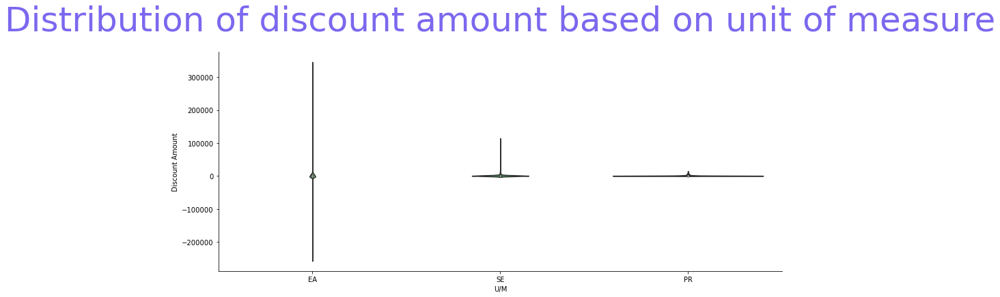

In [22]:
sns.catplot(x='U/M',y='Discount Amount',data=sales_data,kind='violin',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of discount amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of discount amount based on unit of measure')

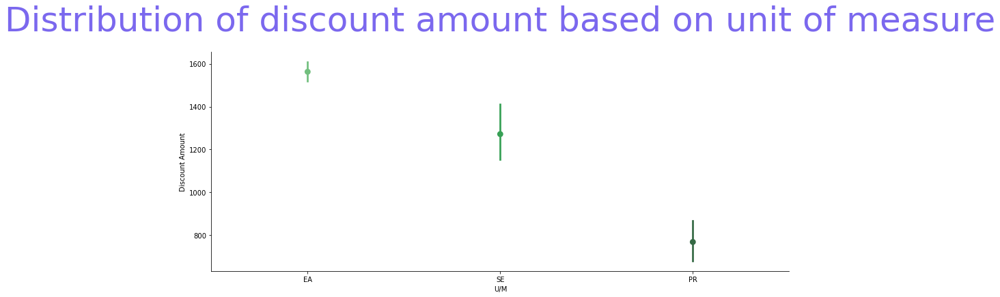

In [33]:
sns.catplot(x='U/M',y='Discount Amount',data=sales_data,kind='point',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of discount amount based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

### Maximum discount amount has been generated in the sales having "EA" unit of measure while minimum discount amount has been obtained in "PR" U/M.

Text(0.5, 1.0, 'Distribution of sales quantity based on unit of measure')

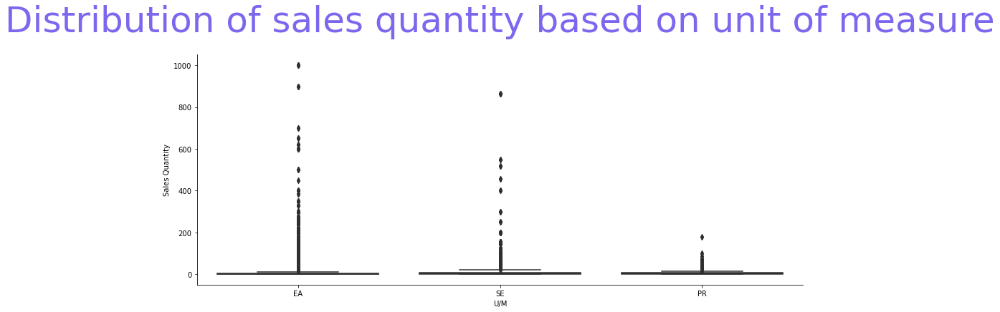

In [32]:
sns.catplot(x='U/M',y='Sales Quantity',data=sales_data,kind='box',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales quantity based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales quantity based on unit of measure')

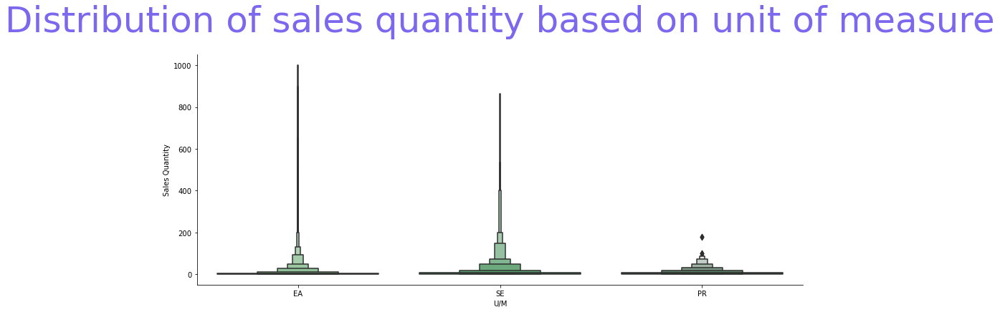

In [31]:
sns.catplot(x='U/M',y='Sales Quantity',data=sales_data,kind='boxen',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales quantity based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales quantity based on unit of measure')

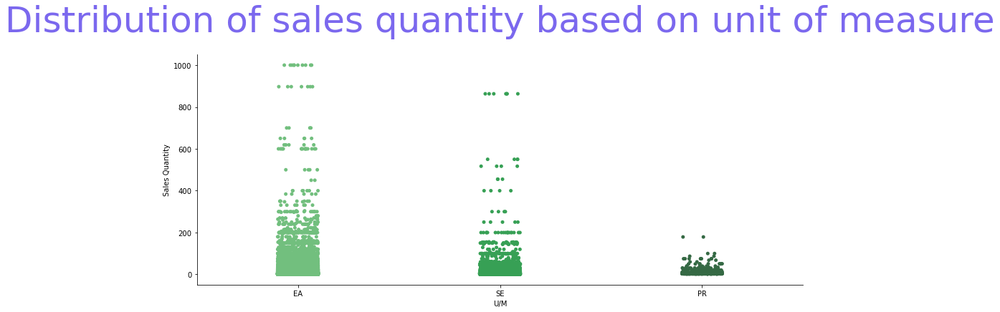

In [30]:
sns.catplot(x='U/M',y='Sales Quantity',data=sales_data,kind='strip',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales quantity based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales quantity based on unit of measure')

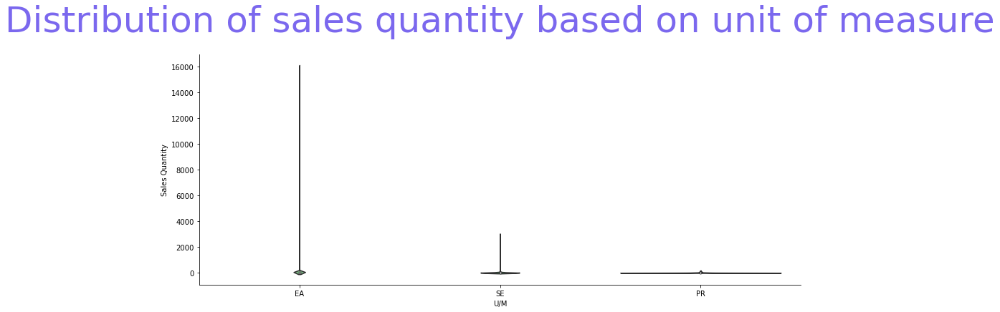

In [27]:
sns.catplot(x='U/M',y='Sales Quantity',data=sales_data,kind='violin',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales quantity based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

Text(0.5, 1.0, 'Distribution of sales quantity based on unit of measure')

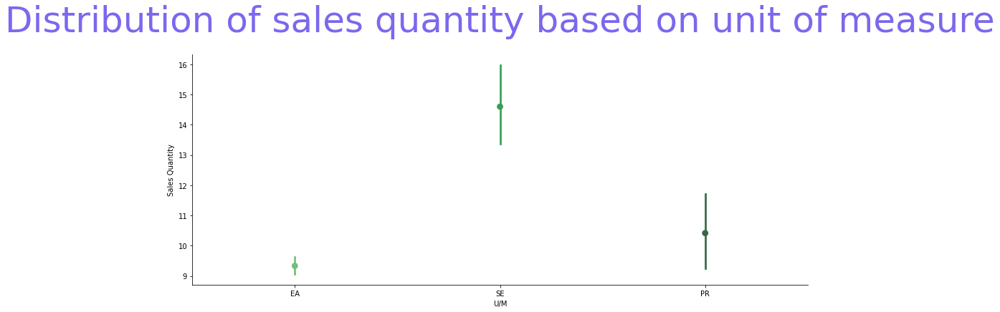

In [29]:
sns.catplot(x='U/M',y='Sales Quantity',data=sales_data,kind='point',palette='Greens_d',seed=123,height=5,aspect=2.5)
plt.title('Distribution of sales quantity based on unit of measure',fontsize=50,color='mediumslateblue',pad=32)

C:\Users\hp\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 91.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\hp\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 63.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, 'Swarm plot of sales quantity based on unit of measure')

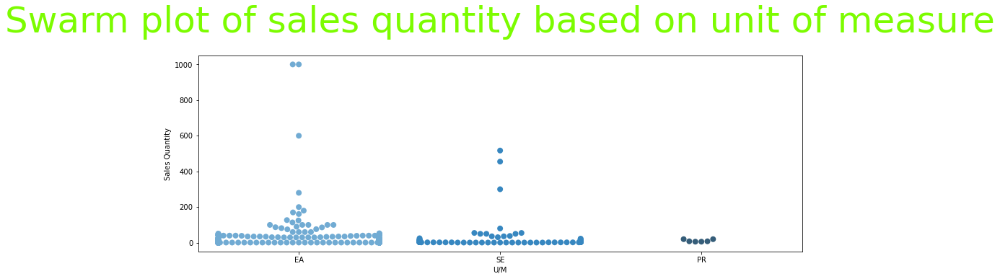

In [41]:
sns.swarmplot(x='U/M',y='Sales Quantity',data=sales_data[1:1000],palette='Blues_d',size=8)
plt.title('Swarm plot of sales quantity based on unit of measure',fontsize=50,color='lawngreen',pad=32)

### Maximum quantities having "EA" unit of measure have been generated while minimum quantities have been generated for "PR" U/M.

Text(0, 0.5, 'Sales margin amount')

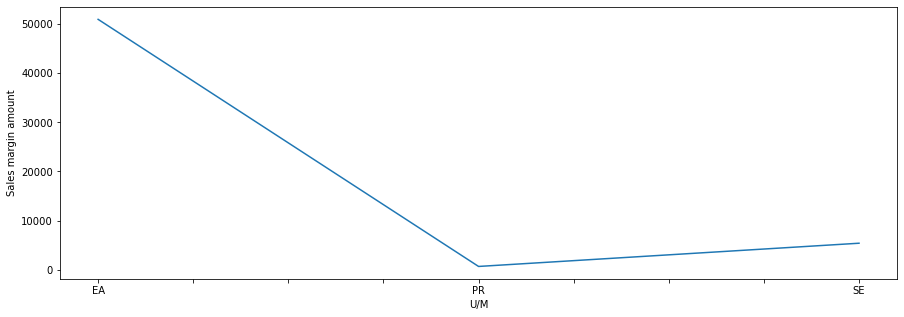

In [39]:
sales_data.groupby('U/M')['Sales Margin Amount'].count().plot(kind='line')
plt.ylabel('Sales margin amount')

### Sales margin amount is maximum for "EA" unit of measure while it is minimum for "PR".

Text(0, 0.5, 'Sales cost amount')

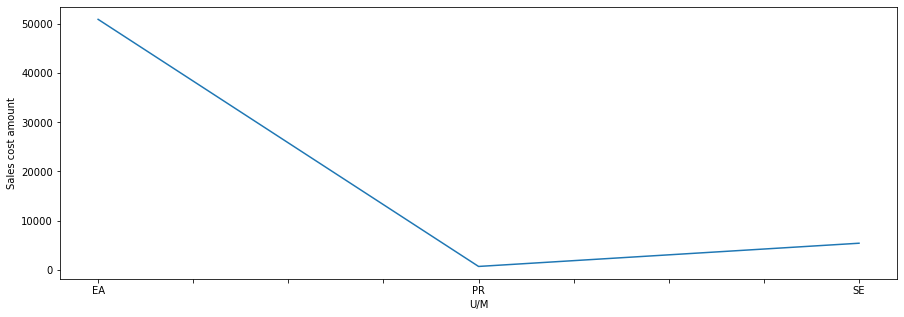

In [40]:
sales_data.groupby('U/M')['Sales Cost Amount'].count().plot(kind='line')
plt.ylabel('Sales cost amount')

### Sales cost amount is maximum for "EA" unit of measure while it is minimum for "PR".

Text(0, 0.5, 'Sales amount based on list price')

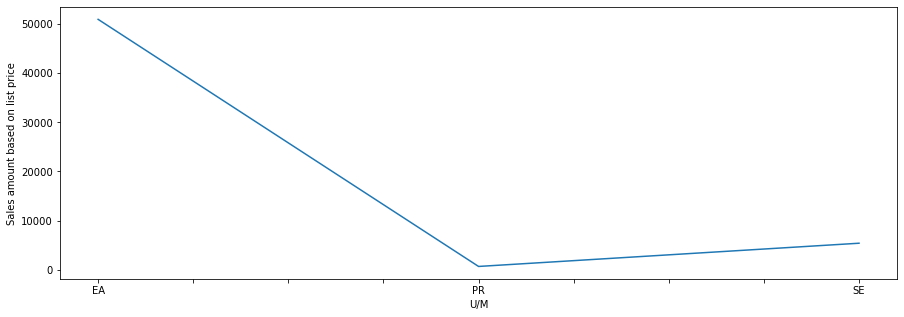

In [41]:
sales_data.groupby('U/M')['Sales Amount Based on List Price'].count().plot(kind='line')
plt.ylabel('Sales amount based on list price')

### Sales amount based on list price is maximum for "EA" unit of measure while it is minimum for "PR".

Text(0, 0.5, 'Discount Amount')

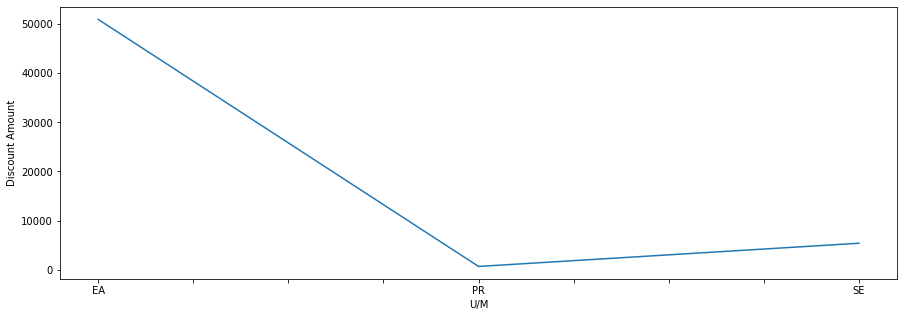

In [42]:
sales_data.groupby('U/M')['Discount Amount'].count().plot(kind='line')
plt.ylabel('Discount Amount')

### Discount amount is maximum for "EA" unit of measure while it is minimum for "PR".

Text(0, 0.5, 'Sales Price')

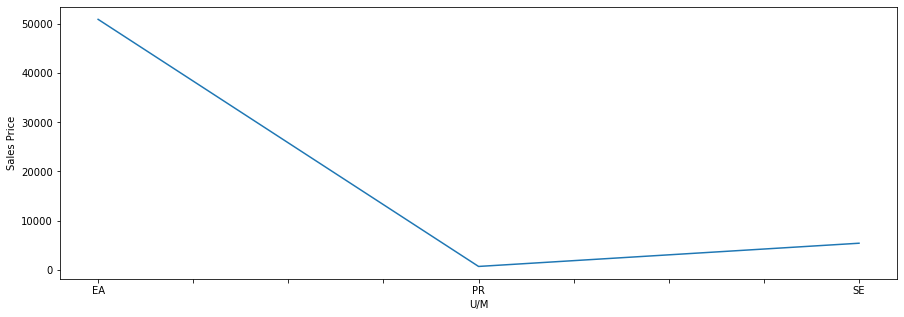

In [43]:
sales_data.groupby('U/M')['Sales Price'].count().plot(kind='line')
plt.ylabel('Sales Price')

### Sales price is maximum for "EA" unit of measure while it is minimum for "PR".

Text(0, 0.5, 'List Price')

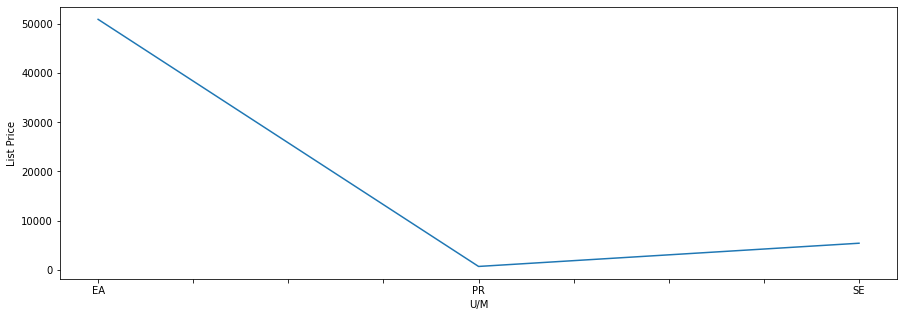

In [44]:
sales_data.groupby('U/M')['List Price'].count().plot(kind='line')
plt.ylabel('List Price')

### List price is maximum for "EA" unit of measure while it is minimum for "PR".

Text(0.5, 1.0, 'Distribution of unit of measure')

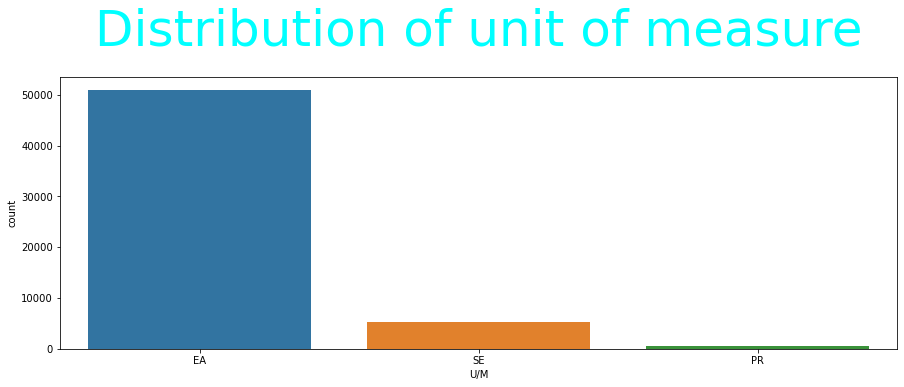

In [33]:
sns.countplot(x='U/M',data=sales_data)
plt.title('Distribution of unit of measure',fontsize=50,color='cyan',pad=32)

### "EA" U/M has been used the most while "PR" U/M has been the most sparingly used.

<AxesSubplot:ylabel='U/M'>

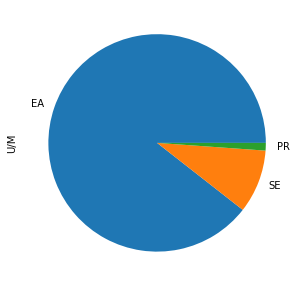

In [34]:
sales_data['U/M'].value_counts().plot(kind='pie')

### "EA" unit of measure has been mostly used throughout all the sales.

<AxesSubplot:ylabel='Item Class'>

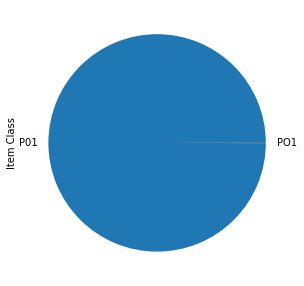

In [35]:
sales_data['Item Class'].value_counts().plot(kind='pie')

### P01 item class has been used almost completely throughout all the sales.

<AxesSubplot:>

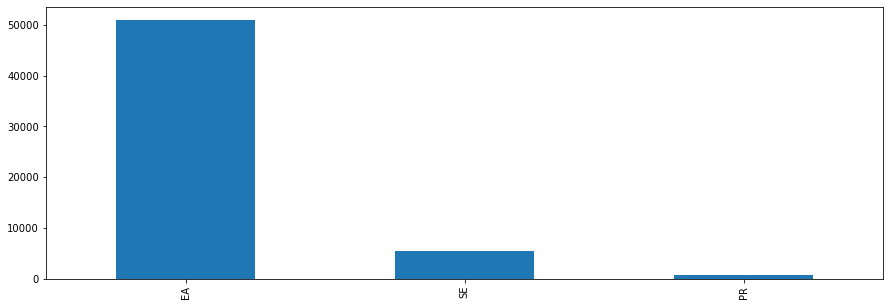

In [36]:
sales_data['U/M'].value_counts().plot(kind='bar')

### "EA" unit of measure has been leveraged the most throughout the Amazon sales while "SE" and "PR" have been sparingly used.

Text(0, 0.5, 'Discount Amount')

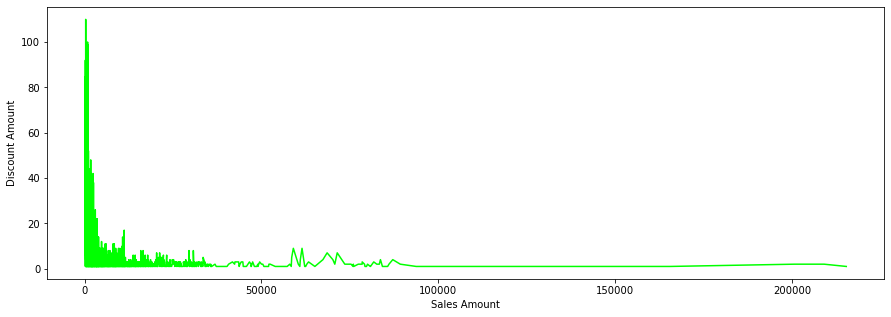

In [48]:
pd.pivot_table(index='Sales Amount',values='Discount Amount',data=sales_data,aggfunc='count').plot(kind='line',color='lime',legend=None)
plt.ylabel('Discount Amount')

### Discount amount and sales amount are strongly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount.

Text(0, 0.5, 'Sales Cost Amount')

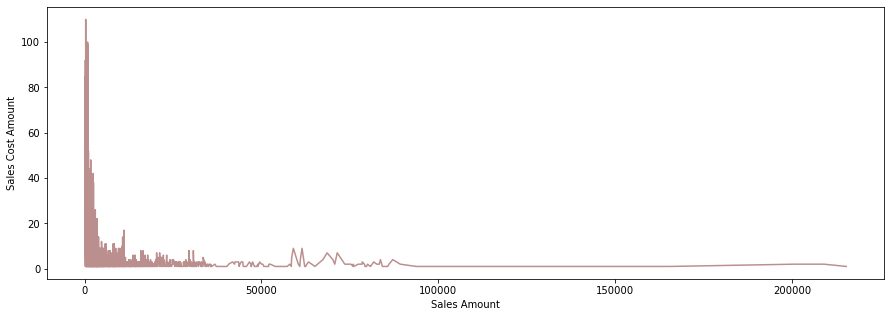

In [50]:
pd.pivot_table(index='Sales Amount',values='Sales Cost Amount',data=sales_data,aggfunc='count').plot(kind='line',color='rosybrown',legend=None)
plt.ylabel('Sales Cost Amount')

### Sales cost amount and sales amount are strongly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount.

Text(0, 0.5, 'Sales Margin Amount')

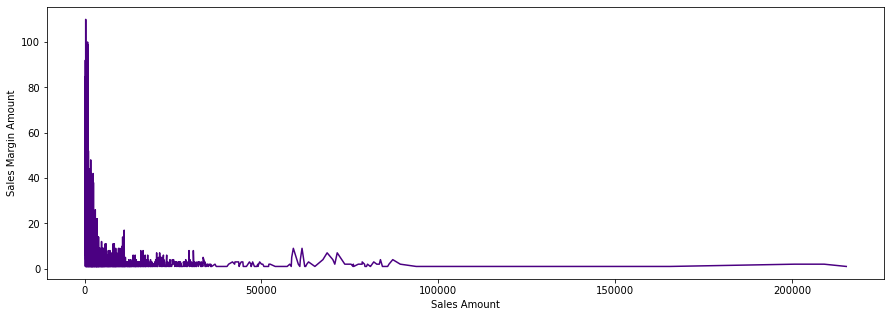

In [51]:
pd.pivot_table(index='Sales Amount',values='Sales Margin Amount',data=sales_data,aggfunc='count').plot(kind='line',color='indigo',legend=None)
plt.ylabel('Sales Margin Amount')

### Sales margin amount and sales amount are strongly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount.

Text(0, 0.5, 'Sales Amount based on list price')

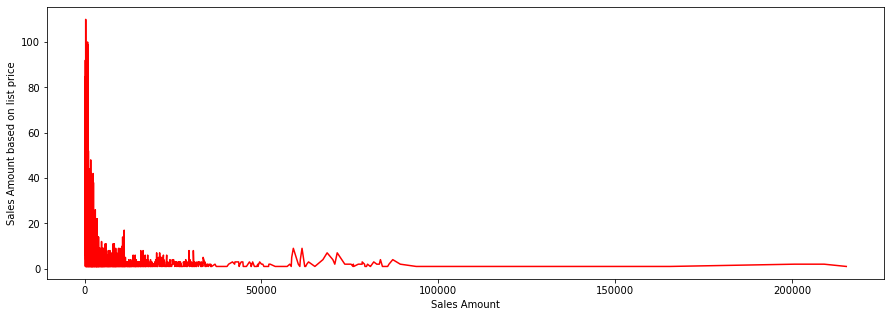

In [53]:
pd.pivot_table(index='Sales Amount',values='Sales Amount Based on List Price',data=sales_data,aggfunc='count').plot(kind='line',color='red',legend=None)
plt.ylabel('Sales Amount based on list price')

### Sales amount based on list price and sales amount are strongly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount.

Text(0, 0.5, 'Sales Price')

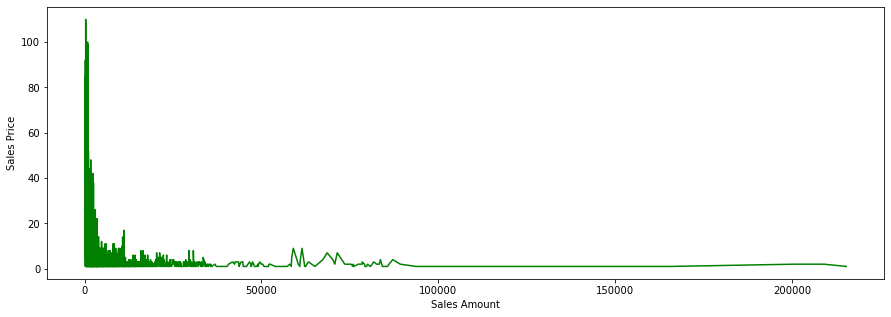

In [54]:
pd.pivot_table(index='Sales Amount',values='Sales Price',data=sales_data,aggfunc='count').plot(kind='line',color='green',legend=None)
plt.ylabel('Sales Price')

### Sales price and sales amount are weakly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount.

Text(0, 0.5, 'List Price')

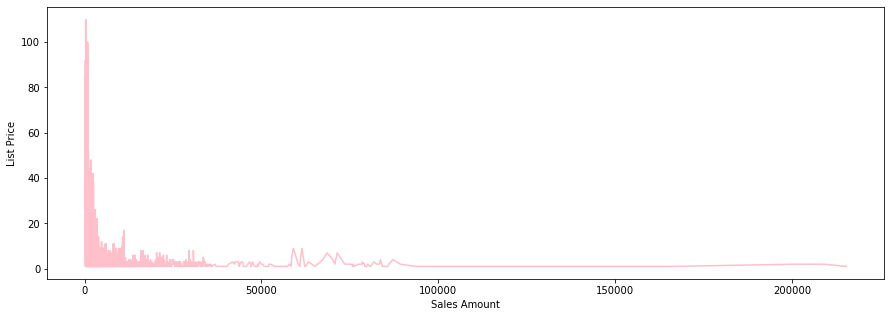

In [55]:
pd.pivot_table(index='Sales Amount',values='List Price',data=sales_data,aggfunc='count').plot(kind='line',color='pink',legend=None)
plt.ylabel('List Price')

### List price and sales amount are weakly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount.

Text(0, 0.5, 'Sales Quantity')

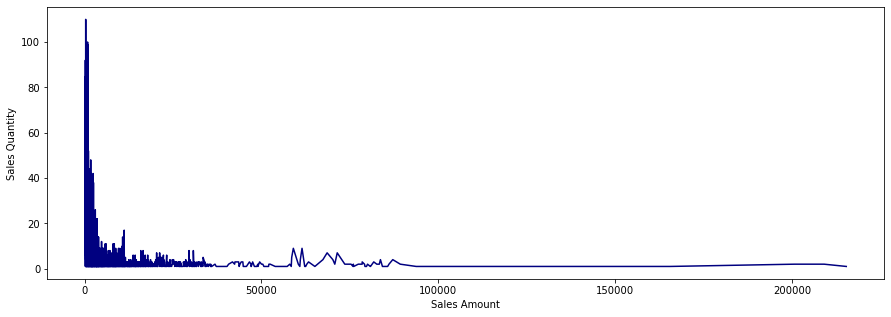

In [56]:
pd.pivot_table(index='Sales Amount',values='Sales Quantity',data=sales_data,aggfunc='count').plot(kind='line',color='navy',legend=None)
plt.ylabel('Sales Quantity')

### Sales quantity and sales amount are mildly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount.

Text(0, 0.5, 'Discount Amount')

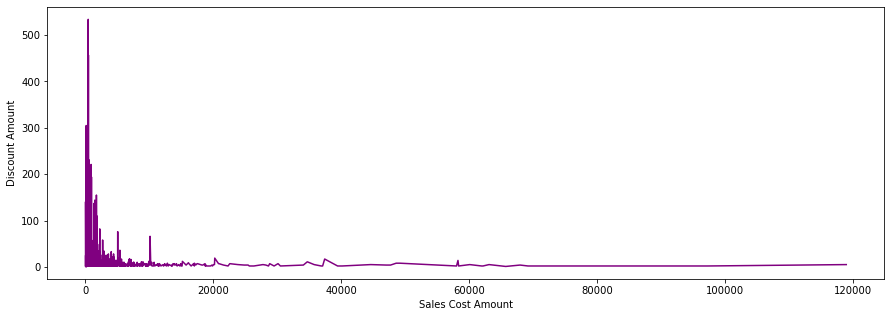

In [57]:
pd.pivot_table(index='Sales Cost Amount',values='Discount Amount',data=sales_data,aggfunc='count').plot(kind='line',color='purple',legend=None)
plt.ylabel('Discount Amount')

### Discount amount and sales cost amount are strongly positively correlated with maximum concentration of their values being in the region of 0-20000 sales cost amount.

Text(0, 0.5, 'Sales Amount')

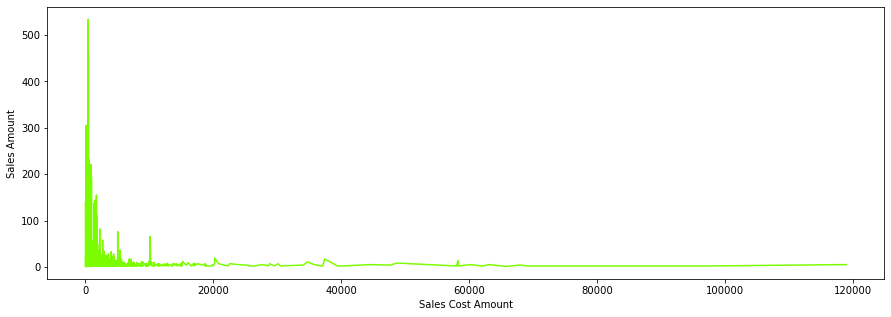

In [58]:
pd.pivot_table(index='Sales Cost Amount',values='Sales Amount',data=sales_data,aggfunc='count').plot(kind='line',color='lawngreen',legend=None)
plt.ylabel('Sales Amount')

### Sales amount and sales cost amount are strongly positively correlated with maximum concentration of their values being in the region of 0-20000 sales cost amount.

Text(0, 0.5, 'Sales Margin Amount')

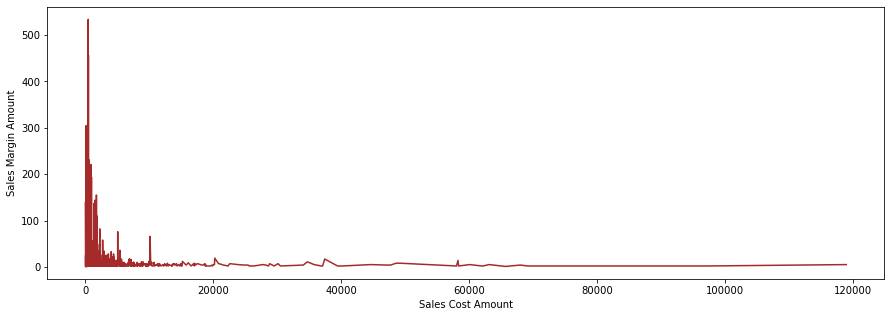

In [59]:
pd.pivot_table(index='Sales Cost Amount',values='Sales Margin Amount',data=sales_data,aggfunc='count').plot(kind='line',color='brown',legend=None)
plt.ylabel('Sales Margin Amount')

### Sales margin amount and sales cost amount are strongly positively correlated with maximum concentration of their values being in the region of 0-20000 sales cost amount.

Text(0, 0.5, 'Sales Amount based on list price')

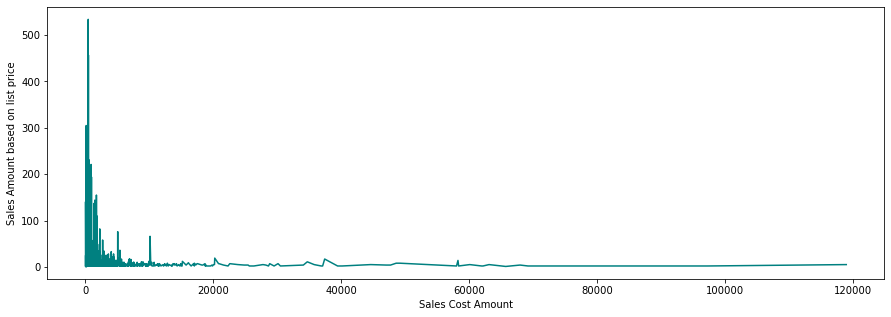

In [61]:
pd.pivot_table(index='Sales Cost Amount',values='Sales Amount Based on List Price',data=sales_data,aggfunc='count').plot(kind='line',color='teal',legend=None)
plt.ylabel('Sales Amount based on list price')

### Sales amount based on list price and sales cost amount are strongly positively correlated with maximum concentration of their values being in the region of 0-20000 sales cost amount.

Text(0, 0.5, 'Sales Quantity')

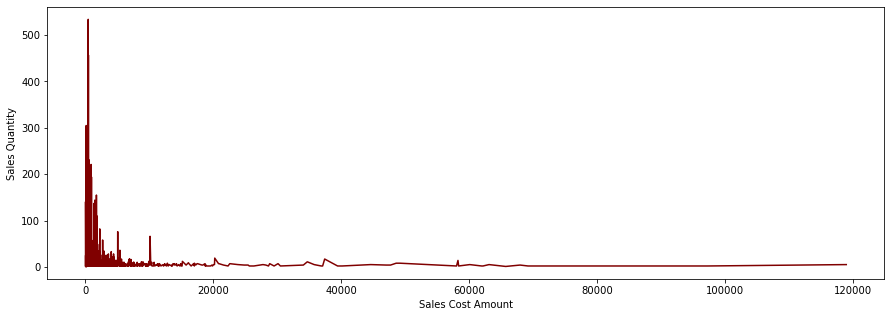

In [62]:
pd.pivot_table(index='Sales Cost Amount',values='Sales Quantity',data=sales_data,aggfunc='count').plot(kind='line',color='maroon',legend=None)
plt.ylabel('Sales Quantity')

### Sales quantity and sales cost amount are mildly positively correlated with maximum concentration of their values being in the region of 0-20000 sales cost amount.

Text(0, 0.5, 'List Price')

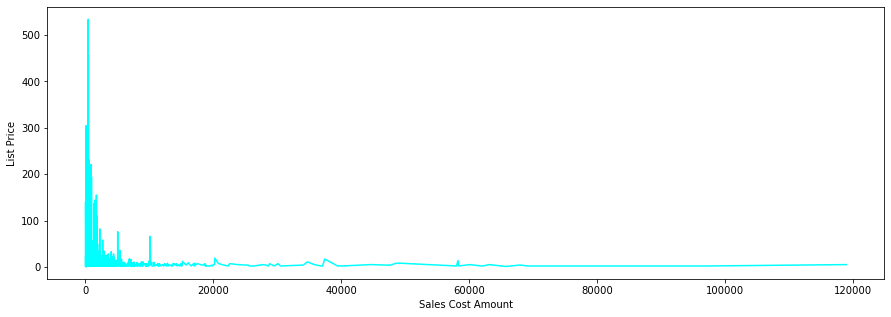

In [63]:
pd.pivot_table(index='Sales Cost Amount',values='List Price',data=sales_data,aggfunc='count').plot(kind='line',color='cyan',legend=None)
plt.ylabel('List Price')

### List price and sales cost amount are mildly positively correlated with maximum concentration of their values being in the region of 0-20000 sales cost amount.

Text(0, 0.5, 'Sales Amount based on list price')

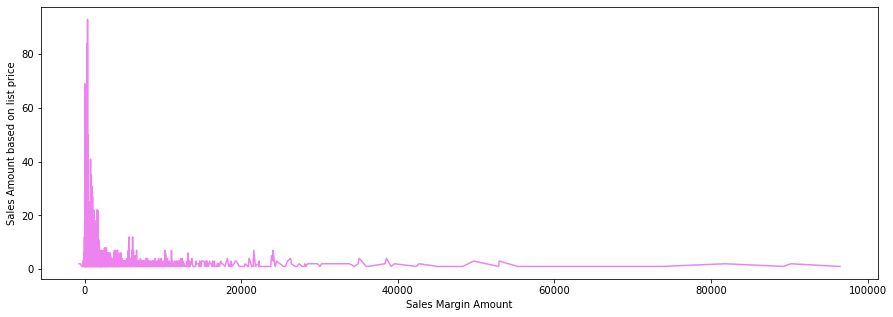

In [64]:
pd.pivot_table(index='Sales Margin Amount',values='Sales Amount Based on List Price',data=sales_data,aggfunc='count').plot(kind='line',color='violet',legend=None)
plt.ylabel('Sales Amount based on list price')

### Sales amount based on list price and sales margin amount are strongly positively correlated with maximum concentration of their values being in the region of 0-20000 sales margin amount.

Text(0, 0.5, 'Discount Amount')

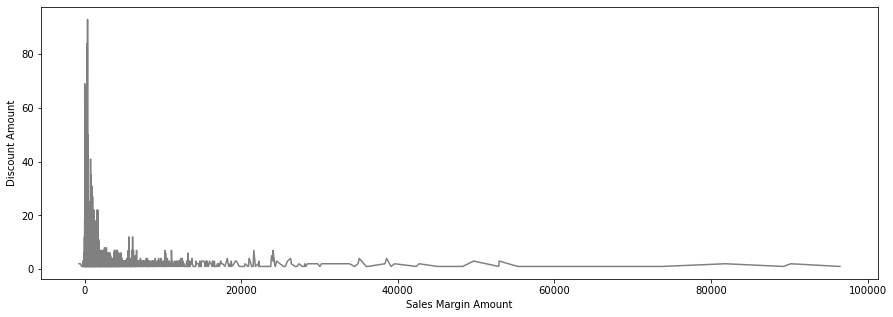

In [65]:
pd.pivot_table(index='Sales Margin Amount',values='Discount Amount',data=sales_data,aggfunc='count').plot(kind='line',color='grey',legend=None)
plt.ylabel('Discount Amount')

### Discount amount and sales margin amount based on list price are mildly positively correlated with maximum concentration of their values being in the region of 0-20000 sales margin amount.

Text(0, 0.5, 'Sales Quantity')

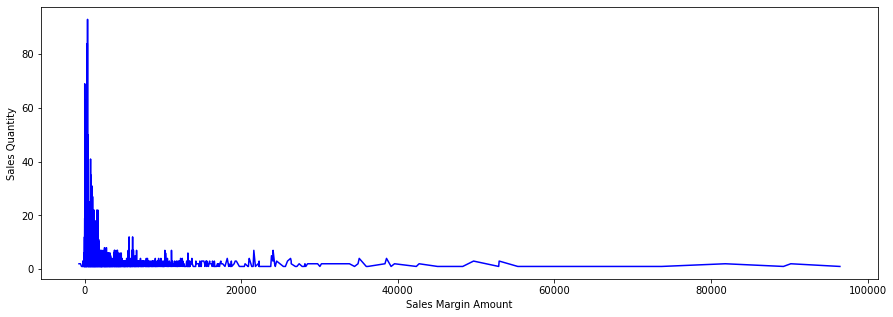

In [66]:
pd.pivot_table(index='Sales Margin Amount',values='Sales Quantity',data=sales_data,aggfunc='count').plot(kind='line',color='blue',legend=None)
plt.ylabel('Sales Quantity')

### Sales quantity and sales margin amount are mildly positively correlated with maximum concentration of their values being in the region of 0-20000 sales margin amount.

Text(0, 0.5, 'List Price')

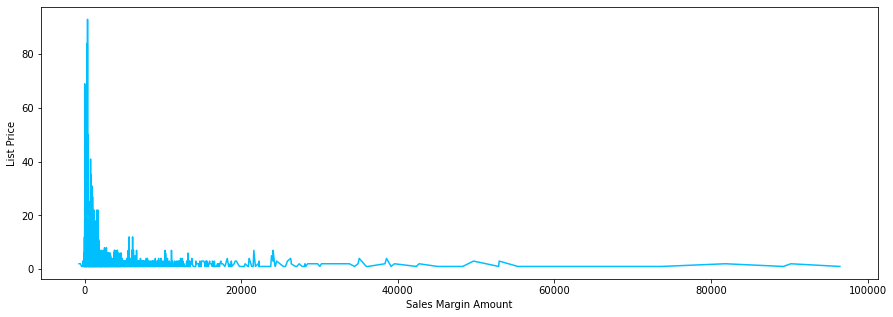

In [67]:
pd.pivot_table(index='Sales Margin Amount',values='List Price',data=sales_data,aggfunc='count').plot(kind='line',color='deepskyblue',legend=None)
plt.ylabel('List Price')

### List price and sales margin amount are weakly positively correlated with maximum concentration of their values being in the region of 0-20000 sales margin amount.

Text(0, 0.5, 'Sales Price')

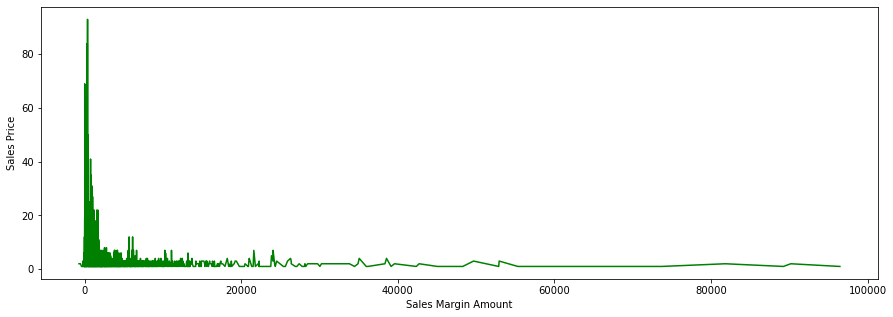

In [68]:
pd.pivot_table(index='Sales Margin Amount',values='Sales Price',data=sales_data,aggfunc='count').plot(kind='line',color='green',legend=None)
plt.ylabel('Sales Price')

### Sales price and sales margin amount are weakly positively correlated with maximum concentration of their values being in the region of 0-20000 sales margin amount.

Text(0, 0.5, 'Discount Amount')

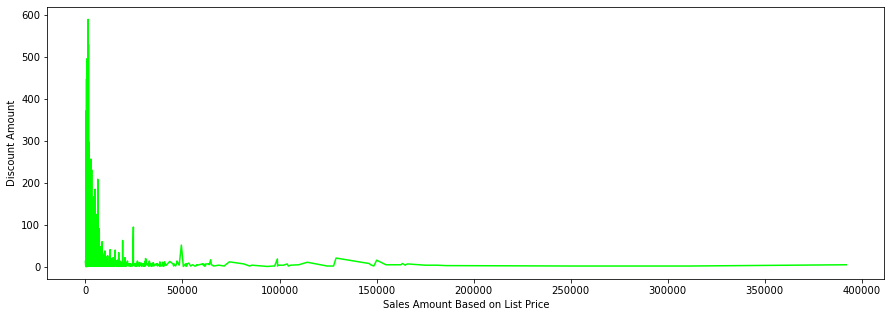

In [73]:
pd.pivot_table(index='Sales Amount Based on List Price',values='Discount Amount',data=sales_data,aggfunc='count').plot(kind='line',color='lime',legend=None)
plt.ylabel('Discount Amount')

### Discount amount and sales amount based on list price are mildly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount based on list price.

Text(0, 0.5, 'Sales Quantity')

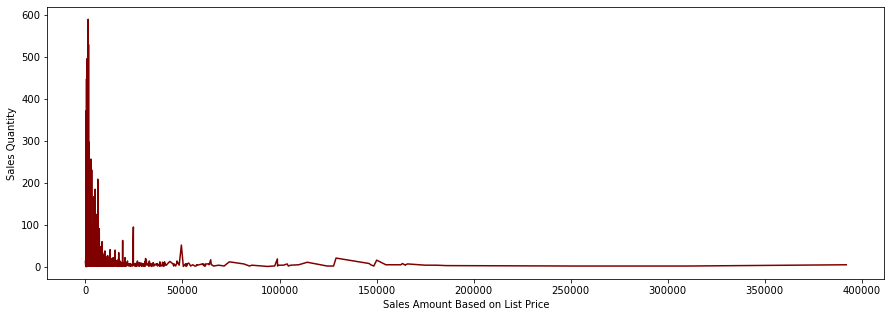

In [70]:
pd.pivot_table(index='Sales Amount Based on List Price',values='Sales Quantity',data=sales_data,aggfunc='count').plot(kind='line',color='maroon',legend=None)
plt.ylabel('Sales Quantity')

### Sales quantity and sales amount based on list price seem to be mildly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount based on list price.

Text(0, 0.5, 'Sales Price')

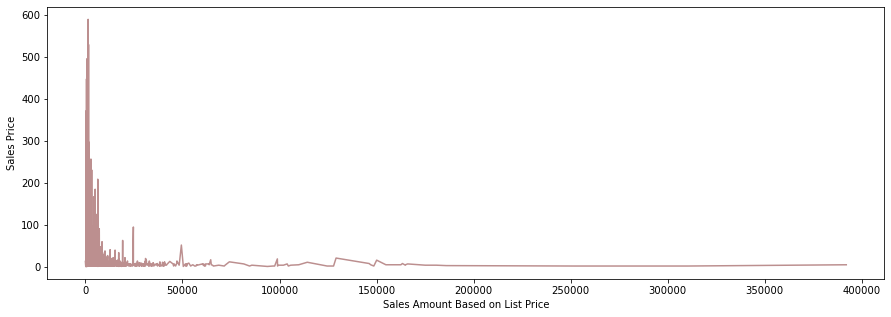

In [71]:
pd.pivot_table(index='Sales Amount Based on List Price',values='Sales Price',data=sales_data,aggfunc='count').plot(kind='line',color='rosybrown',legend=None)
plt.ylabel('Sales Price')

### Sales price and sales amount based on list price are weakly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount based on list price.

Text(0, 0.5, 'List Price')

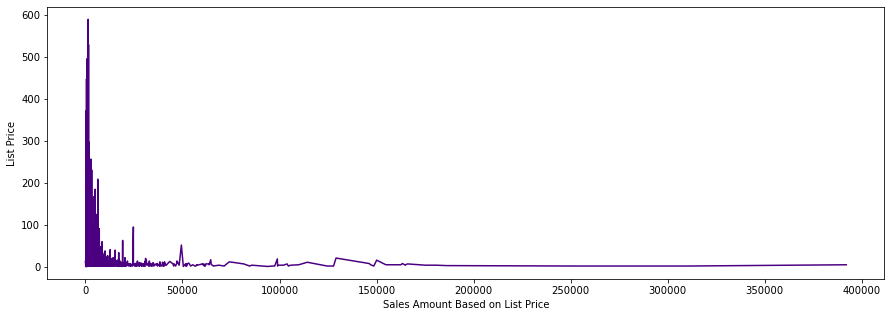

In [72]:
pd.pivot_table(index='Sales Amount Based on List Price',values='List Price',data=sales_data,aggfunc='count').plot(kind='line',color='indigo',legend=None)
plt.ylabel('List Price')

### List price and sales amount based on list price are weakly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount based on list price.

Text(0, 0.5, 'Sales Cost Amount')

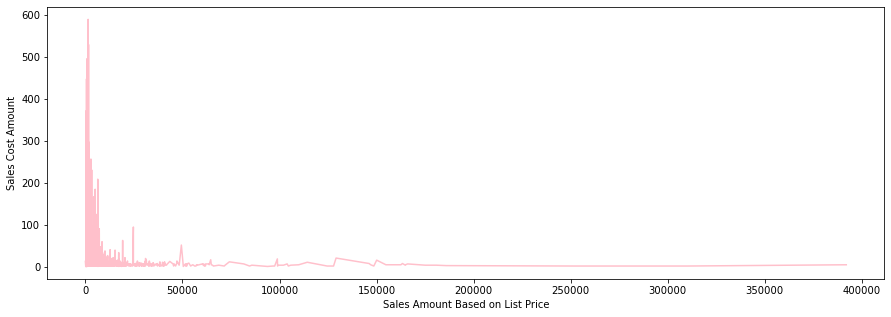

In [74]:
pd.pivot_table(index='Sales Amount Based on List Price',values='Sales Cost Amount',data=sales_data,aggfunc='count').plot(kind='line',color='pink',legend=None)
plt.ylabel('Sales Cost Amount')

### Sales cost amount and sales amount based on list price are strongly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount based on list price.

Text(0, 0.5, 'Sales Margin Amount')

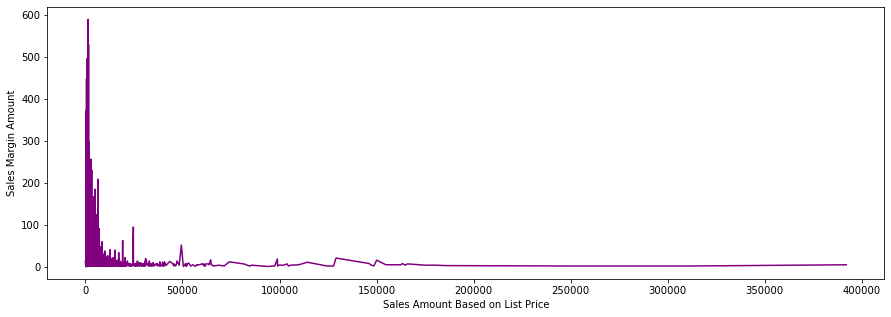

In [75]:
pd.pivot_table(index='Sales Amount Based on List Price',values='Sales Margin Amount',data=sales_data,aggfunc='count').plot(kind='line',color='purple',legend=None)
plt.ylabel('Sales Margin Amount')

### Sales margin amount and sales amount based on list price are strongly positively correlated with maximum concentration of their values being in the region of 0-50000 sales amount based on list price.

Text(0, 0.5, 'List Price')

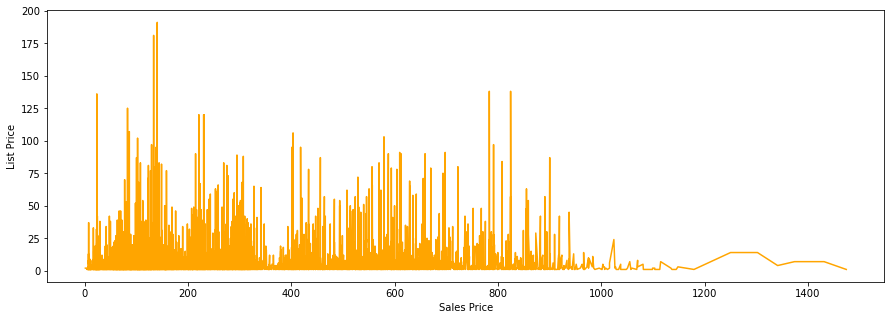

In [76]:
pd.pivot_table(index='Sales Price',values='List Price',data=sales_data,aggfunc='count').plot(kind='line',color='orange',legend=None)
plt.ylabel('List Price')

### Sales price and list price have a very strong positive correlation and the values of both these variables overlap and move together throughout their distribution indicating that there is a high level of dependency between both of them.

Text(0, 0.5, 'List Price')

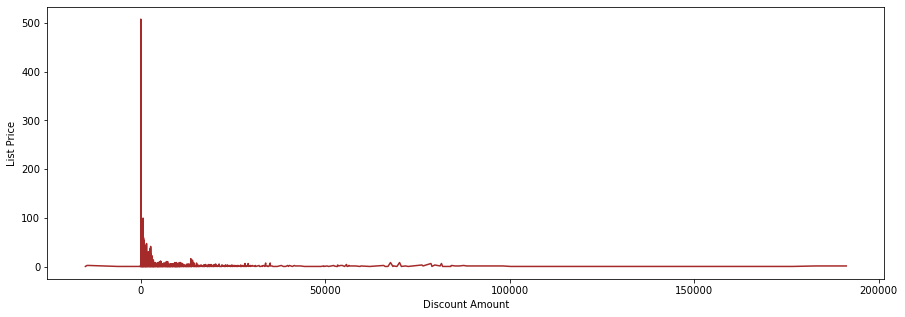

In [77]:
pd.pivot_table(index='Discount Amount',values='List Price',data=sales_data,aggfunc='count').plot(kind='line',color='brown',legend=None)
plt.ylabel('List Price')

### List price and discount amount are very weakly correlated i.e. they can be considered to be almost independent.

Text(0, 0.5, 'Sales Price')

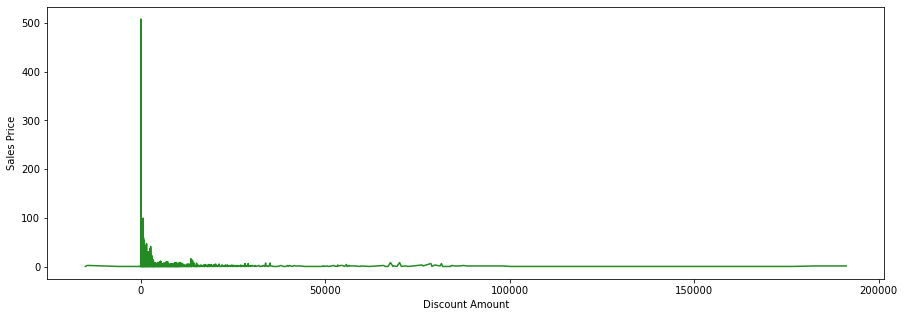

In [79]:
pd.pivot_table(index='Discount Amount',values='Sales Price',data=sales_data,aggfunc='count').plot(kind='line',color='forestgreen',legend=None)
plt.ylabel('Sales Price')

### Discount amount and sales price are mildly positively correlated with very high values of sales price for low values of discount amount.

In [80]:
np.correlate(sales_data['Sales Price'],sales_data['List Price'])

array([1.50159936e+10])

### Sales price and list price are very strongly positively correlated.

In [87]:
unit_of_measures = list(sales_data['U/M'].value_counts().index)
counts = list(sales_data['U/M'].value_counts().values)
colors = ['indigo','green','rosybrown']
explode = [0.4,0,0]

([<matplotlib.patches.Wedge at 0x2574a195250>,
 [Text(-1.039990025674432, 0.3583584050886683, 'EA'),
  Text(1.0265944084307739, -0.3950998868370754, 'SE'),
  Text(1.099304828737627, -0.039101067941126666, 'PR')])

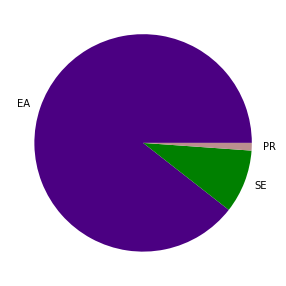

In [89]:
plt.pie(counts,labels=unit_of_measures,colors=colors)

### "EA" unit of measure has been used the most within all the sales while "PR" has been used the least.

Text(0.5, 1.0, 'Sales Price vs. List Price')

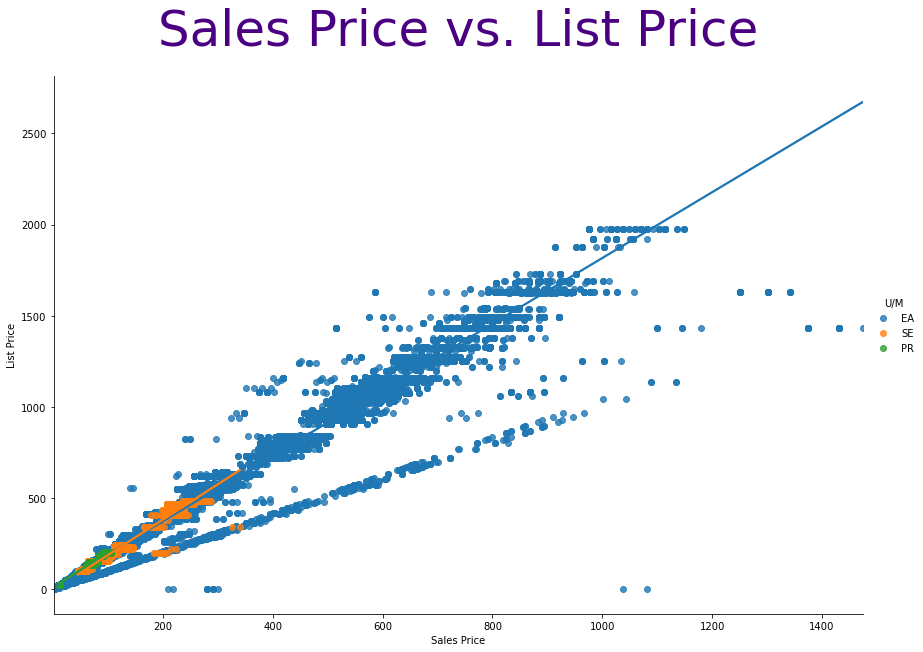

In [97]:
sns.lmplot(x='Sales Price',y='List Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Price vs. List Price',fontsize=50,color='indigo',pad=32)

### Sales price and list price are very strongly positively correlated with very less dispersion of values although there are a few outliers as well(belonging to "EA" unit of measure).

Text(0.5, 1.0, 'Sales Quantity vs. Sales Rep')

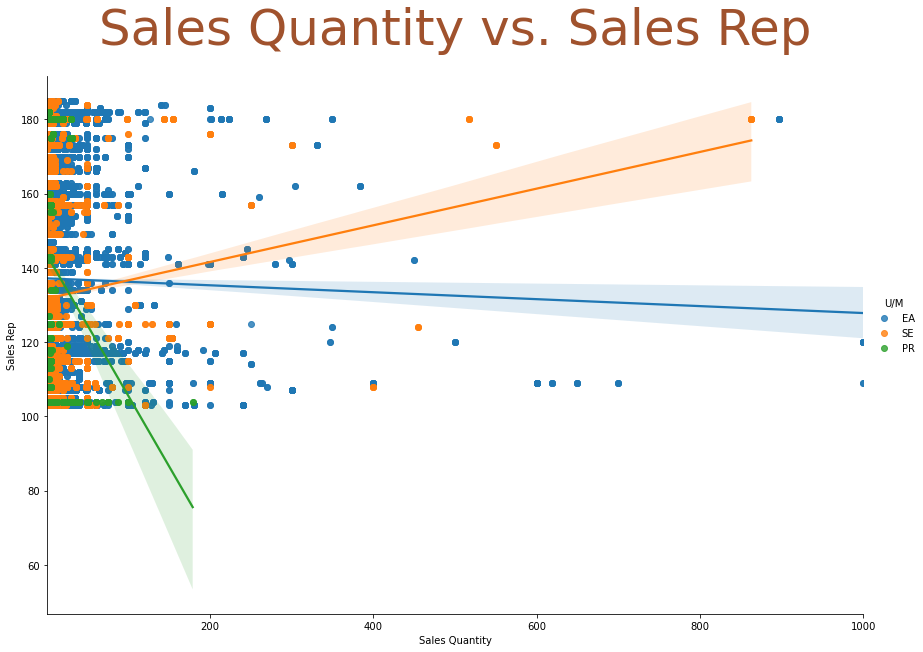

In [126]:
sns.lmplot(x='Sales Quantity',y='Sales Rep',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Quantity vs. Sales Rep',fontsize=50,color='sienna',pad=32)

### Sales quantity and sales rep are weakly correlated with a high dispersion, variation and scattering of values along with considerable number of outliers as well.

Text(0.5, 1.0, 'Sales Price vs. Sales Quantity')

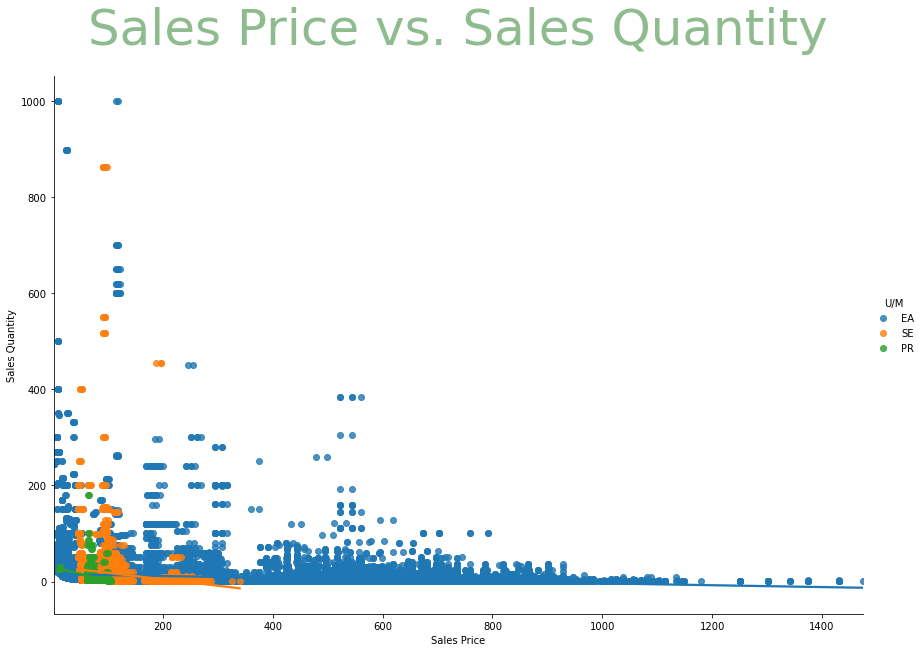

In [128]:
sns.lmplot(x='Sales Price',y='Sales Quantity',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Price vs. Sales Quantity',fontsize=50,color='darkseagreen',pad=32)

### Sales price and sales quantity are weakly negatively correlated with a very high dispersion, variation and scattering of values.

Text(0.5, 1.0, 'Sales Amount vs. Discount Amount')

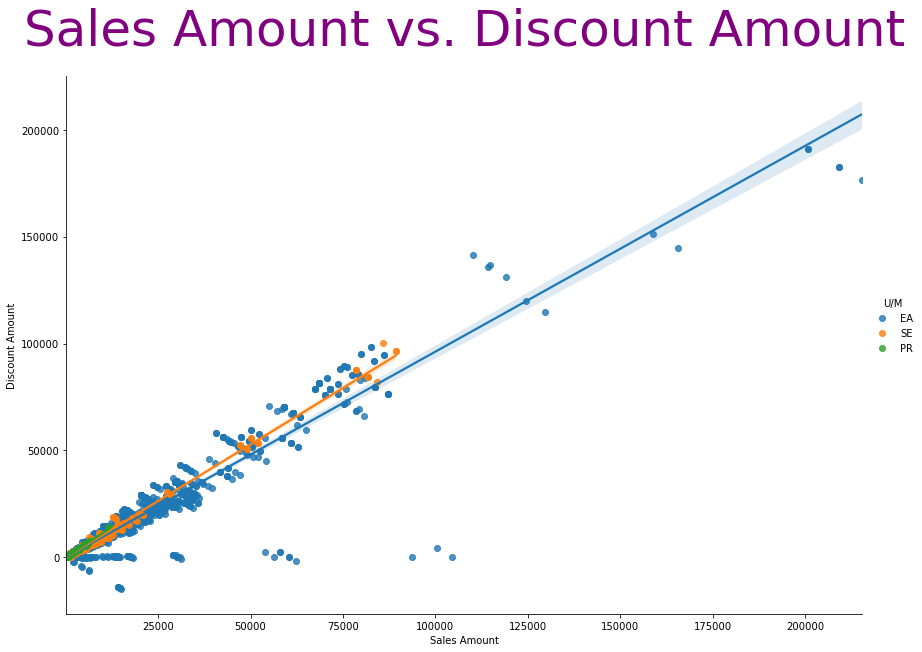

In [96]:
sns.lmplot(x='Sales Amount',y='Discount Amount',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Amount vs. Discount Amount',fontsize=50,color='purple',pad=32)

### Discount amount and sales amount are strongly positively correlated having sparingly limited dispersion,variation and scattering of values and there are a few outliers belonging to the "EA" unit of measure.

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Margin Amount')

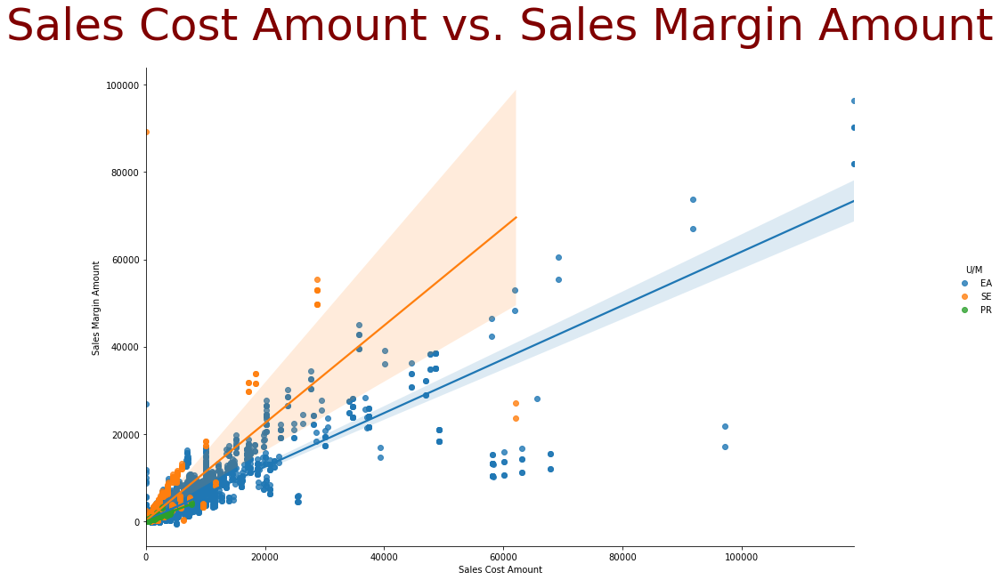

In [98]:
sns.lmplot(x='Sales Cost Amount',y='Sales Margin Amount',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Cost Amount vs. Sales Margin Amount',fontsize=50,color='maroon',pad=32)

### Sales margin amount and sales cost amount are strongly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Amount based on List Price')

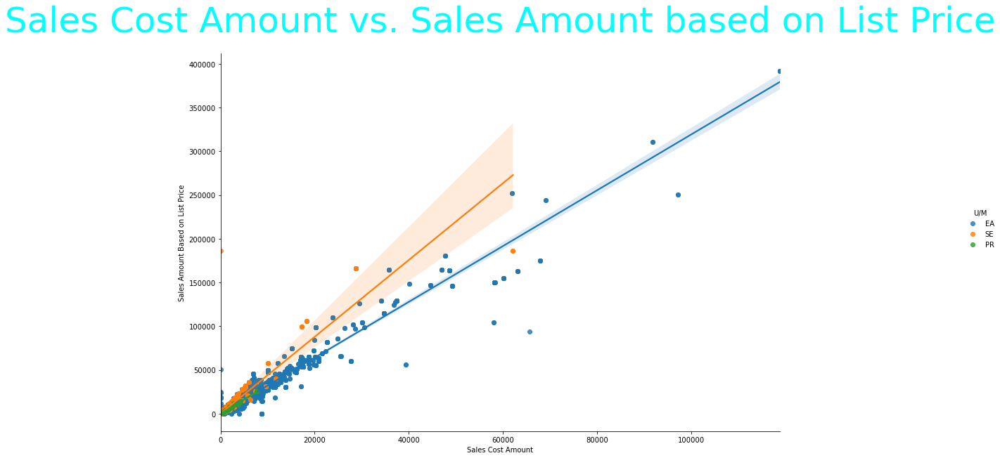

In [101]:
sns.lmplot(x='Sales Cost Amount',y='Sales Amount Based on List Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Cost Amount vs. Sales Amount based on List Price',fontsize=50,color='aqua',pad=32)

### Sales amount based on list price and sales cost amount are strongly positively correlated with no outliers and low dispersion.

Text(0.5, 1.0, 'Sales Margin Amount vs. Sales Amount based on List Price')

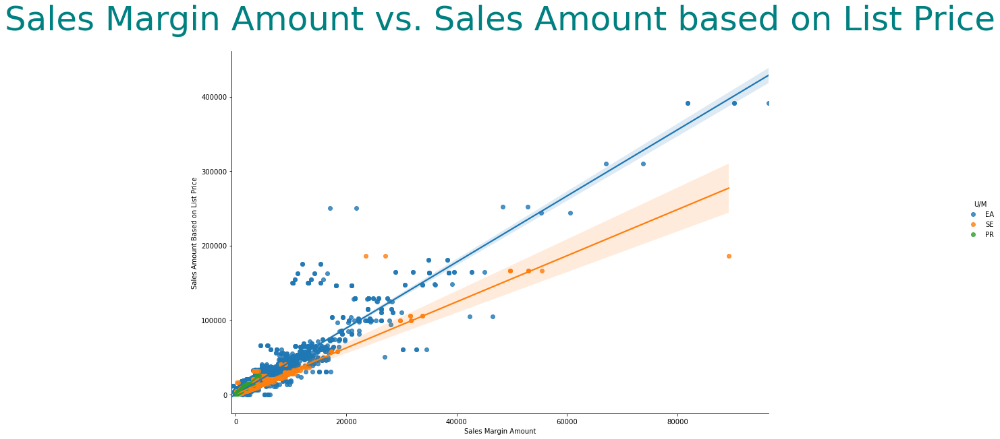

In [102]:
sns.lmplot(x='Sales Margin Amount',y='Sales Amount Based on List Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Margin Amount vs. Sales Amount based on List Price',fontsize=50,color='teal',pad=32)

### Sales amount based on list price and sales margin amount are strongly positively correlated with only one  outlier and low dispersion and variation. The outlier belongs to "SE" unit of measure and has a low value of sales amount based on list price for a very high value of sales margin amount.

Text(0.5, 1.0, 'Sales Margin Amount vs. Discount Amount')

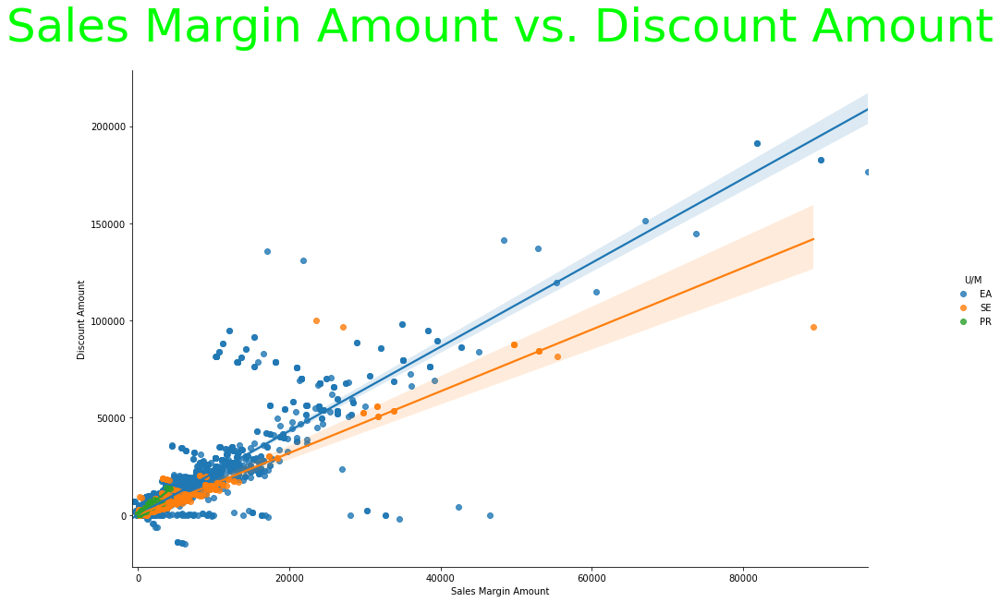

In [103]:
sns.lmplot(x='Sales Margin Amount',y='Discount Amount',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Margin Amount vs. Discount Amount',fontsize=50,color='lime',pad=32)

### Discount amount and sales margin amount are strongly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Sales Margin Amount vs. Sales Price')

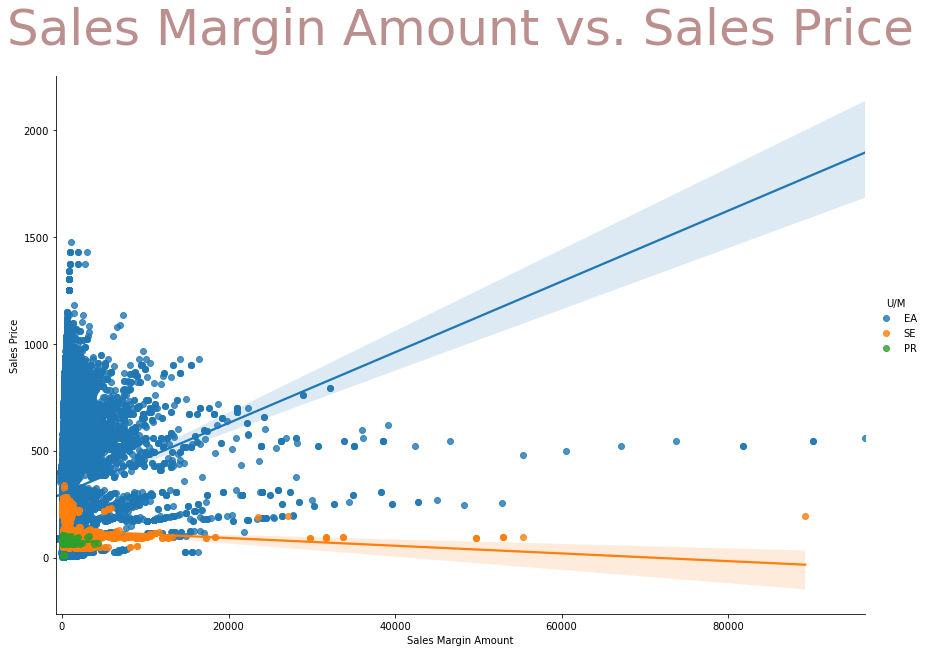

In [104]:
sns.lmplot(x='Sales Margin Amount',y='Sales Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Margin Amount vs. Sales Price',fontsize=50,color='rosybrown',pad=32)

### Sales price and sales margin amount are weakly positively correlated with high dispersion of values.

Text(0.5, 1.0, 'Sales Amount vs. Sales Amount based on List Price')

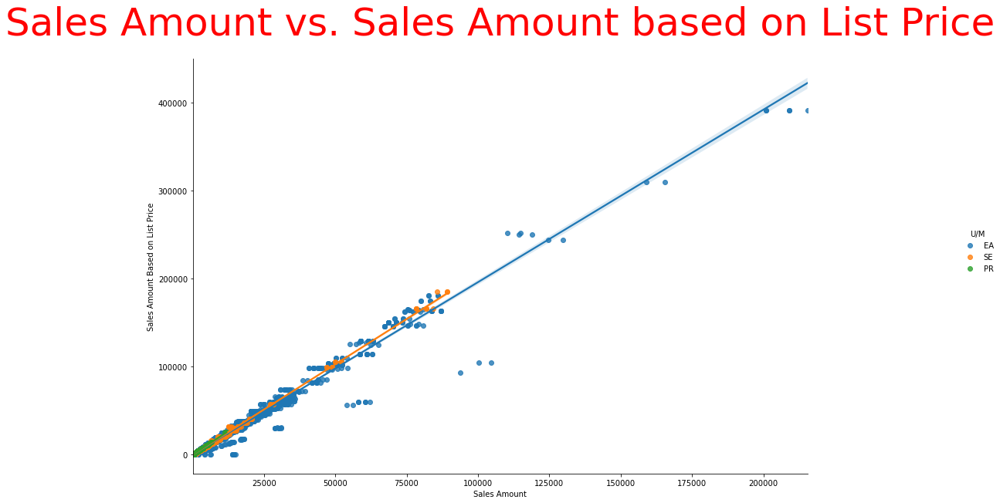

In [105]:
sns.lmplot(x='Sales Amount',y='Sales Amount Based on List Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Amount vs. Sales Amount based on List Price',fontsize=50,color='red',pad=32)

### Sales amount based on list price and sales amount are strongly positively correlated with no outliers and very low dispersion.

Text(0.5, 1.0, 'Sales Amount vs. Sales Cost Amount')

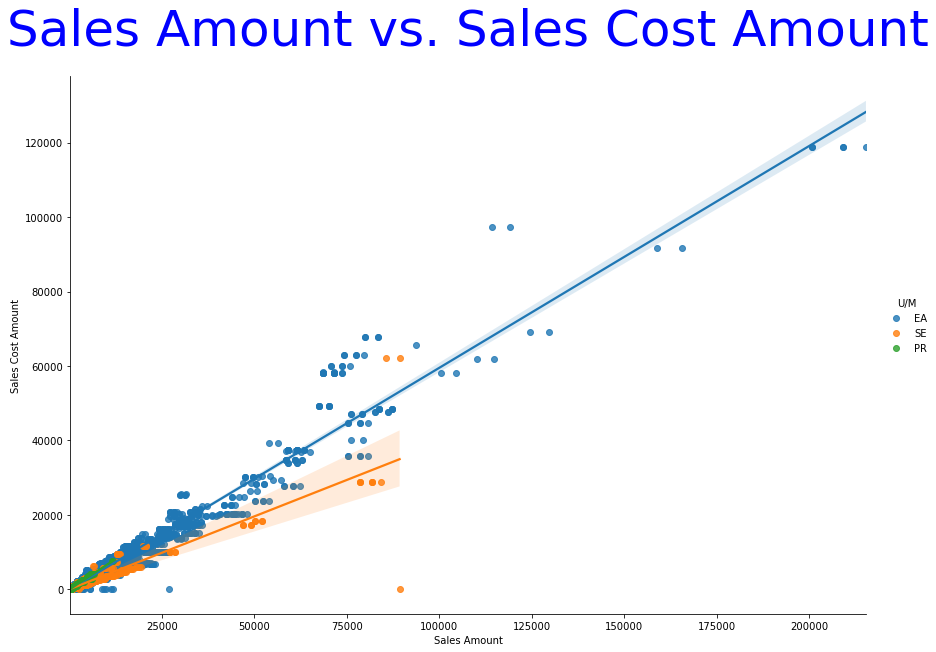

In [106]:
sns.lmplot(x='Sales Amount',y='Sales Cost Amount',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Amount vs. Sales Cost Amount',fontsize=50,color='blue',pad=32)

### Sales cost amount and sales amount are strongly positively correlated with no outliers and low dispersion.

Text(0.5, 1.0, 'Sales Amount vs. Sales Margin Amount')

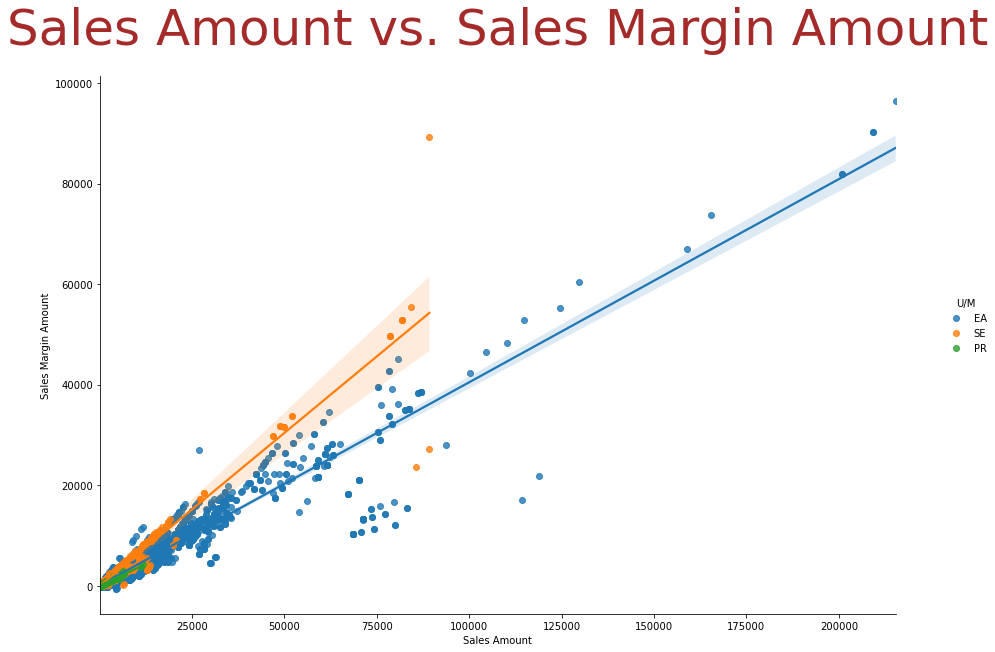

In [108]:
sns.lmplot(x='Sales Amount',y='Sales Margin Amount',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Amount vs. Sales Margin Amount',fontsize=50,color='brown',pad=32)

### Sales margin amount and sales amount are strongly positively correlated with low dispersion.

### It is worthy to note that there is an outlier in this data distribution and it belongs to "SE" unit of measure. There is a very high value of sales margin amount for a particular value of sales amount but there is only one such value. All other values seem to be closely correlated.

Text(0.5, 1.0, 'Sales Amount vs. Sales Price')

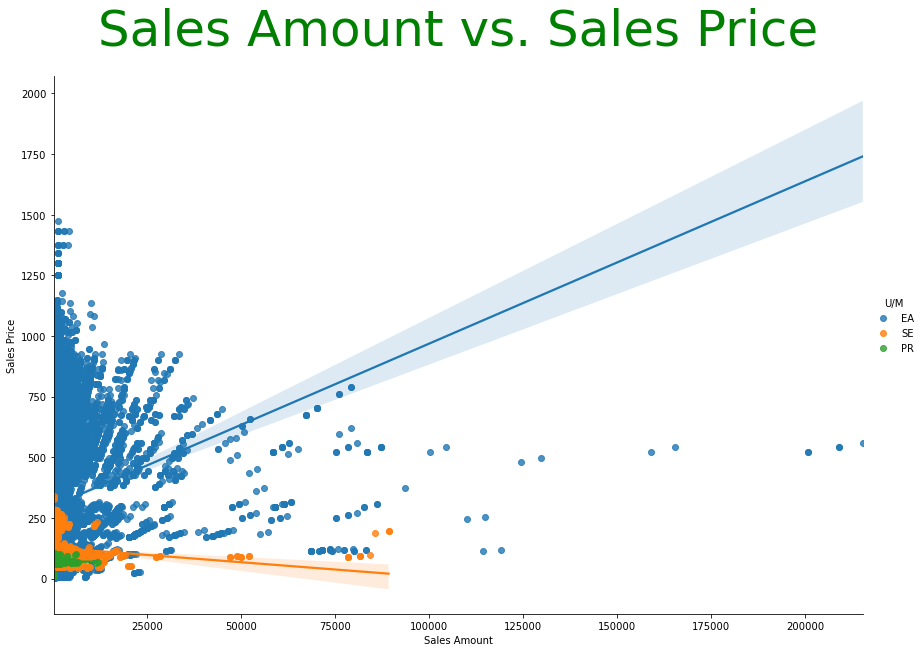

In [109]:
sns.lmplot(x='Sales Amount',y='Sales Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Amount vs. Sales Price',fontsize=50,color='green',pad=32)

### Sales price and sales amount are weakly positively correlated with high scattering, variation and dispersion of values.

Text(0.5, 1.0, 'Sales Amount vs. Sales Quantity')

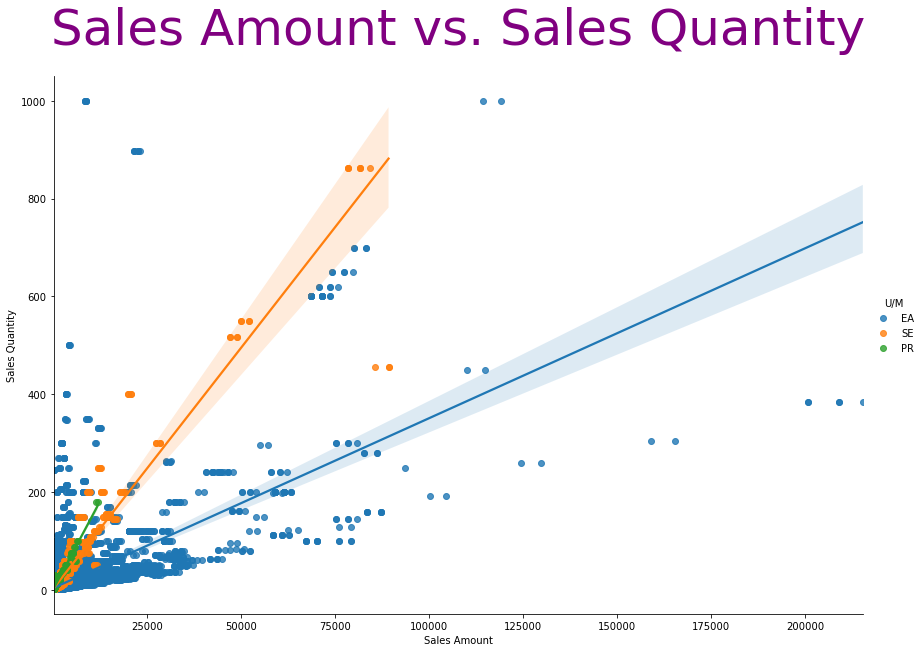

In [110]:
sns.lmplot(x='Sales Amount',y='Sales Quantity',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Amount vs. Sales Quantity',fontsize=50,color='purple',pad=32)

### Sales quantity and sales amount are mildly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Margin Amount')

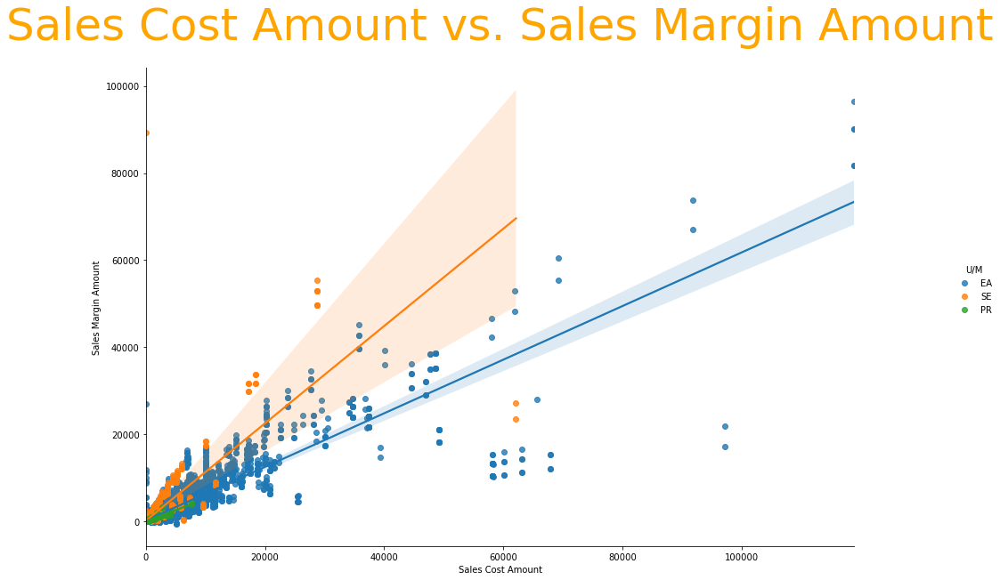

In [111]:
sns.lmplot(x='Sales Cost Amount',y='Sales Margin Amount',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Cost Amount vs. Sales Margin Amount',fontsize=50,color='orange',pad=32)

### Sales margin amount and sales cost amount are strongly positively correlated with no outliers and low dispersion.

Text(0.5, 1.0, 'Sales Cost Amount vs. Discount Amount')

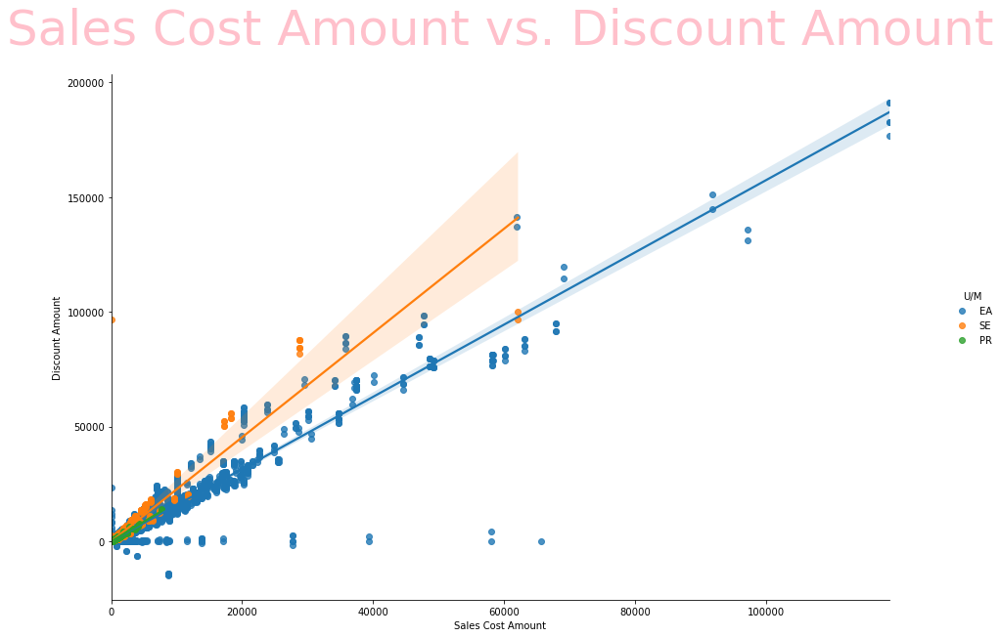

In [113]:
sns.lmplot(x='Sales Cost Amount',y='Discount Amount',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Cost Amount vs. Discount Amount',fontsize=50,color='pink',pad=32)

### Discount amount and sales cost amount are mildly positively correlated with limited dispersion and scattering of values.

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Price')

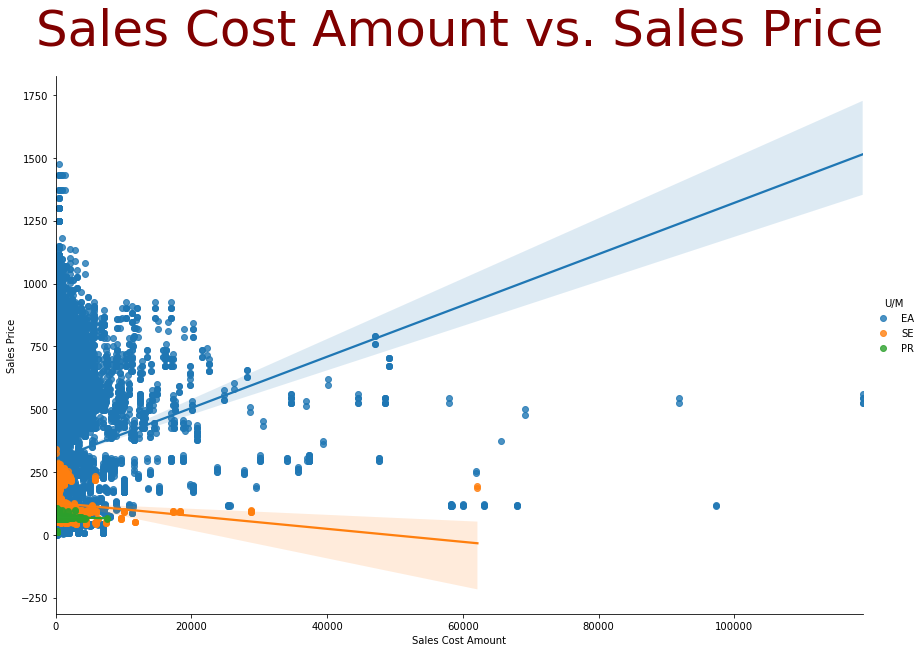

In [114]:
sns.lmplot(x='Sales Cost Amount',y='Sales Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Cost Amount vs. Sales Price',fontsize=50,color='maroon',pad=32)

### Sales price and sales cost amount are weakly positively correlated with high dispersion and variability of values.

Text(0.5, 1.0, 'Discount Amount vs. Sales Amount based on List Price')

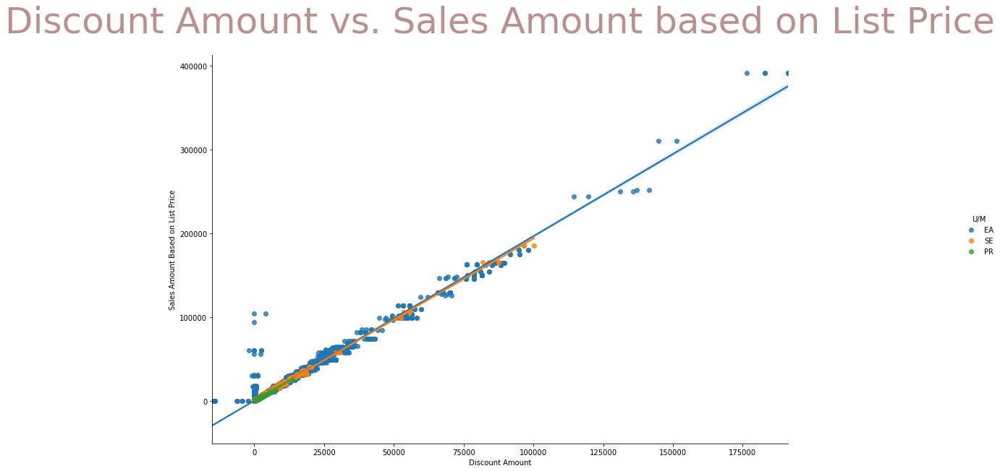

In [115]:
sns.lmplot(x='Discount Amount',y='Sales Amount Based on List Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Discount Amount vs. Sales Amount based on List Price',fontsize=50,color='rosybrown',pad=32)

### Discount amount and sales amount based on list price are very strongly positively correlated due to high extent of overlapping of values of both these variables. 

Text(0.5, 1.0, 'Sales Quantity vs. Discount Amount')

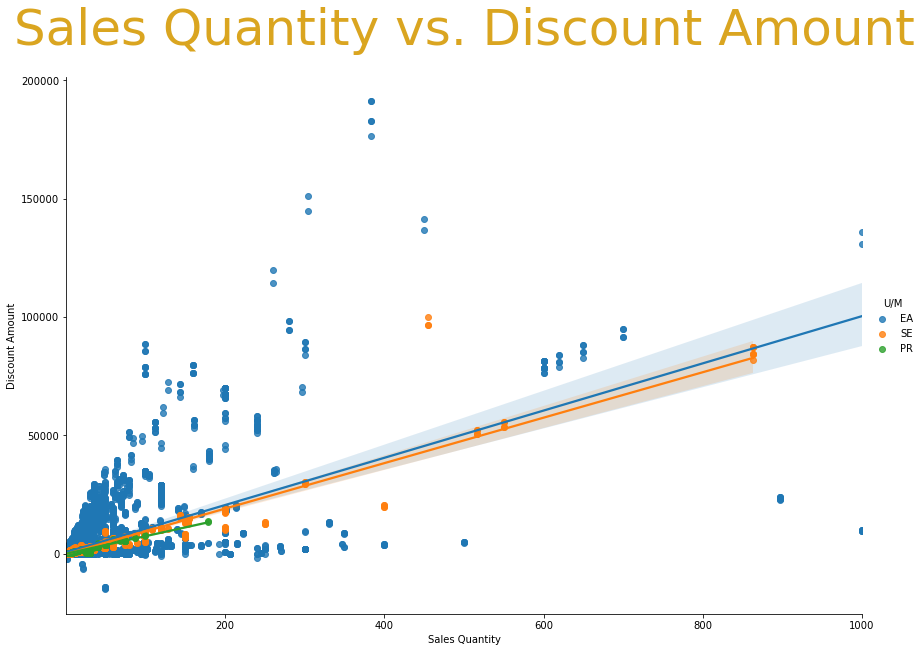

In [117]:
sns.lmplot(x='Sales Quantity',y='Discount Amount',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Quantity vs. Discount Amount',fontsize=50,color='goldenrod',pad=32)

### Discount amount and sales quantity are mildly positively correlated with limited scattering of values.

Text(0.5, 1.0, 'Sales Cost Amount vs. Sales Quantity')

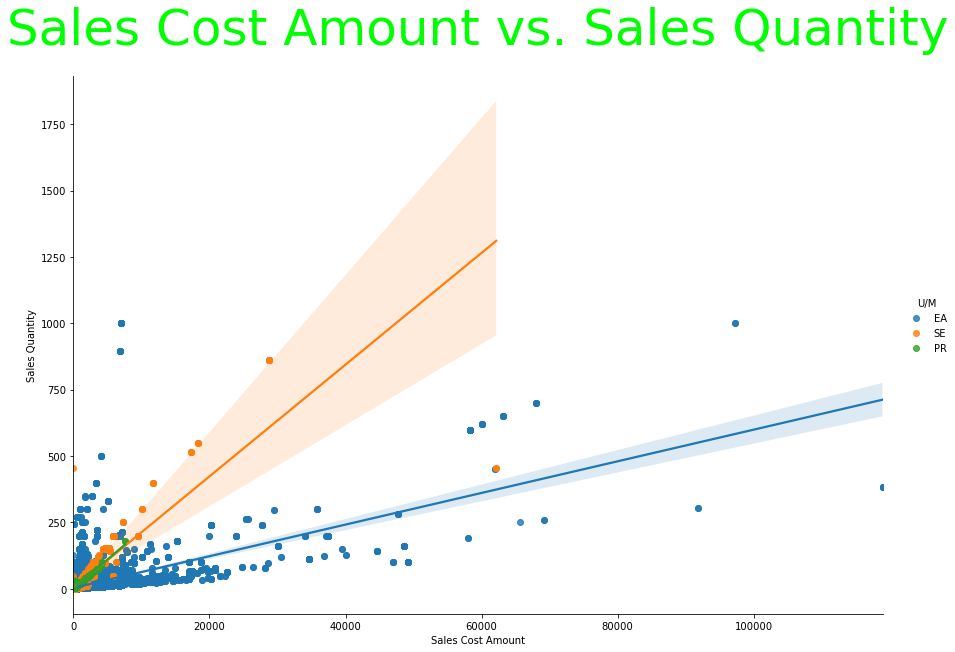

In [118]:
sns.lmplot(x='Sales Cost Amount',y='Sales Quantity',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Cost Amount vs. Sales Quantity',fontsize=50,color='lime',pad=32)

### Sales quantity and sales cost amount are mildly positively correlated with limited scattering of values.

Text(0.5, 1.0, 'Sales Margin Amount vs. Sales Quantity')

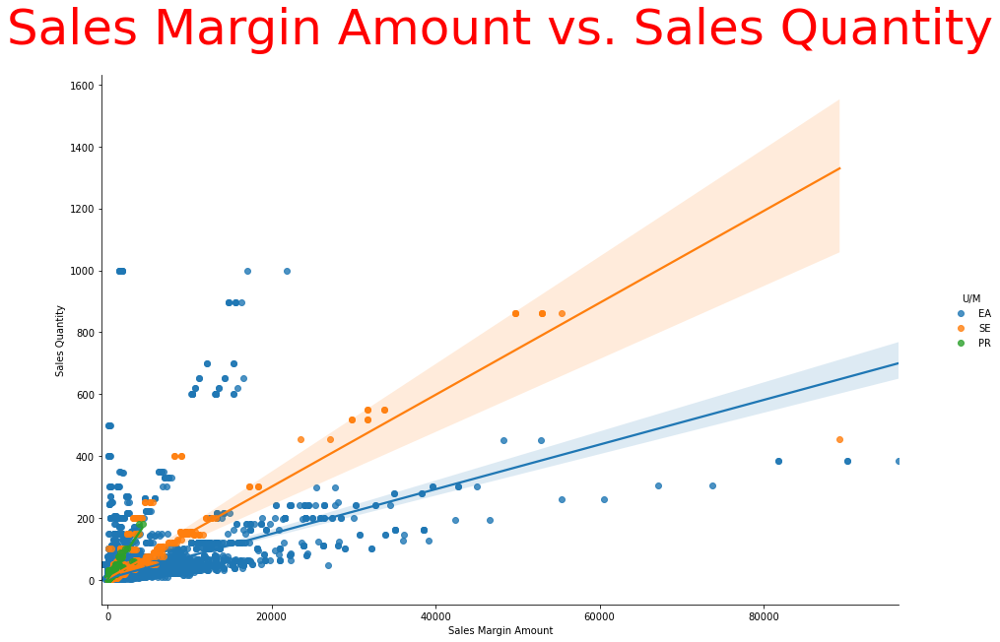

In [119]:
sns.lmplot(x='Sales Margin Amount',y='Sales Quantity',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Margin Amount vs. Sales Quantity',fontsize=50,color='red',pad=32)

### Sales quantity and sales margin amount are mildly positively correlated with limited dispersion of data.

Text(0.5, 1.0, 'Discount Amount vs. Sales Price')

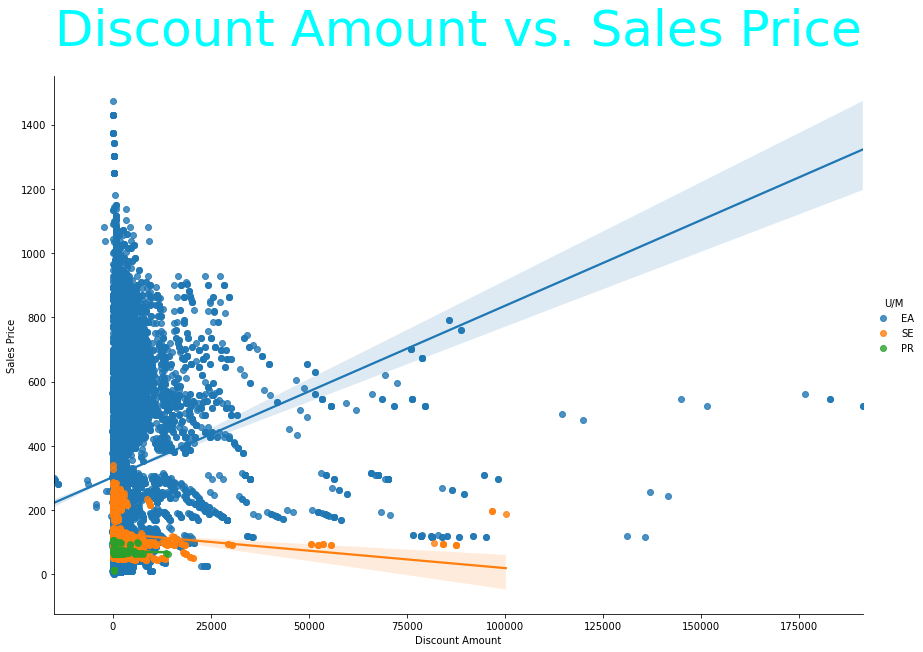

In [120]:
sns.lmplot(x='Discount Amount',y='Sales Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Discount Amount vs. Sales Price',fontsize=50,color='cyan',pad=32)

### Sales price and discount amount are weakly positively correlated due to high dispersion and scattering of values.

Text(0.5, 1.0, 'Sales Price vs. Sales Amount based on List Price')

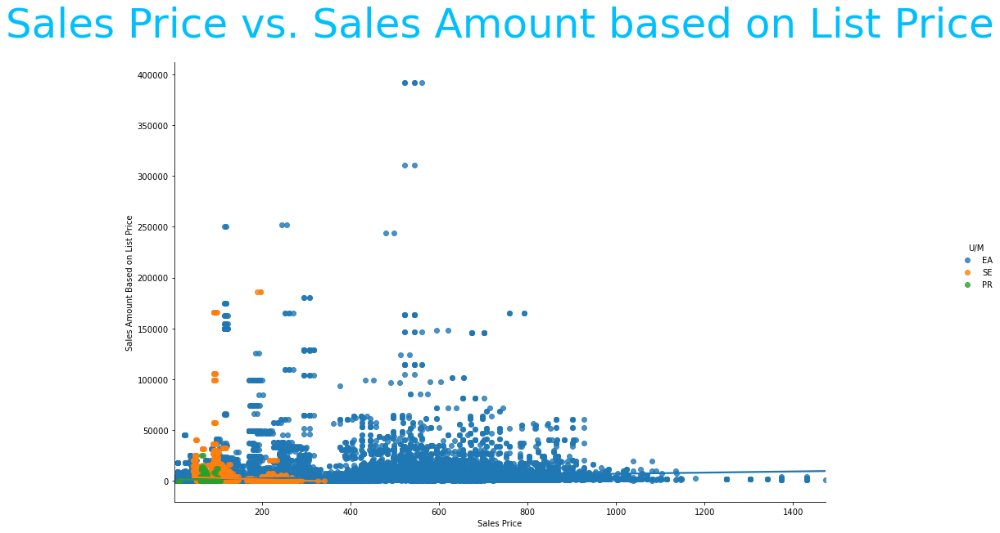

In [121]:
sns.lmplot(x='Sales Price',y='Sales Amount Based on List Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Price vs. Sales Amount based on List Price',fontsize=50,color='deepskyblue',pad=32)

### Sales price and sales amount based on list price are weakly positively correlated due to high dispersion and scattering of values.

Text(0.5, 1.0, 'Sales Cost Amount vs. List Price')

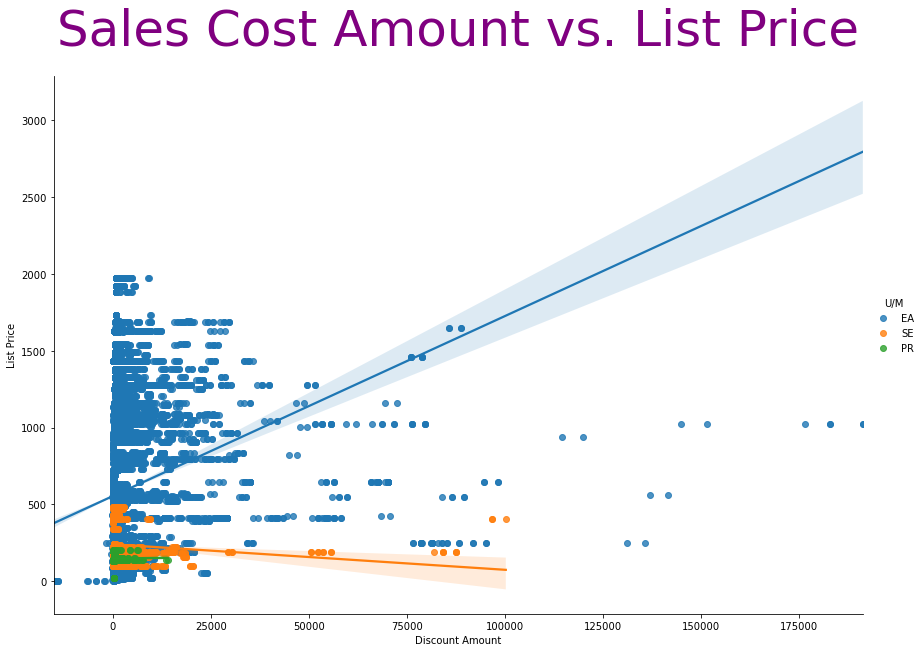

In [122]:
sns.lmplot(x='Discount Amount',y='List Price',data=sales_data,hue='U/M',height=8,aspect=1.5)
plt.title('Sales Cost Amount vs. List Price',fontsize=50,color='purple',pad=32)

### Discount amount and list price are weakly positively correlated due to high dispersion of values.

# Multivariate Analysis

In [123]:
sales_data.mean()

<ipython-input-123-61a054067224>:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  sales_data.mean()
<ipython-input-123-61a054067224>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sales_data.mean()


CustKey                             1.001758e+07
Discount Amount                     1.526396e+03
Invoice Number                      2.164075e+05
Line Number                         2.458875e+04
List Price                          5.362620e+02
Sales Amount                        1.655777e+03
Sales Amount Based on List Price    3.182173e+03
Sales Cost Amount                   9.259336e+02
Sales Margin Amount                 7.298434e+02
Sales Price                         2.903134e+02
Sales Quantity                      9.841472e+00
Sales Rep                           1.366931e+02
dtype: float64

In [124]:
sales_data.std()

<ipython-input-124-297292f0cc87>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sales_data.std()


CustKey                                             7231.012203
DateKey                             365 days 16:51:51.494420088
Discount Amount                                     5327.696464
Invoice Date                        365 days 16:51:51.494420088
Invoice Number                                     95002.543962
Line Number                                        32477.174741
List Price                                           446.072796
Promised Delivery Date              379 days 12:09:57.896643244
Sales Amount                                        5309.497134
Sales Amount Based on List Price                   10546.977037
Sales Cost Amount                                   3169.623938
Sales Margin Amount                                 2328.875603
Sales Price                                           244.34756
Sales Quantity                                        34.132815
Sales Rep                                              26.47562
dtype: object

In [125]:
sales_data.var()

<ipython-input-125-a9c25fe632f2>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sales_data.var()


CustKey                             5.228754e+07
Discount Amount                     2.838435e+07
Invoice Number                      9.025483e+09
Line Number                         1.054767e+09
List Price                          1.989809e+05
Sales Amount                        2.819076e+07
Sales Amount Based on List Price    1.112387e+08
Sales Cost Amount                   1.004652e+07
Sales Margin Amount                 5.423662e+06
Sales Price                         5.970573e+04
Sales Quantity                      1.165049e+03
Sales Rep                           7.009585e+02
dtype: float64

In [126]:
sales_data.median()

<ipython-input-126-f7c3cef8b214>:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  sales_data.median()
<ipython-input-126-f7c3cef8b214>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sales_data.median()


CustKey                             10019400.00
Discount Amount                          455.90
Invoice Number                        222954.00
Line Number                            13000.00
List Price                               378.29
Sales Amount                             533.64
Sales Amount Based on List Price         983.44
Sales Cost Amount                        295.24
Sales Margin Amount                      237.94
Sales Price                              202.91
Sales Quantity                             3.00
Sales Rep                                130.00
dtype: float64

In [128]:
sales_data.count()

CustKey                             56993
DateKey                             56993
Discount Amount                     56993
Invoice Date                        56993
Invoice Number                      56993
Item Class                          56993
Item Number                         56993
Item                                56993
Line Number                         56993
List Price                          56993
Promised Delivery Date              56993
Sales Amount                        56993
Sales Amount Based on List Price    56993
Sales Cost Amount                   56993
Sales Margin Amount                 56993
Sales Price                         56993
Sales Quantity                      56993
Sales Rep                           56993
U/M                                 56993
dtype: int64

In [129]:
sales_data.max()

<ipython-input-129-eda833a60b4e>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sales_data.max()


CustKey                                           10027583
DateKey                                2019-12-31 00:00:00
Discount Amount                                191196.5532
Invoice Date                           2019-12-31 00:00:00
Invoice Number                                      332842
Item Class                                             PO1
Item                                Washington Mango Drink
Line Number                                         330000
List Price                                          1975.0
Promised Delivery Date                 2019-12-31 00:00:00
Sales Amount                                      215364.6
Sales Amount Based on List Price               391924.7232
Sales Cost Amount                                118903.53
Sales Margin Amount                               96461.07
Sales Price                                        1474.17
Sales Quantity                                        1000
Sales Rep                                              1

In [130]:
sales_data.min()

<ipython-input-130-e927a7a33074>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  sales_data.min()


CustKey                                          10000453
DateKey                               2017-01-01 00:00:00
Discount Amount                                 -15030.79
Invoice Date                          2017-01-01 00:00:00
Invoice Number                                     100034
Item Class                                            P01
Item                                American Beef Bologna
Line Number                                          1000
List Price                                            0.0
Promised Delivery Date                2008-12-15 00:00:00
Sales Amount                                       200.01
Sales Amount Based on List Price                      0.0
Sales Cost Amount                                     0.0
Sales Margin Amount                               -717.59
Sales Price                                      1.282816
Sales Quantity                                          1
Sales Rep                                             103
U/M           

In [133]:
def hinton(matrix, max_weight=None, ax=None):
    """Draw Hinton diagram for visualizing a weight matrix."""
    ax = ax if ax is not None else plt.gca()

    if not max_weight:
        max_weight = 2**np.ceil(np.log(np.abs(matrix).max())/np.log(2))

    ax.patch.set_facecolor('lightgray')
    ax.set_aspect('equal', 'box')
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())

    for (x, y), w in np.ndenumerate(matrix):
        color = 'red' if w > 0 else 'blue'
        size = np.sqrt(np.abs(w))
        rect = plt.Rectangle([x - size / 2, y - size / 2], size, size,
                             facecolor=color, edgecolor=color)
        ax.add_patch(rect)

    nticks = matrix.shape[0]
    ax.xaxis.tick_top()
    ax.set_xticks(range(nticks))
    ax.set_xticklabels(list(matrix.columns), rotation=90)
    ax.set_yticks(range(nticks))
    ax.set_yticklabels(matrix.columns)
    ax.grid(False)

    ax.autoscale_view()
    ax.invert_yaxis()


### Hinton Diagram

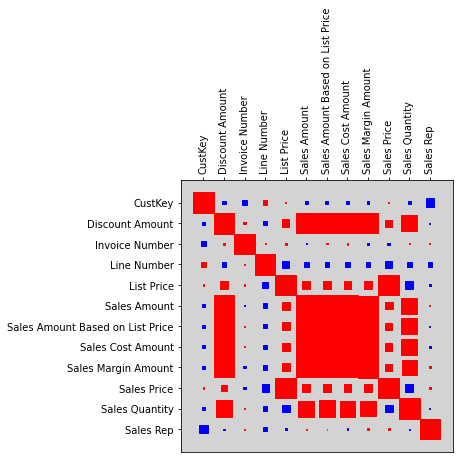

In [137]:
hinton(sales_data.corr(method='pearson'))

## Key Findings:

### 1. Discount amount is strongly positively correlated to sales amount, sales amount based on list price, sales cost amount and sales margin amount.
### 2. List price is very strongly positively correlated to sales price.
### 3. Sales quantity is mildly positively correlated to discount amount.
### 4. Discount amount is strongly correlated to sales quantity.
### 5. Sales quantity is mildly positively correlated to sales amount, sales amount based on list price, sales cost amount and sales margin amount.

## Matrix Scatterplot

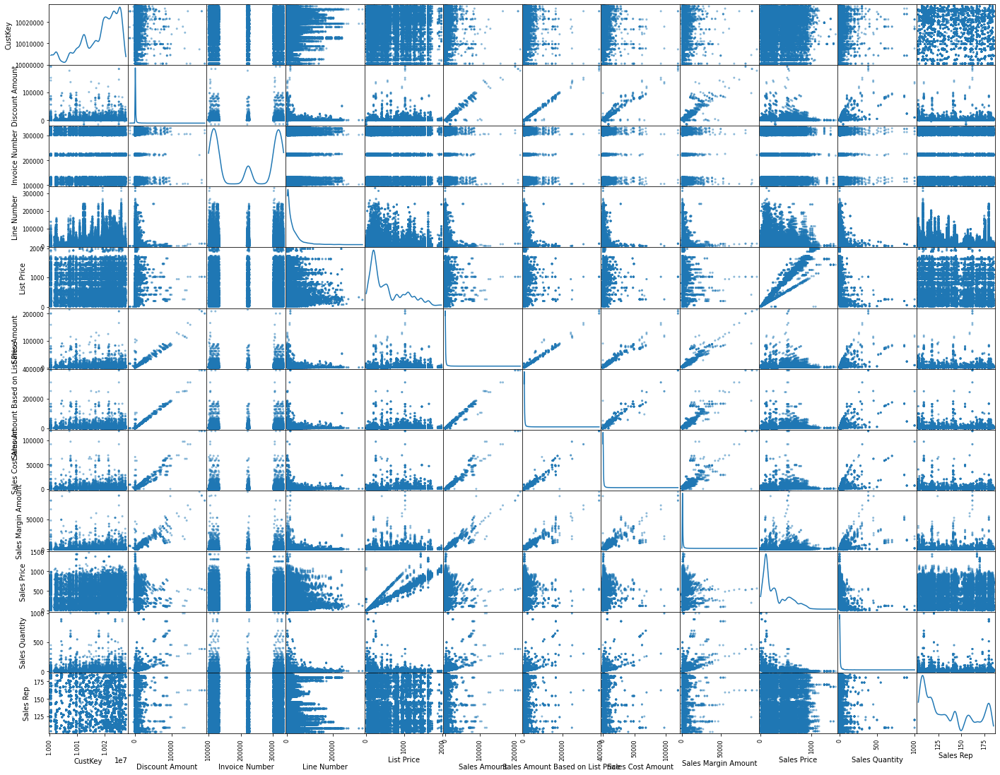

In [117]:
pd.plotting.scatter_matrix(sales_data.loc[:],diagonal="kde",figsize=(24,19))
plt.yticks(rotation=90)
plt.show()

### From the above matrix scatterplot, it is quite evident that sales price and list price are very strongly positively correlated.
### Sales amount, sales cost amount, sales margin amount and sales amount based on list price are strongly correlated.
### Discount amount is strongly positively correlated to sales amount, sales cost amount, sales margin amount and sales amount based on list price.
### Sales quantity is mildly positively correlated to sales amount, sales cost amount, sales margin amount and sales amount based on list price.
### Sales cost amount and sales margin amount are strongly positively correlated.
### Customer key and sales rep are weakly negatively correlated.
### Sales price and sales quantity are weakly negatively correlated.

## Profile Plot

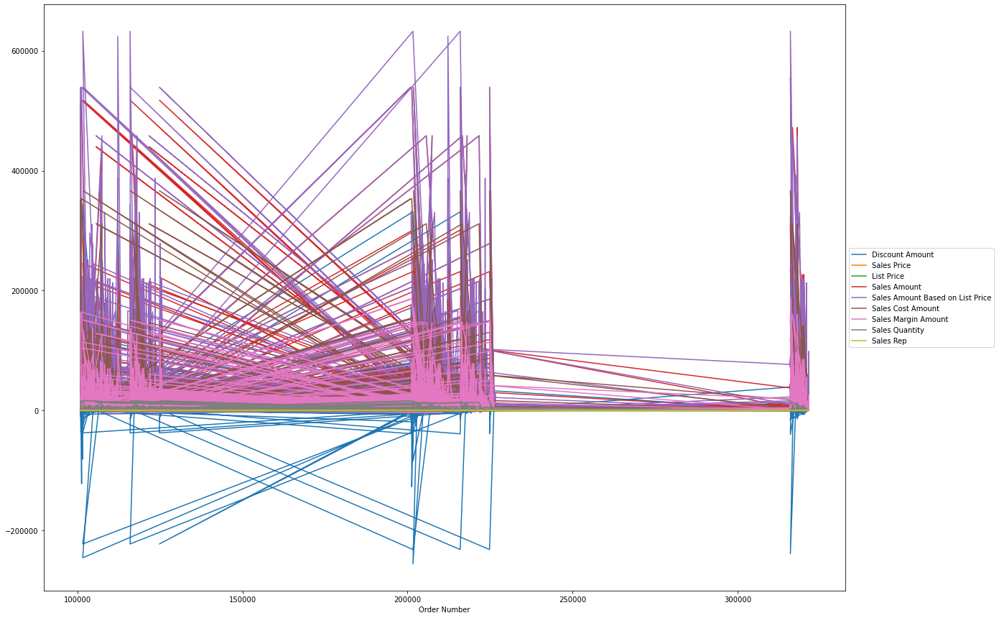

In [144]:
ax = data[["Discount Amount","Sales Price","List Price","Sales Amount","Sales Amount Based on List Price","Sales Cost Amount","Sales Margin Amount","Sales Quantity","Sales Rep"]].plot(figsize=(20,15))
ax.legend(loc='center left',bbox_to_anchor=(1,0.5))

### Sales Price and list price are strongly positively correlated.
### Sales amount, sales amount based on list price, sales cost amount and sales margin amount are quite closely positively correlated.
### Sales amount and discount amount are closely correlated.

### Sales quantity is mildly positively correlated to each of the variables sales amount, sales cost amount, sales margin amount and sales amount based on list price.

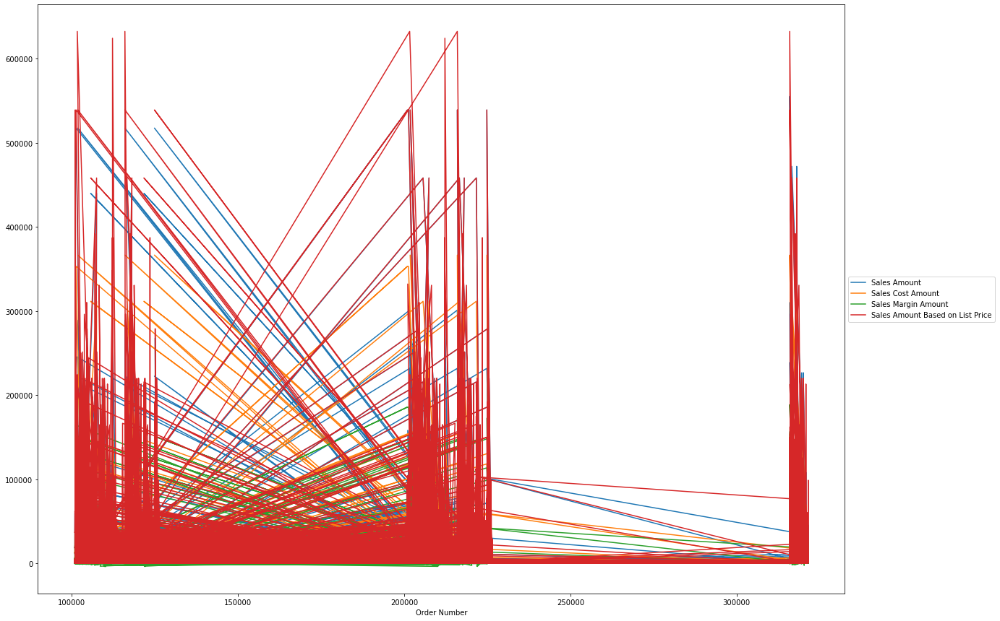

In [143]:
ax = data[["Sales Amount","Sales Cost Amount","Sales Margin Amount","Sales Amount Based on List Price"]].plot(figsize=(20,15))
ax.legend(loc='center left',bbox_to_anchor=(1,0.5))

### Sales amount, sales cost amount, sales margin amount and sales amount based on list price are very closely correlated as is depicted by the above profile plot having high density of overlapping values of each of these variables.

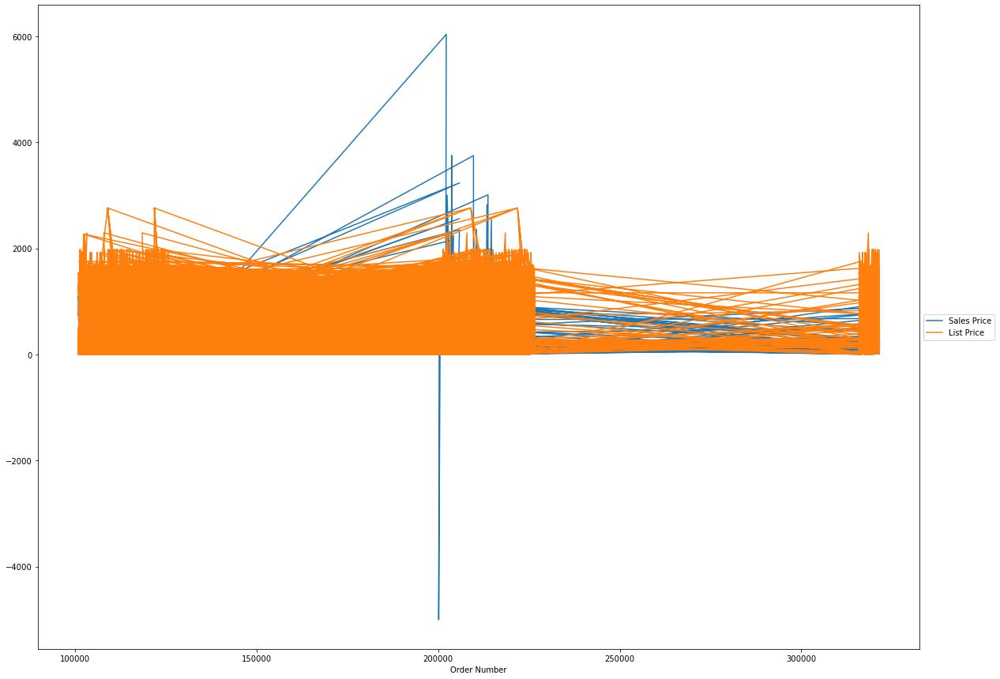

In [145]:
ax = data[["Sales Price","List Price"]].plot(figsize=(20,15))
ax.legend(loc='center left',bbox_to_anchor=(1,0.5))

### This suggests that sales price and list price are almost dependent upon each other i.e. there is a very high degree of correlation between them.

In [153]:
corr = stats.pearsonr(sales_data['Sales Price'],sales_data['List Price'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.9889158308328507
cor:	0.0


### Sales price and list price are very strongly positively correlated.

In [154]:
corr = stats.pearsonr(sales_data['Sales Amount'],sales_data['Sales Cost Amount'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.9749064472969713
cor:	0.0


### Sales amount and sales cost amount are strongly positively correlated.

In [155]:
corr = stats.pearsonr(sales_data['Sales Cost Amount'],sales_data['Sales Margin Amount'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.8616342786125298
cor:	0.0


### Sales cost amount and sales margin amount are strongly positively correlated.

In [156]:
corr = stats.pearsonr(sales_data['Sales Amount'],sales_data['List Price'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.1525572414741619
cor:	8.190124716041723e-294


### Sales amount and list price are very weakly positively correlated.

In [157]:
corr = stats.pearsonr(sales_data['Sales Amount'],sales_data['Sales Margin Amount'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.9529965098997693
cor:	0.0


### Sales amount and sales margin amount are strongly positively correlated.

In [158]:
corr = stats.pearsonr(sales_data['Sales Amount'],sales_data['Sales Amount Based on List Price'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.9914895674655465
cor:	0.0


### Sales amount and sales amount based on list price are very strongly positively correlated.

In [159]:
corr = stats.pearsonr(sales_data['Sales Price'],sales_data['Sales Amount'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.13992149450714794
cor:	4.8749162191337205e-247


### Sales amount and sales price are very weakly positively correlated.

In [160]:
corr = stats.pearsonr(sales_data['Sales Price'],sales_data['Discount Amount'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.11053307557370343
cor:	2.2440456928002885e-154


### Discount amount and sales price are very weakly positively correlated.

In [161]:
corr = stats.pearsonr(sales_data['Sales Amount'],sales_data['Discount Amount'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.9662188154077571
cor:	0.0


### Sales amount and discount amount are very strongly positively correlated.

In [162]:
corr = stats.pearsonr(sales_data['Discount Amount'],sales_data['Sales Cost Amount'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.949960393913091
cor:	0.0


### Discount amount and sales cost amount are strongly positively correlated.

In [163]:
corr = stats.pearsonr(sales_data['Discount Amount'],sales_data['Sales Margin Amount'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.9099321681680173
cor:	0.0


### Discount amount and sales margin amount are strongly positively correlated.

In [164]:
corr = stats.pearsonr(sales_data['Discount Amount'],sales_data['Sales Price'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.11053307557370343
cor:	2.2440456928002885e-154


### Discount amount and sales price are very weakly positively correlated.

In [165]:
corr = stats.pearsonr(sales_data['Discount Amount'],sales_data['Sales Amount Based on List Price'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.9915478585668073
cor:	0.0


### Discount amount and sales amount based on list price are quite closely and strongly positively correlated.

In [166]:
corr = stats.pearsonr(sales_data['Discount Amount'],sales_data['Sales Quantity'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.6325925313836643
cor:	0.0


### Discount amount and sales quantity are mildly positively correlated.

In [167]:
corr = stats.pearsonr(sales_data['Discount Amount'],sales_data['Sales Rep'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	-0.003669423746300883
cor:	0.3810339193572033


### Discount amount and sales rep are very weakly negatively correlated.

In [168]:
corr = stats.pearsonr(sales_data['Sales Amount'],sales_data['Sales Amount Based on List Price'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.9914895674655465
cor:	0.0


### Sales amount and sales amount based on list price are very strongly positively correlated.

In [169]:
corr = stats.pearsonr(sales_data['Sales Amount'],sales_data['Sales Quantity'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.6077957831395229
cor:	0.0


### Sales amount and sales quantity are mildly positively correlated.

In [170]:
corr = stats.pearsonr(sales_data['Sales Margin Amount'],sales_data['Sales Quantity'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.5670135671561913
cor:	0.0


### Sales margin amount and sales quantity are mildly positively correlated.

In [171]:
corr = stats.pearsonr(sales_data['Sales Cost Amount'],sales_data['Sales Quantity'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	0.6015180169650653
cor:	0.0


### Sales cost amount and sales quantity are mildly positively correlated.

In [172]:
corr = stats.pearsonr(sales_data['List Price'],sales_data['Sales Quantity'])
print("p-value:\t" + str(corr[0]))
print("cor:\t" + str(corr[1]))

p-value:	-0.13762704407825738
cor:	5.380755541511423e-239


### List price and sales quantity are very weakly negatively correlated.

In [108]:
def mosthighlycorrelated(mydataframe, numtoreport):
    # find the correlations
    cormatrix = mydataframe.corr()
    # set the correlations on the diagonal or lower triangle to zero,
    # so they will not be reported as the highest ones:
    cormatrix *= np.tri(*cormatrix.values.shape, k=-1).T
    # find the top n correlations
    cormatrix = cormatrix.stack()
    cormatrix = cormatrix.reindex(cormatrix.abs().sort_values(ascending=False).index).reset_index()
    # assign human-friendly names
    cormatrix.columns = ["FirstVariable", "SecondVariable", "Correlation"]
    return cormatrix.head(numtoreport)

In [111]:
mosthighlycorrelated(sales_data,50).sort_values(by='Correlation',ascending=False)

,FirstVariable,SecondVariable,Correlation
0,Discount Amount,Sales Amount Based on List Price,0.991548
1,Sales Amount,Sales Amount Based on List Price,0.991490
2,List Price,Sales Price,0.988916
3,Sales Amount,Sales Cost Amount,0.974906
4,Sales Amount Based on List Price,Sales Cost Amount,0.970644
...,...,...,...
30,Line Number,List Price,-0.105459
28,Line Number,Sales Price,-0.120626
23,List Price,Sales Quantity,-0.137627
20,Sales Price,Sales Quantity,-0.144043


### Discount amount and sales amount based on list price are the most strongly and closely positively correlated while customer key and sales rep are the most strongly negatively correlated.

## Standardizing variables

In [30]:
sc = StandardScaler()

In [31]:
sales_data.head()

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M
Order Number,,,,,,,,,,,,,,,,,,,
200245,10002220,2017-07-14,368.790,2017-07-14,100233,P01,20910,Moms Sliced Turkey,1000,824.960,2017-07-14,456.17,824.960,0.0,456.17,456.170000,1,127,EA
213157,10002220,2017-10-17,109.730,2017-10-17,116165,P01,38076,Cutting Edge Foot-Long Hot Dogs,1000,548.660,2017-10-16,438.93,548.660,0.0,438.93,438.930000,1,127,EA
203785,10004516,2017-05-27,96627.940,2017-05-27,103341,P01,60776,High Top Sweet Onion,1000,408.520,2017-05-28,89248.66,185876.600,0.0,89248.66,196.150901,455,124,SE
200436,10007866,2017-09-03,371.014,2017-09-03,100403,P01,20910,Moms Sliced Turkey,2000,795.314,2017-09-03,424.30,795.314,0.0,424.30,424.300000,1,149,EA
205213,10009356,2017-06-18,608.080,2017-06-18,105481,P01,62550,Tell Tale Garlic,29000,575.000,2017-06-18,541.92,1150.000,0.0,541.92,270.960000,2,103,EA


In [32]:
standard_sales_data = sc.fit_transform(sales_data.loc[:,['CustKey','Discount Amount','Line Number','List Price','Sales Amount','Sales Amount Based on List Price','Sales Cost Amount','Sales Margin Amount','Sales Price','Sales Quantity','Sales Rep']])

In [33]:
standard_sales_data = scale(standard_sales_data)
standard_sales_data = pd.DataFrame(standard_sales_data)
standard_sales_data

,0,1,2,3,4,5,6,7,8,9,10
0,-2.124298,-0.217283,-0.726324,0.647205,-0.225938,-0.223499,-0.292130,-0.117514,0.678779,-0.259034,-0.366118
1,-2.124298,-0.265908,-0.726324,0.027794,-0.229185,-0.249696,-0.292130,-0.124917,0.608223,-0.259034,-0.366118
2,-1.806774,17.850562,-0.726324,-0.286373,16.497542,17.322123,-0.292130,38.009584,-0.385367,13.042066,-0.479431
3,-1.343487,-0.216865,-0.695533,0.580744,-0.231941,-0.226309,-0.292130,-0.131199,0.548349,-0.259034,0.464842
4,-1.137428,-0.172368,0.135827,0.086843,-0.209788,-0.192680,-0.292130,-0.080693,-0.079205,-0.229736,-1.272620
...,...,...,...,...,...,...,...,...,...,...,...
56988,0.007926,-0.191570,-0.510786,-0.934255,-0.204518,-0.199727,-0.216426,-0.171712,-0.928977,-0.024653,1.635741
56989,0.007926,-0.209407,0.412947,-0.223019,-0.224687,-0.218891,-0.158501,-0.296533,-0.241087,-0.229736,1.635741
56990,0.007926,-0.122049,6.232501,-0.680034,-0.125922,-0.125043,-0.111034,-0.135965,-0.683104,-0.053951,1.635741
56991,0.007926,4.260861,-0.726324,2.006345,4.829451,4.583544,4.815429,4.456596,1.915120,0.766382,1.635741


In [34]:
standard_sales_data.columns = ['CustKey','Discount Amount','Line Number','List Price','Sales Amount','Sales Amount Based on List Price','Sales Cost Amount','Sales Margin Amount','Sales Price','Sales Quantity','Sales Rep']

In [35]:
standard_sales_data

,CustKey,Discount Amount,Line Number,List Price,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
0,-2.124298,-0.217283,-0.726324,0.647205,-0.225938,-0.223499,-0.292130,-0.117514,0.678779,-0.259034,-0.366118
1,-2.124298,-0.265908,-0.726324,0.027794,-0.229185,-0.249696,-0.292130,-0.124917,0.608223,-0.259034,-0.366118
2,-1.806774,17.850562,-0.726324,-0.286373,16.497542,17.322123,-0.292130,38.009584,-0.385367,13.042066,-0.479431
3,-1.343487,-0.216865,-0.695533,0.580744,-0.231941,-0.226309,-0.292130,-0.131199,0.548349,-0.259034,0.464842
4,-1.137428,-0.172368,0.135827,0.086843,-0.209788,-0.192680,-0.292130,-0.080693,-0.079205,-0.229736,-1.272620
...,...,...,...,...,...,...,...,...,...,...,...
56988,0.007926,-0.191570,-0.510786,-0.934255,-0.204518,-0.199727,-0.216426,-0.171712,-0.928977,-0.024653,1.635741
56989,0.007926,-0.209407,0.412947,-0.223019,-0.224687,-0.218891,-0.158501,-0.296533,-0.241087,-0.229736,1.635741
56990,0.007926,-0.122049,6.232501,-0.680034,-0.125922,-0.125043,-0.111034,-0.135965,-0.683104,-0.053951,1.635741
56991,0.007926,4.260861,-0.726324,2.006345,4.829451,4.583544,4.815429,4.456596,1.915120,0.766382,1.635741


In [36]:
standard_sales_data.apply(np.mean)

CustKey                             4.489439e-16
Discount Amount                     2.931349e-17
Line Number                        -5.643665e-16
List Price                          6.117106e-17
Sales Amount                       -4.391569e-17
Sales Amount Based on List Price   -1.091347e-16
Sales Cost Amount                   8.275099e-17
Sales Margin Amount                -5.806595e-17
Sales Price                        -7.218115e-17
Sales Quantity                     -1.701343e-15
Sales Rep                           1.217562e-15
dtype: float64

In [37]:
standard_sales_data.apply(np.std)

CustKey                             1.0
Discount Amount                     1.0
Line Number                         1.0
List Price                          1.0
Sales Amount                        1.0
Sales Amount Based on List Price    1.0
Sales Cost Amount                   1.0
Sales Margin Amount                 1.0
Sales Price                         1.0
Sales Quantity                      1.0
Sales Rep                           1.0
dtype: float64

## Principal Component Analysis(PCA)

In [38]:
pca = PCA().fit(standard_sales_data)

In [39]:
def pca_summary(pca, standardised_data, out=True):
    names = ["PC"+str(i) for i in range(1, len(pca.explained_variance_ratio_)+1)]
    a = list(np.std(pca.transform(standardised_data), axis=0))
    b = list(pca.explained_variance_ratio_)
    c = [np.sum(pca.explained_variance_ratio_[:i]) for i in range(1, len(pca.explained_variance_ratio_)+1)]
    columns = pd.MultiIndex.from_tuples([("sdev", "Standard deviation"), ("varprop", "Proportion of Variance"), ("cumprop", "Cumulative Proportion")])
    summary = pd.DataFrame(list(zip(a, b, c)), index=names, columns=columns)
    if out:
        print("Importance of components:")
        display(summary)
    return summary

In [40]:
summary = pca_summary(pca,standard_sales_data)

Importance of components:


,sdev,varprop,cumprop
,Standard deviation,Proportion of Variance,Cumulative Proportion
PC1,2.298444e+00,4.802586e-01,0.480259
PC2,1.428619e+00,1.855411e-01,0.665800
PC3,1.088018e+00,1.076166e-01,0.773416
PC4,9.808464e-01,8.745998e-02,0.860876
PC5,9.137854e-01,7.590943e-02,0.936786
PC6,7.017190e-01,4.476451e-02,0.981550
PC7,3.786142e-01,1.303170e-02,0.994582
PC8,2.230570e-01,4.523129e-03,0.999105
PC9,9.921804e-02,8.949290e-04,1.000000


In [41]:
summary.sdev

,Standard deviation
PC1,2.298444e+00
PC2,1.428619e+00
PC3,1.088018e+00
PC4,9.808464e-01
PC5,9.137854e-01
PC6,7.017190e-01
PC7,3.786142e-01
PC8,2.230570e-01
PC9,9.921804e-02
PC10,3.509002e-16


In [42]:
summary.varprop

,Proportion of Variance
PC1,4.802586e-01
PC2,1.855411e-01
PC3,1.076166e-01
PC4,8.745998e-02
PC5,7.590943e-02
PC6,4.476451e-02
PC7,1.303170e-02
PC8,4.523129e-03
PC9,8.949290e-04
PC10,4.756487e-33


In [43]:
summary.cumprop

,Cumulative Proportion
PC1,0.480259
PC2,0.665800
PC3,0.773416
PC4,0.860876
PC5,0.936786
PC6,0.981550
PC7,0.994582
PC8,0.999105
PC9,1.000000
PC10,1.000000


In [44]:
np.sum(summary.sdev**2)

Standard deviation    11.0
dtype: float64

## How many principal components to retain

In [45]:
def screeplot(pca, standardised_values):
    y = np.std(pca.transform(standardised_values), axis=0)**2
    x = np.arange(len(y)) + 1
    plt.plot(x, y, "o-")
    plt.xticks(x, ["Comp."+str(i) for i in x], rotation=60)
    plt.ylabel("Variance")
    plt.show()

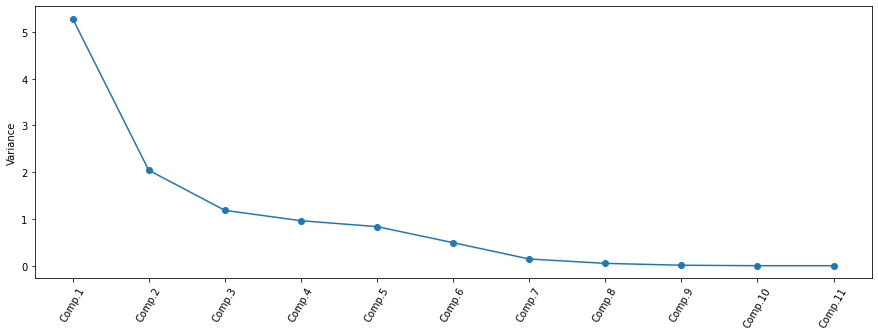

In [46]:
screeplot(pca,standard_sales_data)

### We must retain only the components having variance greater that 1 i.e. Comp.1,Comp.2 and Comp.3.

In [47]:
summary.sdev**2

,Standard deviation
PC1,5.282844e+00
PC2,2.040952e+00
PC3,1.183783e+00
PC4,9.620597e-01
PC5,8.350037e-01
PC6,4.924096e-01
PC7,1.433487e-01
PC8,4.975442e-02
PC9,9.844219e-03
PC10,1.231309e-31


## Loading for the principal components

#### The loadings for the principal components are stored in a named element components_ of the variable returned by PCA().fit().


In [48]:
pca.components_[0]

array([-0.01318736,  0.42625456, -0.03221174,  0.07977229,  0.43094958,
        0.43226419,  0.42030079,  0.41046851,  0.07337637,  0.29604097,
        0.00074446])

In [49]:
np.sum(pca.components_[0]**2)

0.9999999999999998

In [50]:
def calcpc(variables, loadings):
    # find the number of samples in the data set and the number of variables
    numsamples, numvariables = variables.shape
    # make a vector to store the component
    pc = np.zeros(numsamples)
    # calculate the value of the component for each sample
    for i in range(numsamples):
        valuei = 0
        for j in range(numvariables):
            valueij = variables.iloc[i, j]
            loadingj = loadings[j]
            valuei = valuei + (valueij * loadingj)
        pc[i] = valuei
    return pc

In [51]:
calcpc(standard_sales_data,pca.components_[0])

array([-0.3817261 , -0.47280402, 41.54191111, ..., -0.58280867,
       10.28394927, 10.46868881])

In [52]:
pca.transform(standard_sales_data)[:,0]

array([-0.3817261 , -0.47280402, 41.54191111, ..., -0.58280867,
       10.28394927, 10.46868881])

In [53]:
pca.components_[1]

array([-0.00728509,  0.03246269,  0.1322648 , -0.67923717,  0.01292229,
        0.02290346,  0.01412405,  0.01023796, -0.68176466,  0.23284663,
       -0.00441854])

In [54]:
np.sum(pca.components_[1]**2)

1.0000000000000016

## Normal Distribution

In [70]:
mu = np.mean(standard_sales_data)
va = np.var(standard_sales_data)
sigma = np.std(standard_sales_data)
array_a = []
i=0
while(i<len(mu)):
    array_a.append((mu[i],va[i],sigma[i]))
    i=i+1
array_a

[(4.489439275341878e-16, 1.0000000000000882, 1.000000000000044),
 (2.9313487752108775e-17, 0.999999999999983, 0.9999999999999915),
 (-5.64366455182745e-16, 1.0000000000001679, 1.000000000000084),
 (6.117106209408027e-17, 1.0000000000000193, 1.0000000000000095),
 (-4.391568765839582e-17, 1.000000000000003, 1.0000000000000016),
 (-1.0913469150878137e-16, 1.0000000000000182, 1.000000000000009),
 (8.275099413274727e-17, 1.0000000000000158, 1.0000000000000078),
 (-5.806595181518199e-17, 0.9999999999999932, 0.9999999999999966),
 (-7.218115199140341e-17, 0.9999999999999888, 0.9999999999999943),
 (-1.7013432969787855e-15, 0.9999999999997351, 0.9999999999998676),
 (1.217561661129456e-15, 1.000000000000129, 1.0000000000000644)]

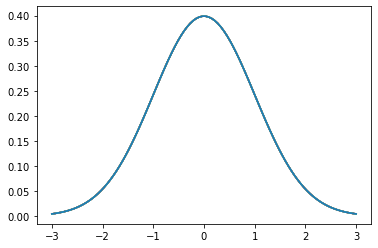

In [75]:
for item in array_a:
    x=np.linspace(item[0]-3*item[1],item[0]+3*item[1],100)
    plt.plot(x,stats.norm.pdf(x,item[0],item[2]))

## Standard Normal Distribution

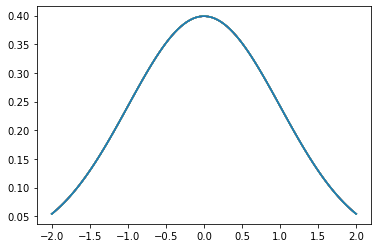

In [101]:
for item in array_a:
    x=np.linspace(item[0]-2*item[1],item[0]+2*item[1],100)
    plt.plot(x,stats.norm.pdf(x,item[0],item[2]))

### The standardised sales data dataframe follows standard normal distribution. 